# Fine Grain Clustering of B/Plasma Cells

In [11]:
library(Seurat)
library(dplyr)
library(ggplot2)
library(tidyr)
library(viridis)
library(stringr)
library(pheatmap)
library(presto)
library(pals)
library(harmony)
library(singlecellmethods)
library(lisi)
library(RSpectra)
source("/data/srlab/anathan/scripts/scseq_utils.R")
library(parallel)




# weighted PCA is in immunogenomics/singlecellmethods, function weighted_pca
weighted_pca <- function(X, weights, genes_use=NULL, npc=20, do_corr=TRUE, scale_thresh=10) {
    if (!identical(length(weights), ncol(X))) {
        stop('Columns in X must match length of weights')
    }
    
#     y <- factor(y)
#     weights <- as.numeric((1 / prop.table(table(y)))[y]) / nlevels(y)
    if (any(is.na(weights))) {
        idx_keep <- which(is.na(weights))
#         y <- y[idx_keep]
        weights <- weights[idx_keep]
        X <- X[, idx_keep]
    }
    if (is.null(genes_use)) {
        genes_use <- row.names(X)
    } else if (length(genes_use) < nrow(X)) {
        if (any(!genes_use %in% row.names(X))) {
            stop('genes_use not in rownames of X')
        }
        X <- X[genes_use, ]
    }
    
    ## weighted z-scores
#     mu <- X %>% apply(1, function(x) {SDMTools:::wt.mean(x, weights)})
#     sig <- X %>% apply(1, function(x) {SDMTools:::wt.sd(x, weights)})
    mu <- singlecellmethods::rowMeans(X, weights = weights)
    sig <- singlecellmethods::rowSDs(X, weights = weights)
    
    # Added 12/9/19: save weighted scaling means and std devs
    vargenes_means_sds <- tibble(
        symbol = genes_use,
        mean = mu
    )
    vargenes_means_sds$stddev <- sig
    # finish added 12/9/19
    
    X <- scaleDataWithStats(X, mu, sig) 
    X <- X[which(is.na(rowSums(X)) == 0), ]
    if (do_corr) {
        X <- X %>% scale() %>% pmin(scale_thresh) %>% pmax(-scale_thresh)
    }
    
    ## weighted SVD
#     pres <- rsvd::rsvd(X %*% Matrix::Diagonal(x = sqrt(weights)), k = npc)
    pres <- RSpectra::svds(X %*% Matrix::Diagonal(x = sqrt(weights)), npc)
    V <- (Matrix::Diagonal(x = 1 / sqrt(weights)) %*% pres$v) %*% diag(pres$d)
    V <- as.matrix(V)
    colnames(V) <- paste0('PC', 1:npc)
    row.names(V) <- colnames(X)
    colnames(pres$u) <- paste0('PC', 1:npc)
    row.names(pres$u) <- row.names(X)
    return(list(loadings = pres$u, embeddings = V, vargenes = vargenes_means_sds))
}

# Cosine normalize values
cosine_normalize <- function(X, MARGIN = 1, do_safe = TRUE) {
    if (do_safe) {
        X <- sweep(X, MARGIN, apply(X, MARGIN, max), "/")
    }
    sweep(X, MARGIN, apply(X, MARGIN, function(x) sqrt(sum(x^2))), "/")
}
                           
                                                    
do_pca <- function(X, weights, genes_use=NULL, npc=10, do_corr=TRUE) {
    if (is.null(genes_use)) {
        genes_use <- row.names(X)
    }
    mu <- X[genes_use, ] %>% apply(1, function(x) {SDMTools:::wt.mean(x, weights)})
    sig <- X[genes_use, ] %>% apply(1, function(x) {SDMTools:::wt.sd(x, weights)})
    
    X <- X[genes_use, ] %>% scaleDataWithStats(mu, sig) 
    X <- X[which(is.na(rowSums(X)) == 0), ]
    if (do_corr) {
        X <- scale(X)
    }
    pres <- rsvd::rsvd(X, k = npc)
    V <- pres$v %*% diag(pres$d)
    V <- data.table(V)
    colnames(V) <- paste0('PC', 1:npc)
    return(V)    
}
                           
get_stats <- function(X, weights, genes_use=NULL) {
    if (is.null(genes_use)) {
        genes_use <- row.names(X)
    }
    mu <- X[genes_use, ] %>% apply(1, function(x) {SDMTools:::wt.mean(x, weights)})
    sig <- X[genes_use, ] %>% apply(1, function(x) {SDMTools:::wt.sd(x, weights)})
    return(list(mu = mu, sig = sig))
}
                           
                           
vargenes_vst <- function(object, groups, topn, loess.span = 0.3) {
    clip.max <- sqrt(ncol(object))

    N <- ncol(object)
    if (missing(groups)) {
        groups <- rep('A', N)
    }
    
    res <- split(seq_len(N), groups) %>% lapply(function(idx) {
        object_group <- object[, idx]
        ## row means
        hvf.info <- data.frame(
          symbol = rownames(object_group), 
          mean = Matrix::rowMeans(object_group)
        )

        ## row vars
        hvf.info$variance <- rowVars(object_group, hvf.info$mean)

        ## initialize
        hvf.info$variance.expected <- 0
        hvf.info$variance.standardized <- 0

        not.const <- hvf.info$variance > 0

        ## loess curve fit 
        suppressWarnings({
            fit <- loess(formula = log10(variance) ~ log10(mean), 
                data = hvf.info[not.const, ], span = loess.span)            
        })

        ## extract fitted variance 
        hvf.info$variance.expected[not.const] <- 10^fit$fitted

        ## get row standard deviations after clipping
        hvf.info$variance.standardized <- rowVarsStd(
            object_group, 
            hvf.info$mean, 
            sqrt(hvf.info$variance.expected), 
            clip.max
        )

        hvf.info <- hvf.info %>% 
#             tibble::rownames_to_column('symbol') %>% 
            arrange(-variance.standardized) %>% 
            tibble::rowid_to_column('rank') %>% 
            transform(group = unique(groups[idx]))

        return(hvf.info)        
    })
    
    
    if (missing(topn)) {
        ## MODE 1: return table 
        res <- Reduce(rbind, res) %>% 
            dplyr::select(group, symbol, rank, everything())

        if (length(unique(res$group)) == 1) {
            res$group <- NULL
        }
    } else {
        ## MODE 2: return genes
        res <- lapply(res, function(x) head(x, topn)$symbol)
    }
    return(res)
}
                      
                      
plot_clusters3 <- function(cluster_ids, labels, pt_size = 20, label_size, umap_use = umap_post,
                           do_labels = FALSE,
                           do_points = TRUE, do_density = FALSE, alpha_pt = 1, min_cluster_size = 20) {
    cluster_table <- table(cluster_ids)
    plt_df <- umap_use %>% data.frame() %>% cbind(cluster = cluster_ids) %>% cbind(cluster_label = labels)
    factor_levels <- plt_df %>% select(cluster_label, cluster) %>% unique() %>% arrange(as.numeric(cluster)) %>% pull(cluster_label)
    plt <- plt_df %>%
        dplyr::sample_frac(1L) %>%
        ggplot(aes(hUMAP1, hUMAP2, col = factor(cluster_label, levels = factor_levels), fill = factor(cluster_label, factor_levels)))
    if (do_points)
        plt <- plt + geom_point(alpha = alpha_pt, size = 0.5) + theme_classic()
    if (do_density)
        plt <- plt + geom_density_2d()


    plt <- plt +
     #   theme_tufte() +
#         theme(axis.line = element_line()) +
        guides(color = guide_legend(override.aes = list(size = 6))) +
#         scale_color_manual(values = sample(unique(singler.colors))) +
#         scale_color_manual(values = palette_use) +
        labs(x = "UMAP 1", y = "UMAP 2") +
        theme(plot.title = element_text(hjust = .5))

    if (do_labels)
        plt <- plt + ggrepel::geom_label_repel(data = data.table(plt_df)[, .(hUMAP1 = mean(hUMAP1), hUMAP2 = mean(hUMAP2)), by = .(cluster)], label.size = NA,
                                aes(label = cluster), color = "white", size = label_size,  max.overlaps = 15) +
        guides(col = FALSE, fill = FALSE) +
#         scale_fill_manual(values = palette_use) +
        NULL
    return(plt)
}

plot_shuffled_features <- function(ab, umap, exprs, pct) {
    library(viridis)
    max.cutoff = quantile(exprs[ab,], pct)
    min.cutoff = quantile(exprs[ab,], 1-pct)
    
    tmp <- sapply(X = exprs[ab,], FUN = function(x) {
        return(ifelse(test = x > max.cutoff, yes = max.cutoff,
            no = x))
    })
    tmp <- sapply(X = tmp, FUN = function(x) {
        return(ifelse(test = x < min.cutoff, yes = min.cutoff,
            no = x))
    })
    umap_res_plot <- cbind(umap, tmp)
    return(ggplot(data = as.data.frame(umap_res_plot)[sample(nrow(umap_res_plot)),] , aes(x = V1, y = V2)) +
      geom_point(mapping = aes(color = tmp), size = 0.75) +
      scale_color_viridis(option = "inferno", end = pct) +
      theme_classic() +
      theme(plot.title = element_text(size = 15), legend.position = "none") +
      labs(title = ab, x = 'hUMAP1', y = 'hUMAP2', color = "Normalized Expression"))
}
                           fig.size <- function (height, width) {
    options(repr.plot.height = height, repr.plot.width = width, repr.plot.res = 300)
}

In [36]:
temp_meta <- readRDS('/data/srlab2/jmears/jupyter/SLE_Phase2_Kidney_Analysis/nuc-seq-output/full_metadata/meta_all_filtered_500nGene_0.01pctmtUMI7500uppernGene_1000nUMI_40000uppernUMI_doublet_removal.rds')

In [37]:
meta <- readRDS("/data/srlab/ssg34/SLE_kidney/data/all_immune/all_immune_cells.integrated.consolidated_clusters.rds")@meta.data

In [38]:
doublet_meta <- rbind(temp_meta %>% select(cells, doublet_score_scrublet, isscrubletdoublet) %>% 
                      rename(doublet_score = doublet_score_scrublet, doublet_classification = isscrubletdoublet, cell = cells), 
                      meta %>% select(cells, doublet_score, doublet_classification) %>% rename(cell = cells)) 

## READ IN FILES

In [39]:
all_meta <- readRDS('/data/srlab2/qxiao/AMP-SLE/sc_nuc_data/meta_ScNuc_500nGene_1000nUMI_3pctnontargetMTwdoubletandsampleFINAL-8-10-22.rds')

In [9]:
norm <- readRDS('/data/srlab2/qxiao/AMP-SLE/sc_nuc_data/normalized_data_ScNuc_500nGene_1000nUMI_3pctnontargetMTwdoubletandsampleFINAL-8-10-22.rds')

In [41]:
BP_meta <- all_meta %>% filter(broad.type == 'B/Plasma')

In [42]:
BP_norm <- norm[, BP_meta$cell]

In [119]:
arnon_b_clusters <- read.csv('/data/srlab2/jmears/jupyter/SLE_Phase2_Kidney_Analysis/Final-Arnon-Output/all_b_cells.post_tSNE_clusters.rds')
arnon_plasma_clusters <- read.csv('/data/srlab2/jmears/jupyter/SLE_Phase2_Kidney_Analysis/Final-Arnon-Output/all_plasma_cells.post_tSNE_clusters.rds')

In [44]:
genes_exclude <- c(grep("^MT-|^RPL|^RPS|MALAT1|MIR-", row.names(norm), value = TRUE), Seurat::cc.genes$s.genes, Seurat::cc.genes$g2m.genes) 

In [45]:
rm(norm)

## QC CLUSTERING

In [123]:
nuc_norm <- BP_norm[, BP_meta %>% filter(dataset == 'snRNAseq') %>% pull(cell)]

sc_norm <- BP_norm[, BP_meta %>% filter(dataset == 'scRNAseq') %>% pull(cell)]

nuc_meta <- BP_meta %>% filter(dataset == 'snRNAseq')

sc_meta <- BP_meta %>% filter(dataset == 'scRNAseq')

In [47]:
## Filtering for expressed genes
threshold_genes <- nuc_norm[rownames(nuc_norm[rowMeans(nuc_norm) >= .01, ]), ]

samples_25 <- nuc_meta %>% group_by(sample) %>% tally() %>% filter(n > 25) %>% pull(sample)

threshold_samples <- threshold_genes[, nuc_meta %>% filter(sample %in% samples_25) %>% pull(cell)]
 
## Variable gene selection — very inefficiently written, but essentially using VST to select most variable genes from samples with > 10 cells
var_genes_raw <- singlecellmethods::vargenes_vst(object = threshold_samples, groups = nuc_meta %>% filter(sample %in% samples_25) %>% pull(sample), topn = 500)

In [48]:
## Scale Data
bp_scaled_nuc <- nuc_norm[var_genes_raw[! var_genes_raw %in% genes_exclude], ] %>% scaleData
## PCA
bp_pca_res_nuc <- irlba::prcomp_irlba(t(bp_scaled_nuc), 20)
## UMAP
bp_umap_res_nuc <- uwot::umap(bp_pca_res_nuc$x[, 1:20], n_neighbors = 30L, metric = "euclidean", min_dist = .1)

In [49]:
## Filtering for expressed genes
threshold_genes <- sc_norm[rownames(sc_norm[rowMeans(sc_norm) >= .01, ]), ]

samples_25 <- sc_meta %>% group_by(sample) %>% tally() %>% filter(n > 25) %>% pull(sample)

threshold_samples <- threshold_genes[, sc_meta %>% filter(sample %in% samples_25) %>% pull(cell)]

## Variable gene selection — very inefficiently written, but essentially using VST to select most variable genes from samples with > 100 cells
var_genes_raw <- singlecellmethods::vargenes_vst(object = threshold_samples, groups = sc_meta %>% filter(sample %in% samples_25) %>% pull(sample), topn = 500)

In [50]:
## Scale Data
bp_scaled_sc <- sc_norm[var_genes_raw[!var_genes_raw %in% genes_exclude], ] %>% scaleData
## PCA
bp_pca_res_sc <- irlba::prcomp_irlba(t(bp_scaled_sc), 20)
## UMAP
bp_umap_res_sc <- uwot::umap(bp_pca_res_sc$x[, 1:20], n_neighbors = 30L, metric = "euclidean", min_dist = .1)

In [51]:
bp_sc_lisi <- compute_lisi(bp_pca_res_sc$x[, 1:20], sc_meta, c('Site', 'processing.batch', 'sample'))
bp_nuc_lisi <- compute_lisi(bp_pca_res_nuc$x[, 1:20], nuc_meta, c('Site', 'processing.batch', 'sample'))

use_weights



[1] FALSE


use_weights

use_weights



[1] FALSE


use_weights

Harmony 1/20

Harmony 2/20

Harmony 3/20

Harmony 4/20

Harmony 5/20

Harmony 6/20

Harmony 7/20

Harmony 8/20

Harmony 9/20

Harmony 10/20

Harmony 11/20

Harmony 12/20

Harmony 13/20

Harmony 14/20

Harmony 15/20

Harmony 16/20

Harmony 17/20

Harmony 18/20

Harmony 19/20

Harmony 20/20



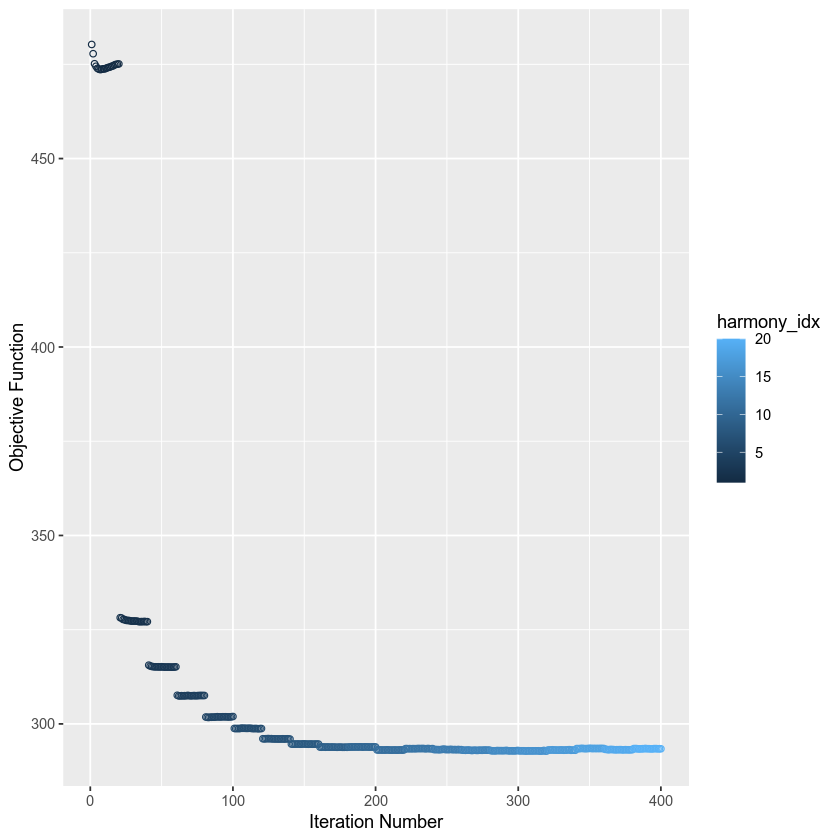

In [52]:
bp_harmony_nuc <- HarmonyMatrix(bp_pca_res_nuc$x[, 1:20], nuc_meta, 
                                     vars_use = c("sample", "processing.batch", "Site"), theta = c(2, 1, 1),
                        # lambda = 1, 
                        # tau = 0, 
                        epsilon.cluster = -Inf,
                        epsilon.harmony = -Inf,
                        max.iter.cluster = 20,
                        max.iter.harmony = 20,
                        plot_convergence = TRUE,
                        npcs = 20, do_pca = FALSE)

use_weights



[1] FALSE


use_weights

use_weights



[1] FALSE


use_weights

Harmony 1/20

Harmony 2/20

Harmony 3/20

Harmony 4/20

Harmony 5/20

Harmony 6/20

Harmony 7/20

Harmony 8/20

Harmony 9/20

Harmony 10/20

Harmony 11/20

Harmony 12/20

Harmony 13/20

Harmony 14/20

Harmony 15/20

Harmony 16/20

Harmony 17/20

Harmony 18/20

Harmony 19/20

Harmony 20/20



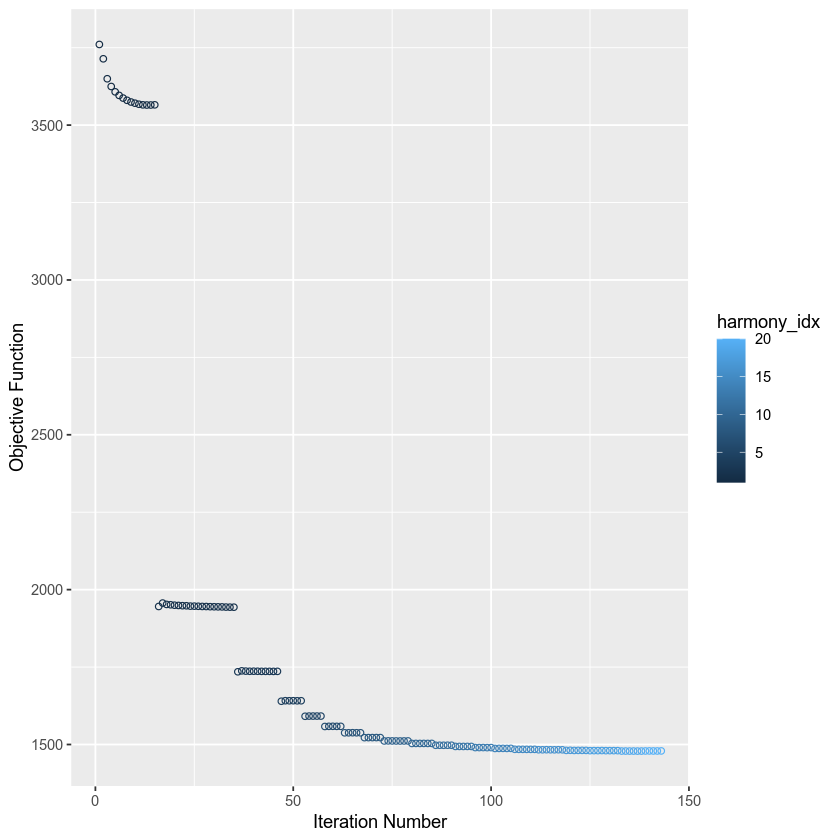

In [53]:
bp_harmony_sc <- HarmonyMatrix(bp_pca_res_sc$x[, 1:20], sc_meta, 
                                     vars_use = c("sample", "processing.batch", "Site"), theta = c(2, 1, 1),
                        # lambda = 1, 
                        # tau = 0, 
                        epsilon.harmony = -Inf,
                        max.iter.cluster = 20,
                        max.iter.harmony = 20,
                        plot_convergence = TRUE,
                        npcs = 20, do_pca = FALSE)

In [54]:
bp_humap_res_nuc <- uwot::umap(bp_harmony_nuc[, 1:20], n_neighbors = 30L, metric = "euclidean", min_dist = .1)

In [55]:
bp_humap_res_sc <- uwot::umap(bp_harmony_sc[, 1:20], n_neighbors = 30L, metric = "euclidean", min_dist = .1)

In [60]:
bp_sc_lisi_harmony <- compute_lisi(bp_harmony_sc[, 1:20], sc_meta, c('Site', 'processing.batch', 'sample'))
bp_nuc_lisi_harmony <- compute_lisi(bp_harmony_nuc[, 1:20], nuc_meta, c('Site', 'processing.batch', 'sample'))

In [61]:
sc_lisi <- rbind(bp_sc_lisi %>% mutate(status = 'preharmony'), bp_sc_lisi_harmony %>% mutate(status = 'postharmony'))
nuc_lisi <- rbind(bp_nuc_lisi %>% mutate(status = 'preharmony'), bp_nuc_lisi_harmny %>% mutate(status = 'postharmony'))

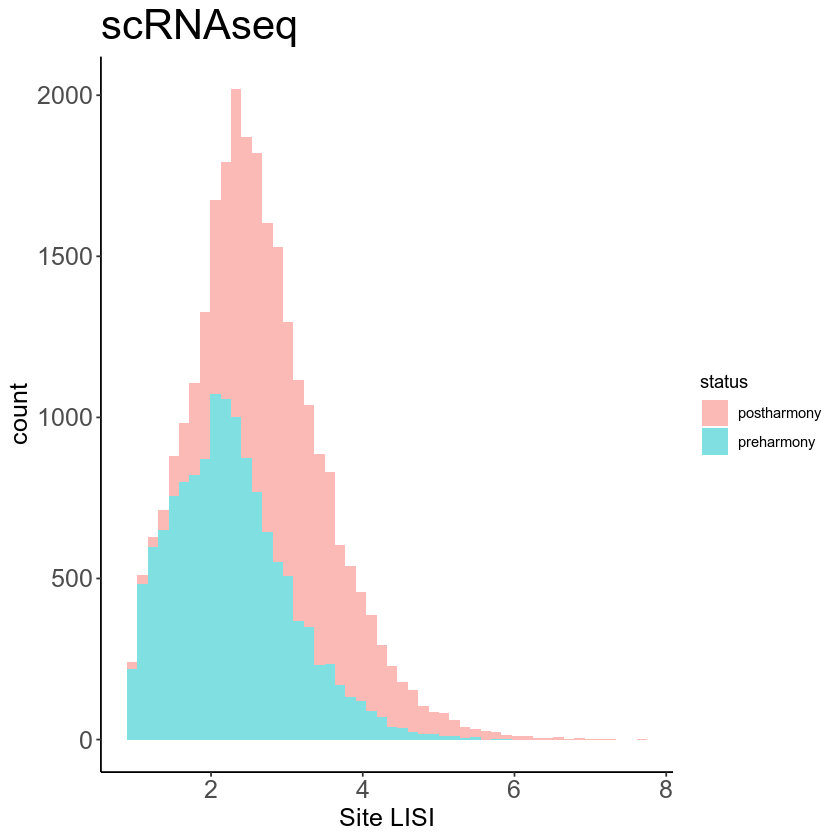

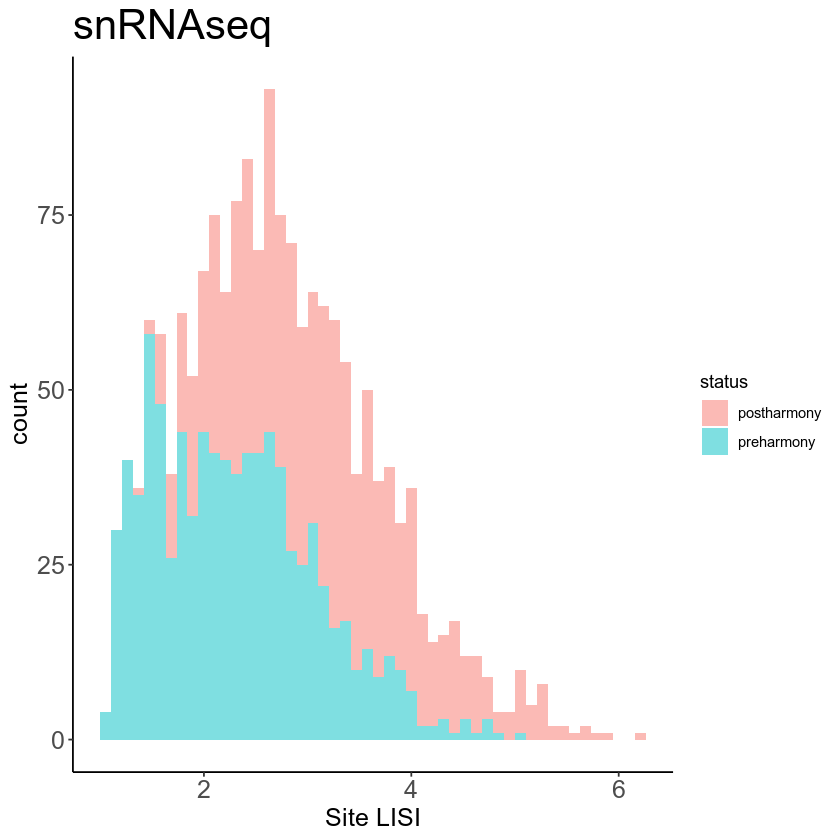

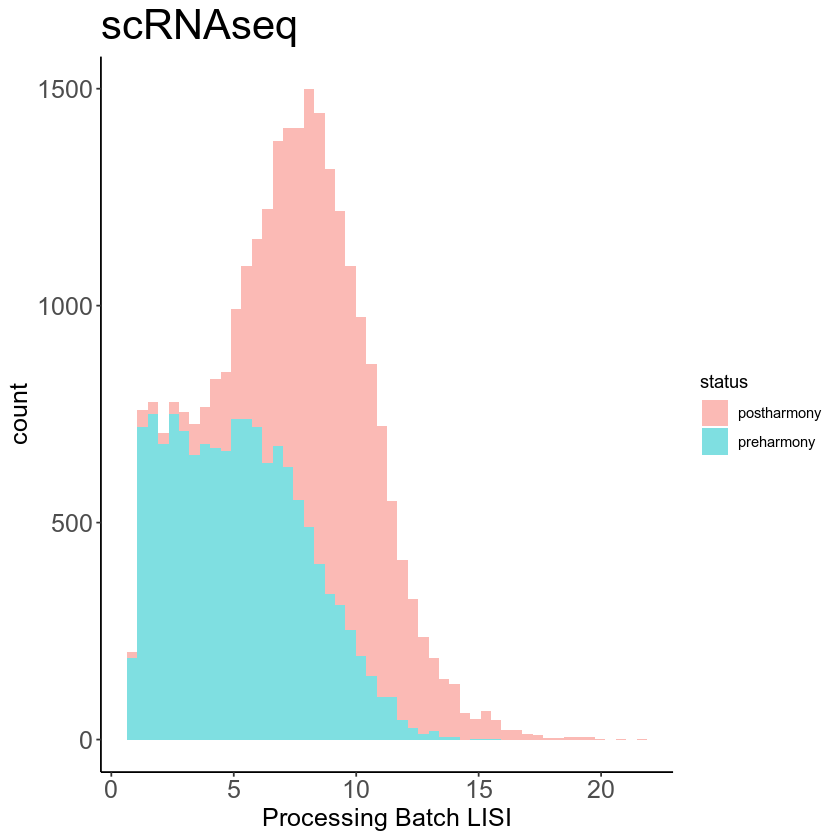

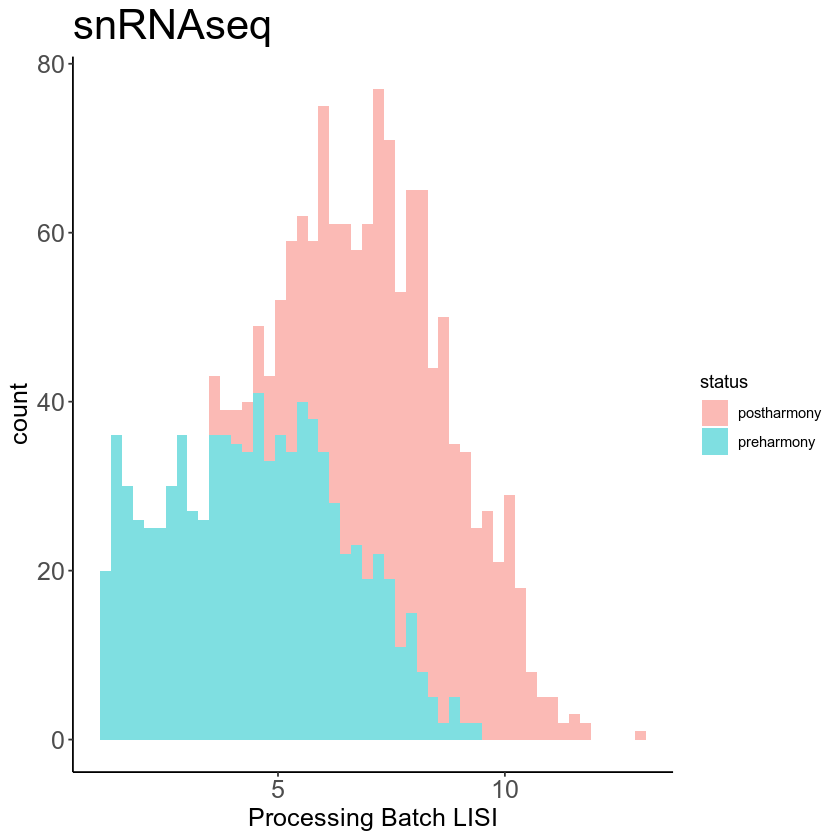

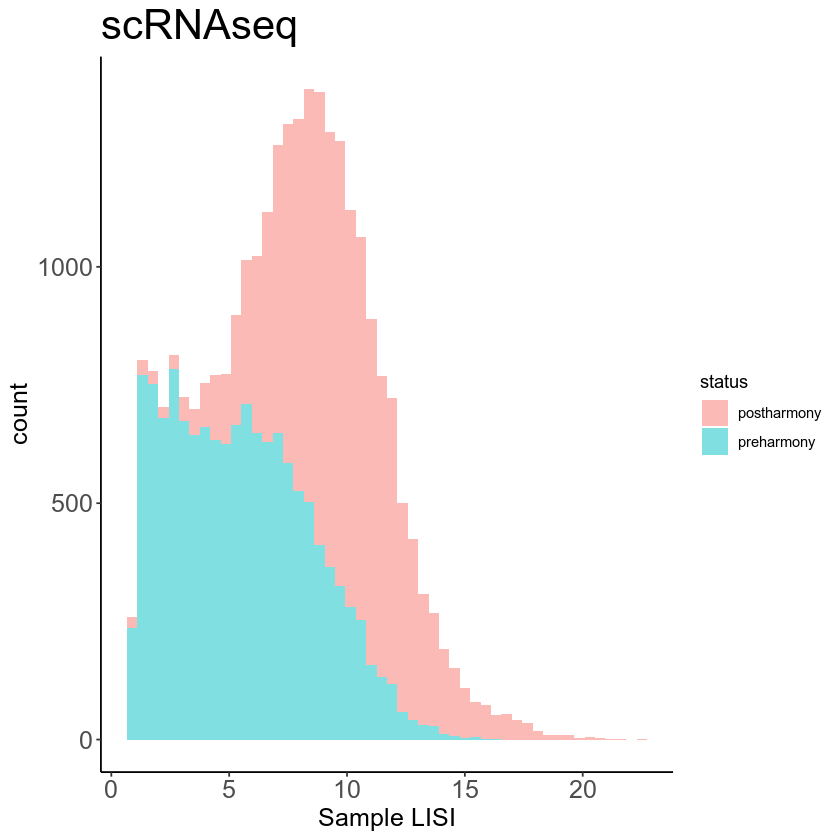

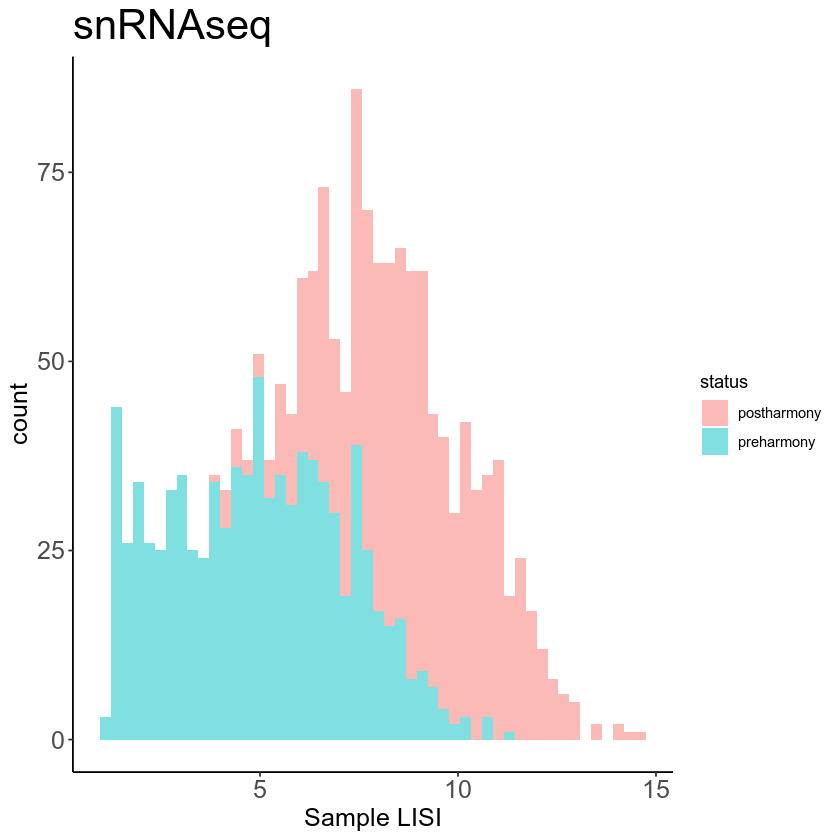

In [62]:
ggplot(sc_lisi, aes(x = Site, y = ..count.., fill = status)) + 
    geom_histogram(alpha = 0.5, bins = 50) + 
    theme_classic() +
    labs(x = 'Site LISI', title = 'scRNAseq')  +
    theme(axis.text = element_text(size = 15), axis.title = element_text(size = 15), plot.title = element_text(size = 25)) 


ggplot(nuc_lisi, aes(x = Site, y = ..count.., fill = status)) + 
    geom_histogram(alpha = 0.5, bins = 50) + 
    theme_classic() +
    labs(x = 'Site LISI', title = 'snRNAseq') +
    theme(axis.text = element_text(size = 15), axis.title = element_text(size = 15), plot.title = element_text(size = 25)) 



ggplot(sc_lisi, aes(x = processing.batch, y = ..count.., fill = status)) + 
    geom_histogram(alpha = 0.5, bins = 50) + 
    theme_classic() +
    labs(x = 'Processing Batch LISI', title = 'scRNAseq') + 
    theme(axis.text = element_text(size = 15), axis.title = element_text(size = 15), plot.title = element_text(size = 25)) 


ggplot(nuc_lisi, aes(x = processing.batch, y = ..count.., fill = status)) + 
    geom_histogram(alpha = 0.5, bins = 50) + 
    theme_classic() +
    labs(x = 'Processing Batch LISI', title = 'snRNAseq') +
    theme(axis.text = element_text(size = 15), axis.title = element_text(size = 15), plot.title = element_text(size = 25)) 



ggplot(sc_lisi, aes(x = sample, y = ..count.., fill = status)) + 
    geom_histogram(alpha = 0.5, bins = 50) + 
    theme_classic() +
    labs(x = 'Sample LISI', title = 'scRNAseq') +
    theme(axis.text = element_text(size = 15), axis.title = element_text(size = 15), plot.title = element_text(size = 25)) 


ggplot(nuc_lisi, aes(x = sample, y = ..count.., fill = status)) + 
    geom_histogram(alpha = 0.5, bins = 50) + 
    theme_classic() +
    labs(x = 'Sample LISI', title = 'snRNAseq') +
    theme(axis.text = element_text(size = 15), axis.title = element_text(size = 15), plot.title = element_text(size = 25)) 

In [124]:
snn_ref <- BuildSNNSeurat(bp_harmony_sc[,1:20], nn.eps = 0)

resolution_list <- c(2.0)
ids_ref_sc <- Reduce(cbind, mclapply(resolution_list, function(res_use) {
    Seurat:::RunModularityClustering(SNN = snn_ref, modularity = 1,
        resolution = res_use, algorithm = 1, n.start = 20,
        n.iter = 20, random.seed = 100, print.output = FALSE,
        temp.file.location = NULL, edge.file.name = NULL)
}, mc.preschedule = FALSE, mc.cores = min(20, length(resolution_list)))) 

In [144]:
snn_ref <- BuildSNNSeurat(bp_harmony_nuc[,1:20], nn.eps = 0)

resolution_list <- c(4.0)
ids_ref_nuc <- Reduce(cbind, mclapply(resolution_list, function(res_use) {
    Seurat:::RunModularityClustering(SNN = snn_ref, modularity = 1,
        resolution = res_use, algorithm = 1, n.start = 20,
        n.iter = 20, random.seed = 100, print.output = FALSE,
        temp.file.location = NULL, edge.file.name = NULL)
}, mc.preschedule = FALSE, mc.cores = min(20, length(resolution_list)))) 

In [126]:
MYL <- c("AIF1", "LYZ", "FCGR3A", "CD14")

B <- c("MS4A1", "IGHG1", "MZB1")

T <- c("CD2", "CD3D")

EC <- c("ENG", "EGFL7", "EMCN")

IC <- c("ATP6V0D2", "ATP6V1G3", "SLC26A7")

PC_DCT_CNT <- c("CALB1", "FXYD4", "AQP2")

ATL_TAL <- c("SLC12A1", "SFRP1", "EGF")

FIB <- c("COL1A2", "COL1A1", "CCDC80")

POD <- c("PTGDS", "PODXL", "NPHS2")

PT1 <- c("SLC13A3", "SLC34A1", "LRP2")

In [127]:
nuc_meta <-nuc_meta %>% mutate(Myeloid = colMeans(nuc_norm[rownames(nuc_norm) %in% MYL, ]),
                                        T = colMeans(nuc_norm[rownames(nuc_norm) %in% T, ]), 
                                        B = colMeans(nuc_norm[rownames(nuc_norm) %in% B, ]),
                                        EC = colMeans(nuc_norm[rownames(nuc_norm) %in% EC, ]),
                                        IC = colMeans(nuc_norm[rownames(nuc_norm) %in% IC, ]),
                                        PC = colMeans(nuc_norm[rownames(nuc_norm) %in% PC_DCT_CNT, ]),
                                        ATL = colMeans(nuc_norm[rownames(nuc_norm) %in% ATL_TAL, ]),
                                        Fib = colMeans(nuc_norm[rownames(nuc_norm) %in% FIB, ]),
                                        Pod = colMeans(nuc_norm[rownames(nuc_norm) %in% POD, ]),
                                        PT = colMeans(nuc_norm[rownames(nuc_norm) %in% PT1, ]),
                                        qc_cluster = ids_ref_nuc)

sc_meta <- sc_meta %>% mutate(Myeloid = colMeans(sc_norm[rownames(sc_norm) %in% MYL, ]),
                                        T = colMeans(sc_norm[rownames(sc_norm) %in% T, ]), 
                                        B = colMeans(sc_norm[rownames(sc_norm) %in% B, ]),
                                        EC = colMeans(sc_norm[rownames(sc_norm) %in% EC, ]),
                                        IC = colMeans(sc_norm[rownames(sc_norm) %in% IC, ]),
                                        PC = colMeans(sc_norm[rownames(sc_norm) %in% PC_DCT_CNT, ]),
                                        ATL = colMeans(sc_norm[rownames(sc_norm) %in% ATL_TAL, ]),
                                        Fib = colMeans(sc_norm[rownames(sc_norm) %in% FIB, ]),
                                        Pod = colMeans(sc_norm[rownames(sc_norm) %in% POD, ]),
                                        PT = colSums(sc_norm[rownames(sc_norm) %in% PT1, ]),
                                        qc_cluster = ids_ref_sc)

In [128]:
nuc_meta <- left_join(nuc_meta, doublet_meta)

Joining, by = "cell"


In [129]:
sc_meta <- left_join(sc_meta , doublet_meta)

Joining, by = "cell"


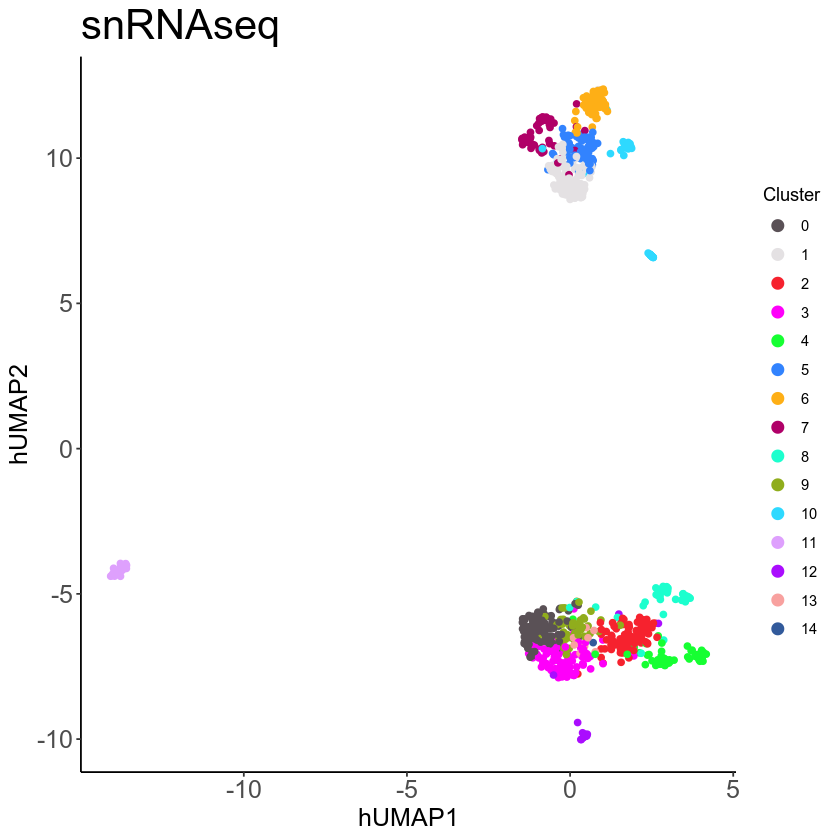

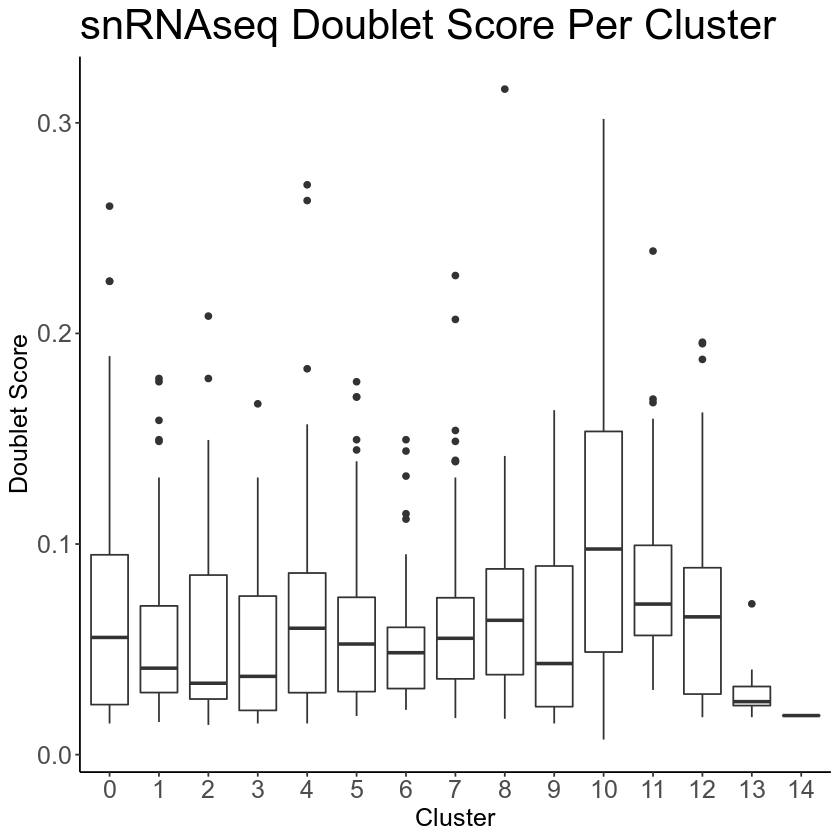

In [147]:
fig.size(7, 7)

ggplot(nuc_meta %>% mutate(hUMAP1 = bp_humap_res_nuc[, 1], 
                           hUMAP2 = bp_humap_res_nuc[, 2]), 
                           aes(x = hUMAP1, y = hUMAP2, color = as.factor(qc_cluster))) + 
    geom_point() + 
    theme_classic() +
    scale_color_manual(values = as.vector(polychrome(29)), drop = FALSE) +
    theme(axis.text = element_text(size = 15), axis.title = element_text(size = 15), plot.title = element_text(size = 25)) +
    labs(title = 'snRNAseq') +
    guides(colour = guide_legend(override.aes = list(size=3), title="Cluster"))



fig.size(7, 7)
ggplot(nuc_meta, aes(x = as.character(qc_cluster), y = doublet_score)) + 
    geom_boxplot() + 
    theme_classic() +
    scale_x_discrete(limits = factor(seq(0, 14))) + 
    theme(axis.text = element_text(size = 15), axis.title = element_text(size = 15), plot.title = element_text(size = 25)) +
    labs(x = 'Cluster', y = 'Doublet Score', title = 'snRNAseq Doublet Score Per Cluster')

Warning message:
“Removed 22 rows containing non-finite values (stat_boxplot).”


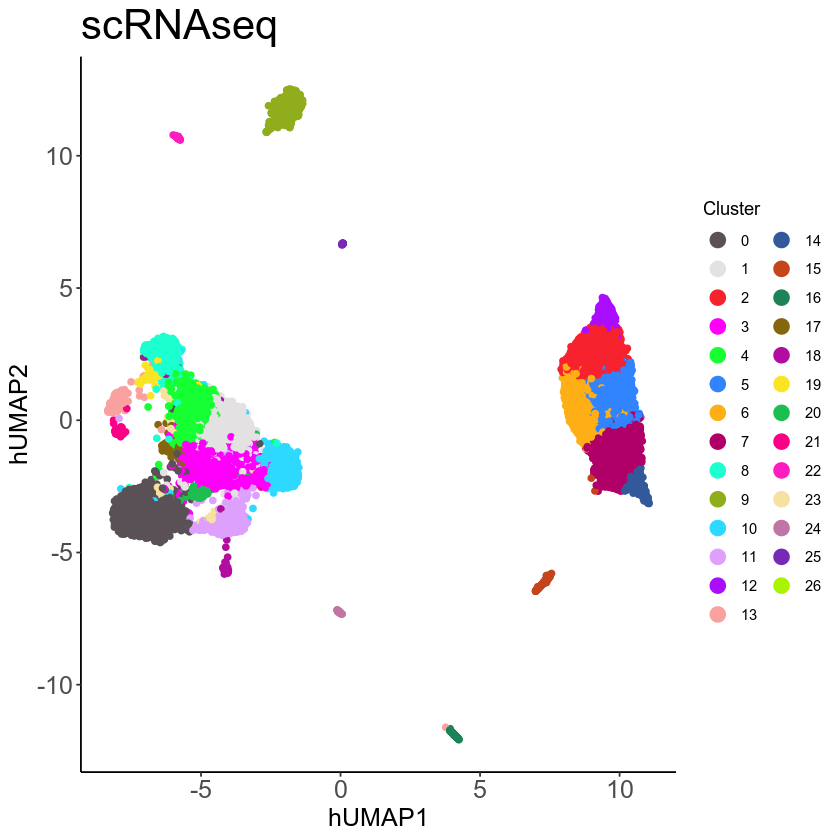

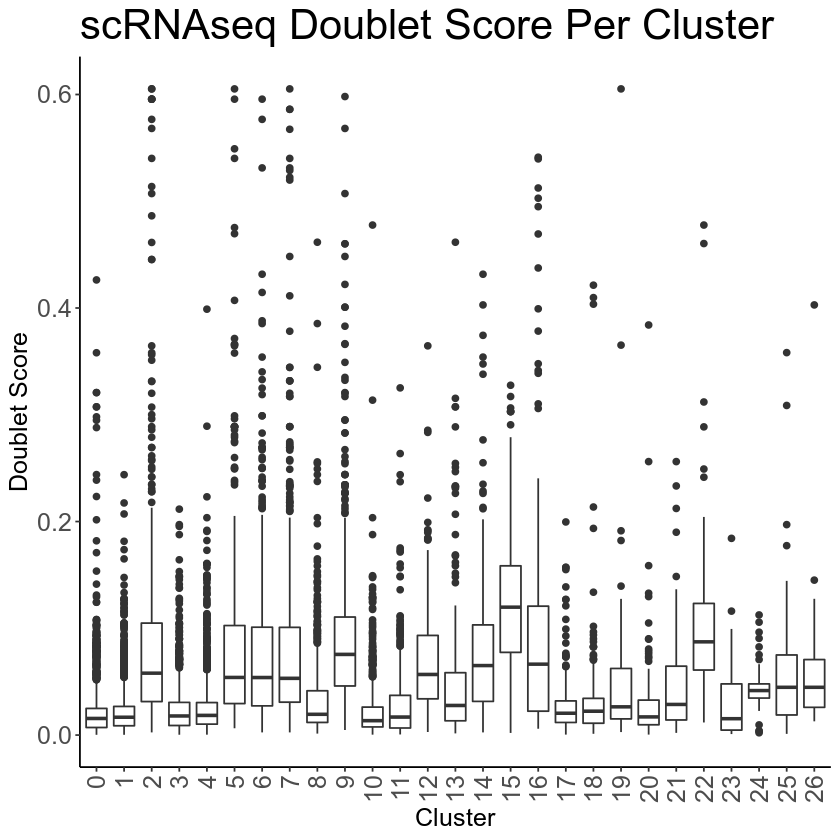

In [167]:
fig.size(7, 7)
ggplot(sc_meta %>% mutate(hUMAP1 = bp_humap_res_sc[, 1], 
                           hUMAP2 = bp_humap_res_sc[, 2]), 
                           aes(x = hUMAP1, y = hUMAP2, color = as.factor(qc_cluster))) + 
    geom_point() + 
    theme_classic() +
    scale_color_manual(values = as.vector(polychrome(36)), drop = FALSE) +
    theme(axis.text = element_text(size = 15), axis.title = element_text(size = 15), plot.title = element_text(size = 25)) +
    labs(title = 'scRNAseq') +
    guides(colour = guide_legend(override.aes = list(size=4), title="Cluster"))
fig.size(7, 7)
ggplot(sc_meta, aes(x = as.character(qc_cluster), y = doublet_score)) + 
    geom_boxplot() + 
    theme_classic() +
    scale_x_discrete(limits = factor(seq(0, 26))) + 
    theme(axis.text = element_text(size = 15), axis.title = element_text(size = 15), plot.title = element_text(size = 25)) +
    labs(x = 'Cluster', y = 'Doublet Score', title = 'scRNAseq Doublet Score Per Cluster') +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1))

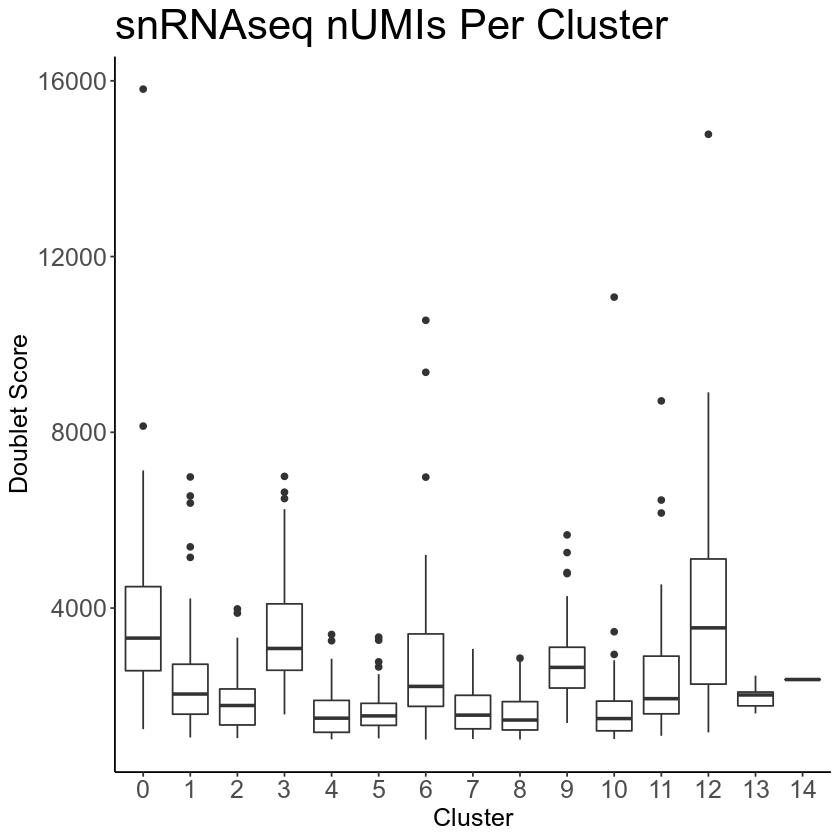

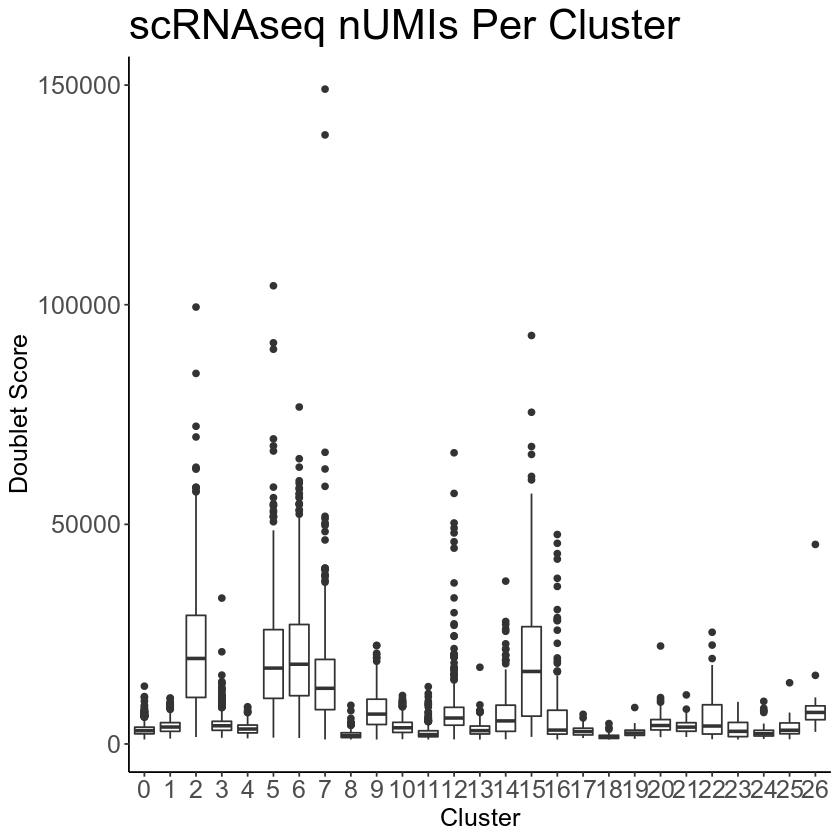

In [166]:
fig.size(7, 7)
ggplot(nuc_meta, aes(x = as.character(qc_cluster), y = nCount_RNA)) + 
    geom_boxplot() + 
    theme_classic() +
    scale_x_discrete(limits = factor(seq(0, 14))) + 
    theme(axis.text = element_text(size = 15), axis.title = element_text(size = 15), plot.title = element_text(size = 25)) +
    labs(x = 'Cluster', y = 'Doublet Score', title = 'snRNAseq nUMIs Per Cluster')

ggplot(sc_meta, aes(x = as.character(qc_cluster), y = nCount_RNA)) + 
    geom_boxplot() + 
    theme_classic() +
    scale_x_discrete(limits = factor(seq(0, 26))) + 
    theme(axis.text = element_text(size = 15), axis.title = element_text(size = 15), plot.title = element_text(size = 25)) +
    labs(x = 'Cluster', y = 'Doublet Score', title = 'scRNAseq nUMIs Per Cluster')

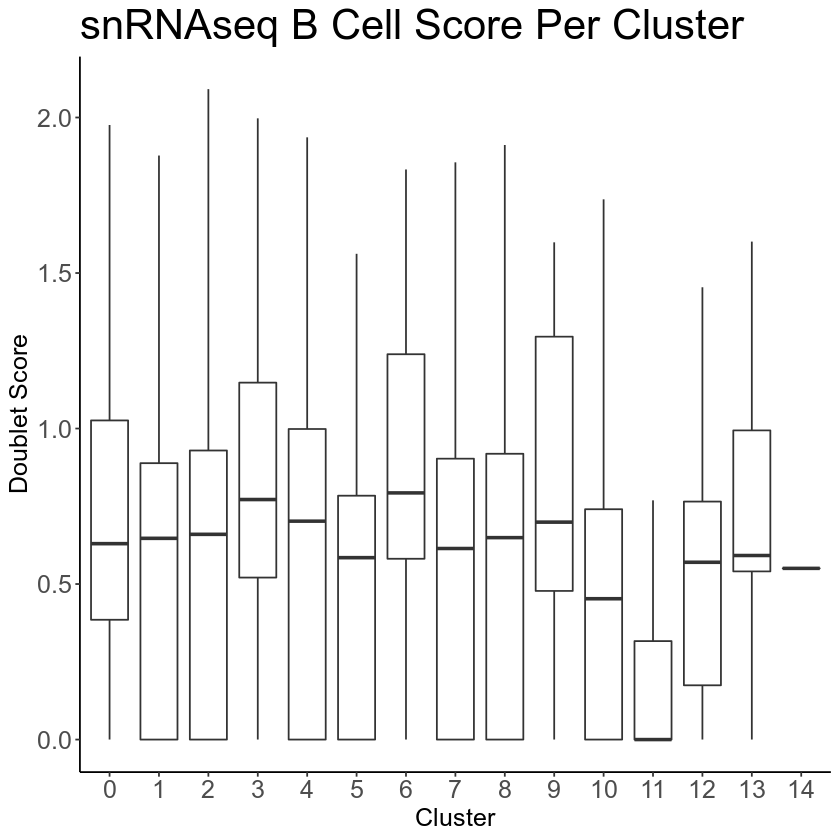

In [177]:
fig.size(7, 7)
ggplot(nuc_meta, aes(x = as.character(qc_cluster), y = B)) + 
    geom_boxplot() + 
    theme_classic() +
    scale_x_discrete(limits = factor(seq(0, 14))) + 
    theme(axis.text = element_text(size = 15), axis.title = element_text(size = 15), plot.title = element_text(size = 25)) +
    labs(x = 'Cluster', y = 'Doublet Score', title = 'snRNAseq B Cell Score Per Cluster')

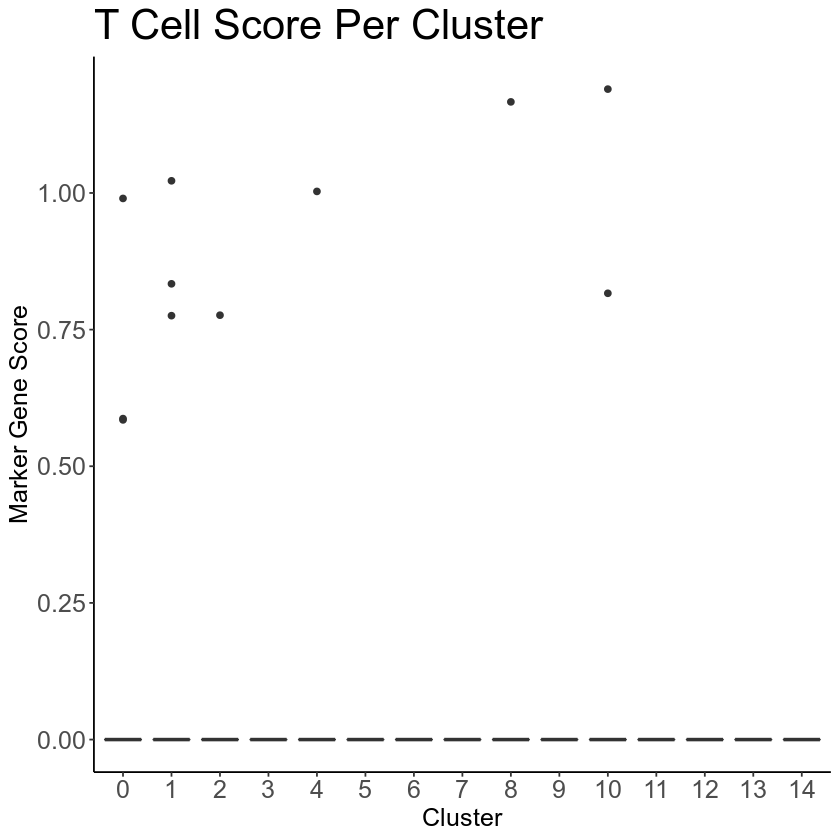

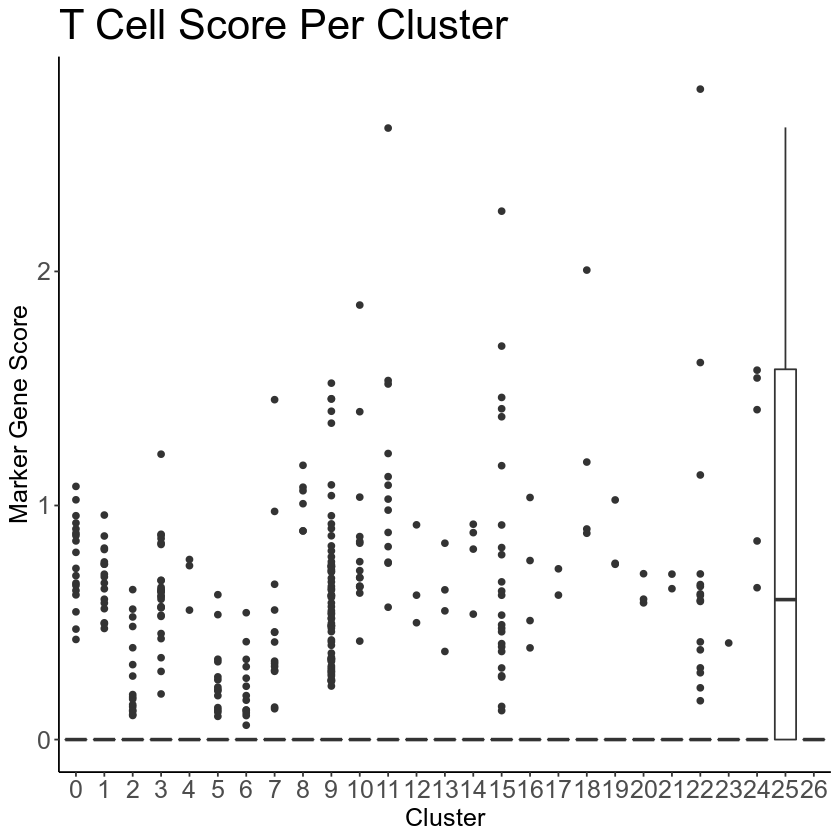

In [148]:
ggplot(nuc_meta, aes(x = as.character(qc_cluster), y = T)) + 
    geom_boxplot() + 
    theme_classic() +
    scale_x_discrete(limits = factor(seq(0, 14))) + 
    theme(axis.text = element_text(size = 15), axis.title = element_text(size = 15), plot.title = element_text(size = 25)) +
    labs(x = 'Cluster', y = 'Marker Gene Score', title = 'T Cell Score Per Cluster')

ggplot(sc_meta, aes(x = as.character(qc_cluster), y = T)) + 
    geom_boxplot() + 
    theme_classic() +
    scale_x_discrete(limits = factor(seq(0, 26))) + 
    theme(axis.text = element_text(size = 15), axis.title = element_text(size = 15), plot.title = element_text(size = 25)) +
    labs(x = 'Cluster', y = 'Marker Gene Score', title = 'T Cell Score Per Cluster')

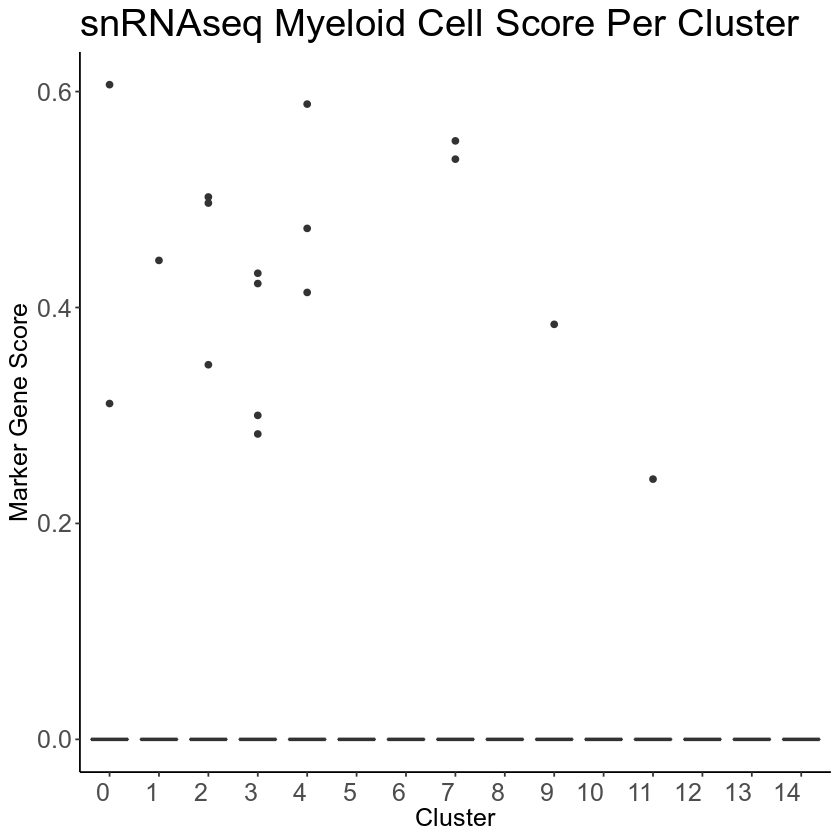

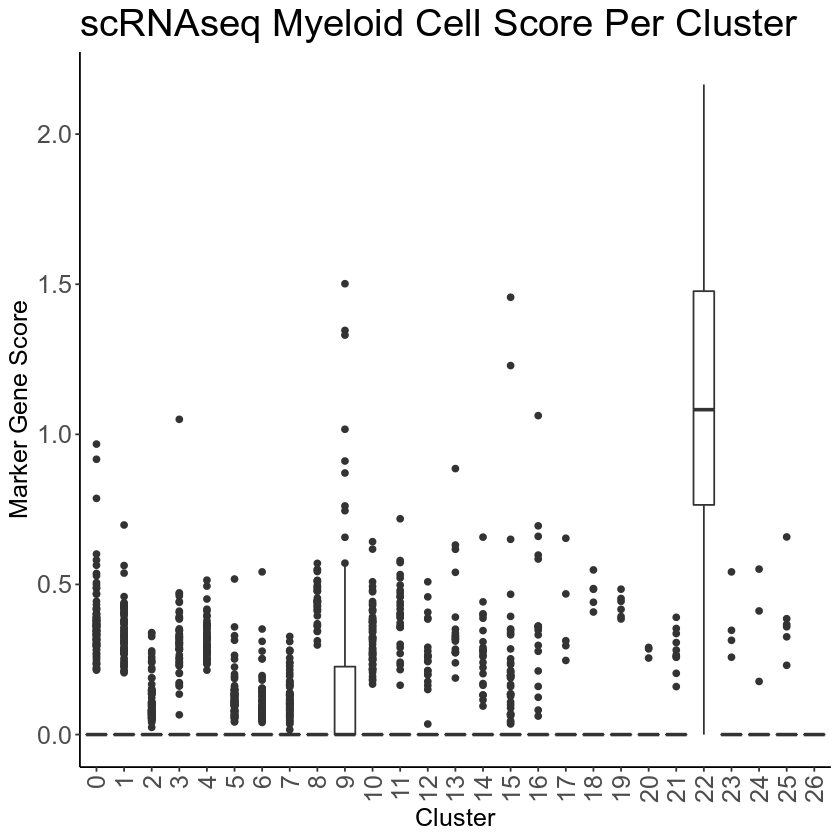

In [149]:
ggplot(nuc_meta, aes(x = as.character(qc_cluster), y = Myeloid)) + 
    geom_boxplot() + 
    theme_classic() +
    scale_x_discrete(limits = factor(seq(0, 14))) + 
    theme(axis.text = element_text(size = 15), axis.title = element_text(size = 15), plot.title = element_text(size = 23)) +
    labs(x = 'Cluster', y = 'Marker Gene Score', title = 'snRNAseq Myeloid Cell Score Per Cluster') +
    theme(axis.text.x = element_text(vjust = 0.5, hjust=1))
ggplot(sc_meta, aes(x = as.character(qc_cluster), y = Myeloid)) + 
    geom_boxplot() + 
    theme_classic() +
    scale_x_discrete(limits = factor(seq(0, 26))) + 
    theme(axis.text = element_text(size = 15), axis.title = element_text(size = 15), plot.title = element_text(size = 23)) +
    labs(x = 'Cluster', y = 'Marker Gene Score', title = 'scRNAseq Myeloid Cell Score Per Cluster') +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1))

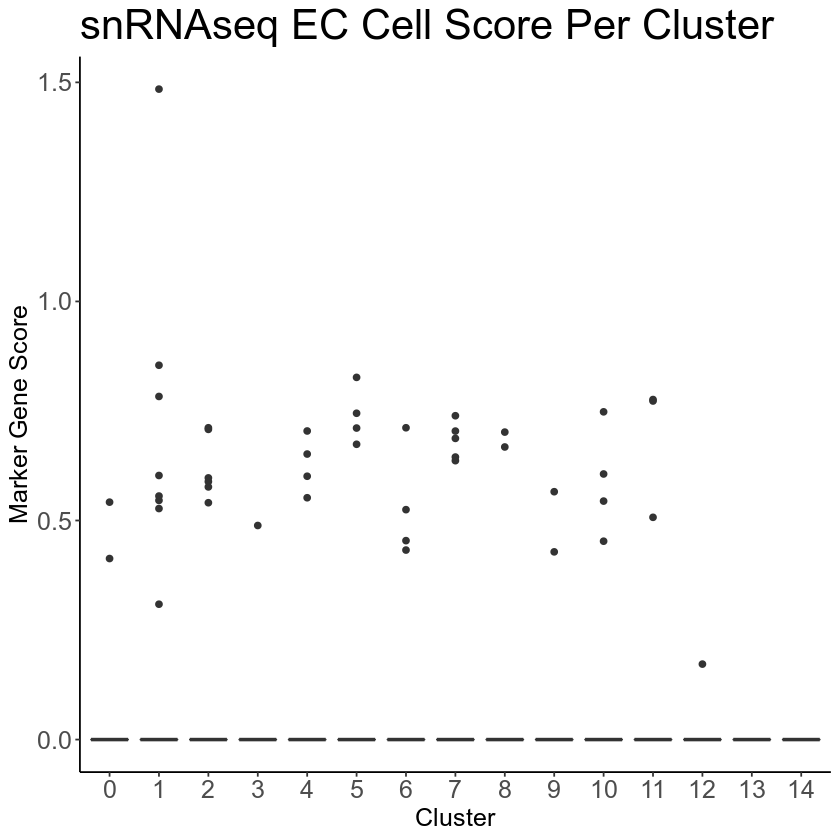

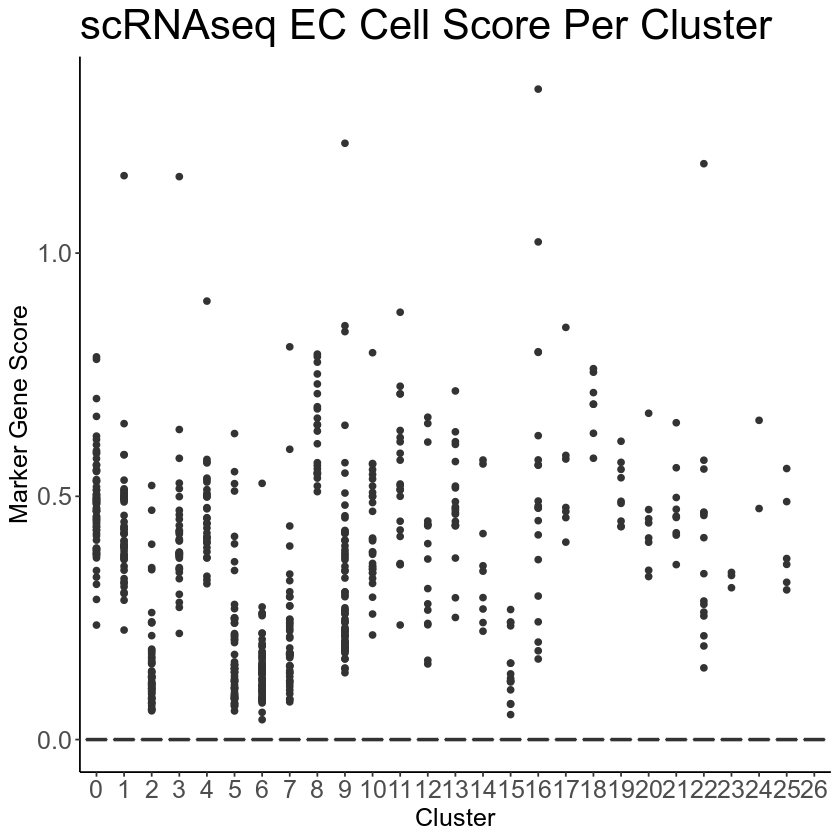

In [150]:
ggplot(nuc_meta, aes(x = as.character(qc_cluster), y = EC)) + 
    geom_boxplot() + 
    theme_classic() +
    scale_x_discrete(limits = factor(seq(0, 14))) + 
    theme(axis.text = element_text(size = 15), axis.title = element_text(size = 15), plot.title = element_text(size = 25)) +
    labs(x = 'Cluster', y = 'Marker Gene Score', title = 'snRNAseq EC Cell Score Per Cluster')

ggplot(sc_meta, aes(x = as.character(qc_cluster), y = EC)) + 
    geom_boxplot() + 
    theme_classic() +
    scale_x_discrete(limits = factor(seq(0, 26))) + 
    theme(axis.text = element_text(size = 15), axis.title = element_text(size = 15), plot.title = element_text(size = 25)) +
    labs(x = 'Cluster', y = 'Marker Gene Score', title = 'scRNAseq EC Cell Score Per Cluster')

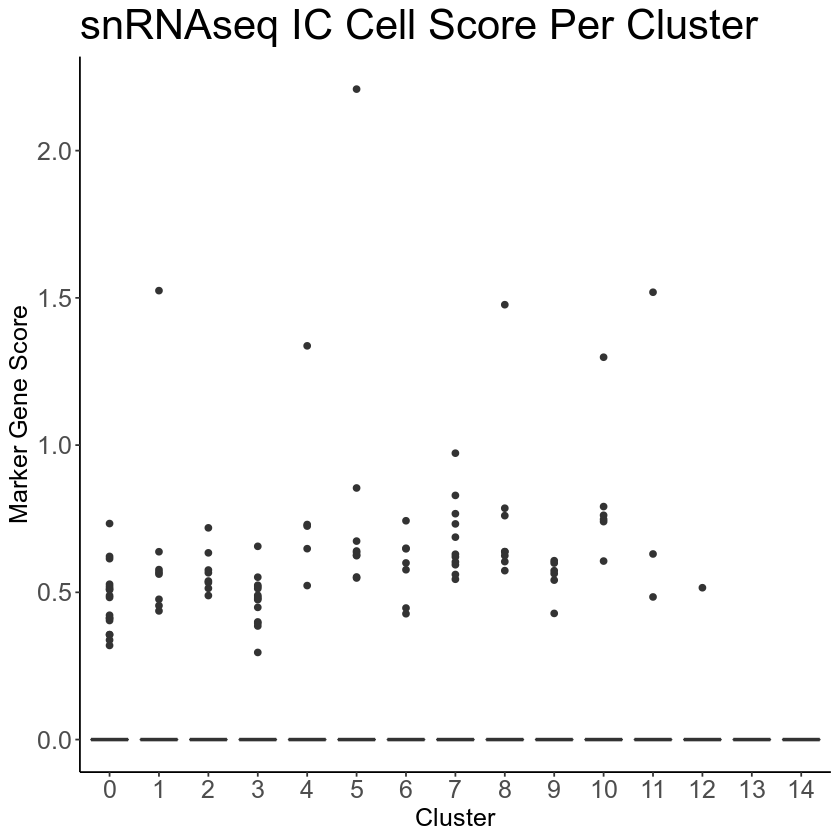

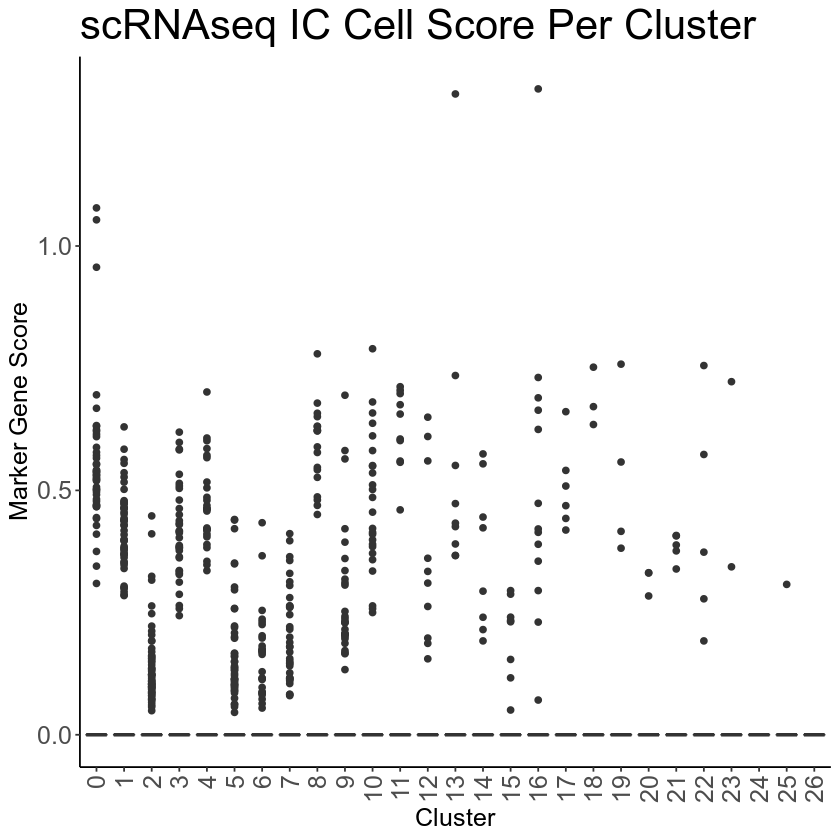

In [155]:
ggplot(nuc_meta, aes(x = as.character(qc_cluster), y = IC)) + 
    geom_boxplot() + 
    theme_classic() +
    scale_x_discrete(limits = factor(seq(0, 14))) + 
    theme(axis.text = element_text(size = 15), axis.title = element_text(size = 15), plot.title = element_text(size = 25)) +
    labs(x = 'Cluster', y = 'Marker Gene Score', title = 'snRNAseq IC Cell Score Per Cluster')

ggplot(sc_meta, aes(x = as.character(qc_cluster), y = IC)) + 
    geom_boxplot() + 
    theme_classic() +
    scale_x_discrete(limits = factor(seq(0, 26))) + 
    theme(axis.text = element_text(size = 15), axis.title = element_text(size = 15), plot.title = element_text(size = 25)) +
    labs(x = 'Cluster', y = 'Marker Gene Score', title = 'scRNAseq IC Cell Score Per Cluster') +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1))


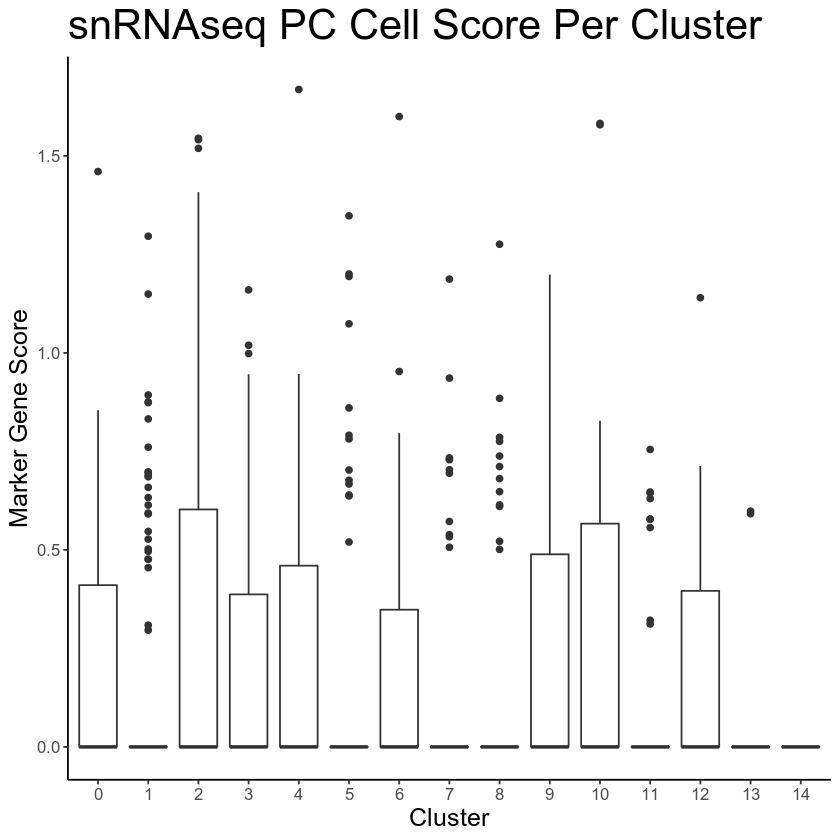

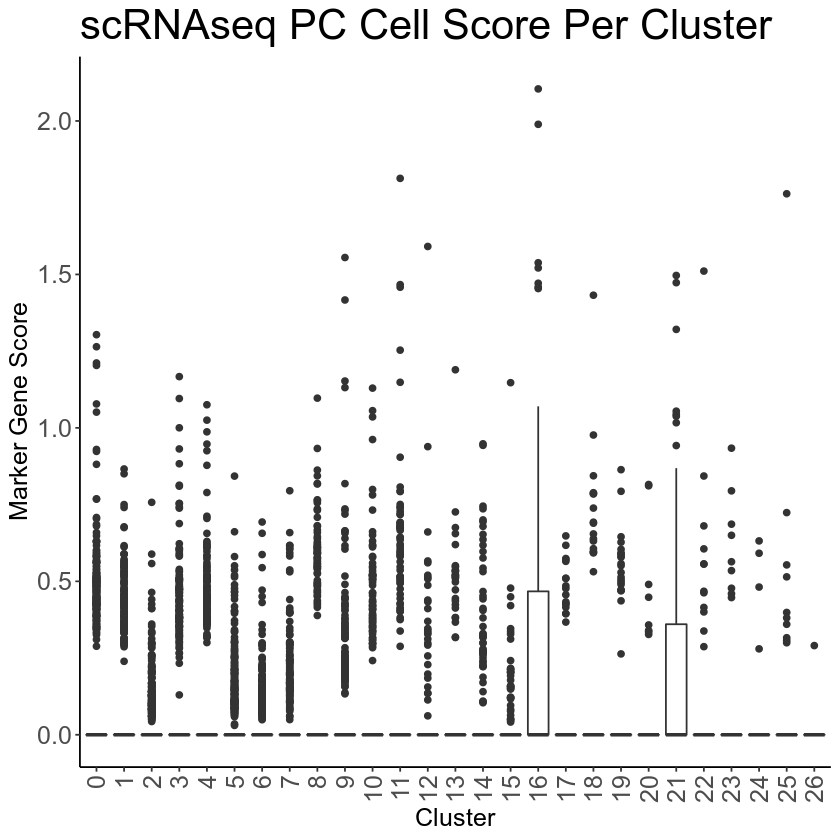

In [152]:
ggplot(nuc_meta, aes(x = as.character(qc_cluster), y = PC)) + 
    geom_boxplot() + 
    theme_classic() +
    scale_x_discrete(limits = factor(seq(0, 14))) + 
    theme(axis.text = element_text(size = 10), axis.title = element_text(size = 15), plot.title = element_text(size = 25)) +
    labs(x = 'Cluster', y = 'Marker Gene Score', title = 'snRNAseq PC Cell Score Per Cluster')

ggplot(sc_meta, aes(x = as.character(qc_cluster), y = PC)) + 
    geom_boxplot() + 
    theme_classic() +
    scale_x_discrete(limits = factor(seq(0, 26))) + 
    theme(axis.text = element_text(size = 15), axis.title = element_text(size = 15), plot.title = element_text(size = 25)) +
    labs(x = 'Cluster', y = 'Marker Gene Score', title = 'scRNAseq PC Cell Score Per Cluster') +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1))


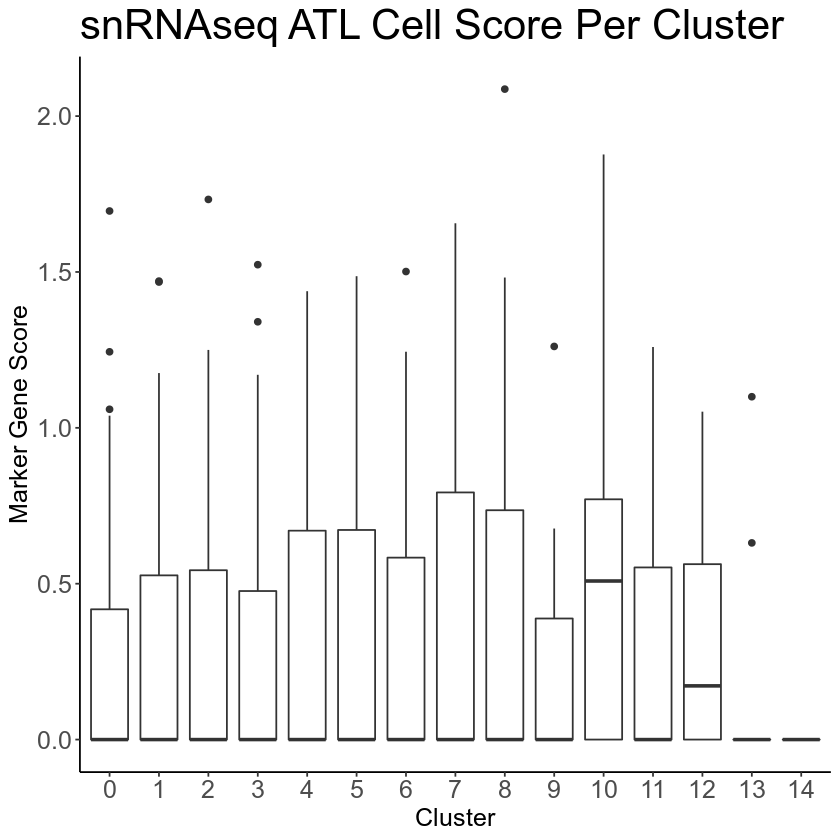

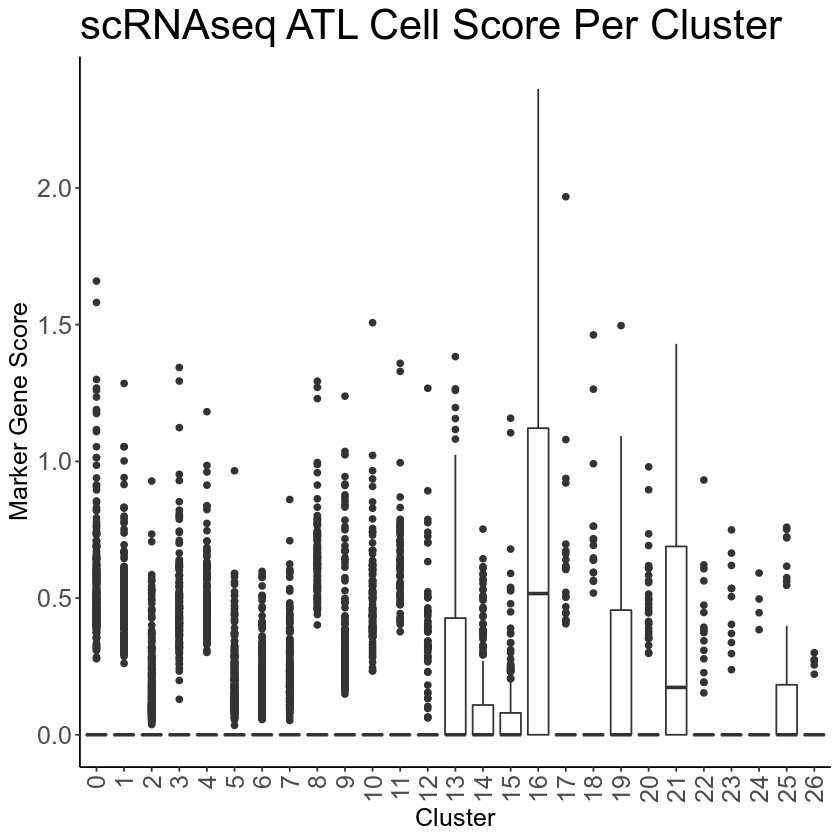

In [156]:
ggplot(nuc_meta, aes(x = as.character(qc_cluster), y = ATL)) + 
    geom_boxplot() + 
    theme_classic() +
    scale_x_discrete(limits = factor(seq(0, 14))) + 
    theme(axis.text = element_text(size = 15), axis.title = element_text(size = 15), plot.title = element_text(size = 25)) +
    labs(x = 'Cluster', y = 'Marker Gene Score', title = 'snRNAseq ATL Cell Score Per Cluster')

ggplot(sc_meta, aes(x = as.character(qc_cluster), y = ATL)) + 
    geom_boxplot() + 
    theme_classic() +
    scale_x_discrete(limits = factor(seq(0, 26))) + 
    theme(axis.text = element_text(size = 15), axis.title = element_text(size = 15), plot.title = element_text(size = 25)) +
    labs(x = 'Cluster', y = 'Marker Gene Score', title = 'scRNAseq ATL Cell Score Per Cluster') +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1))

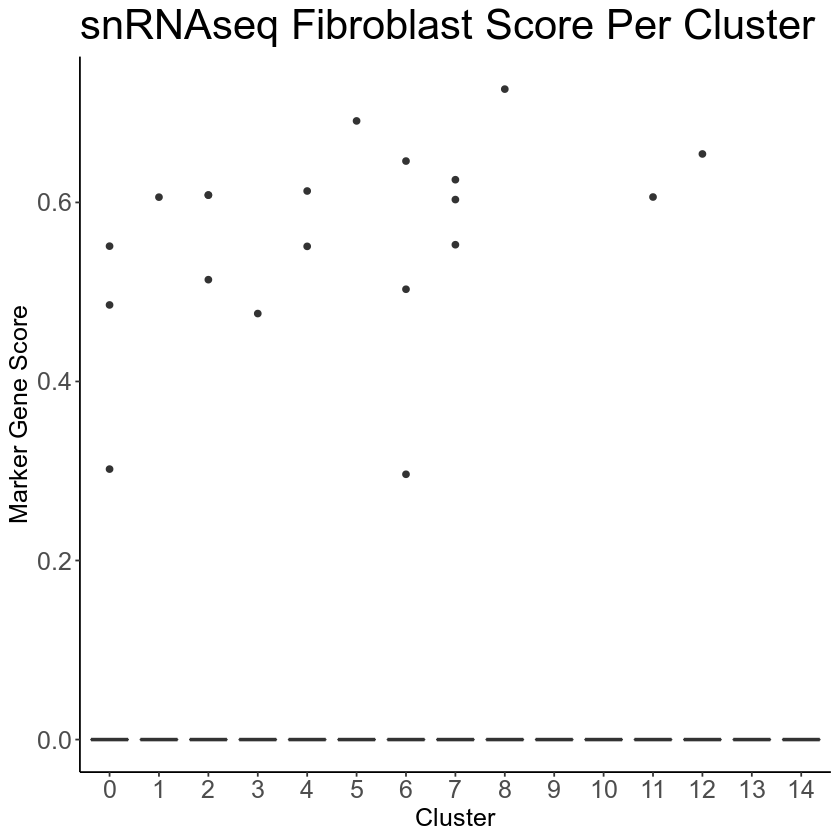

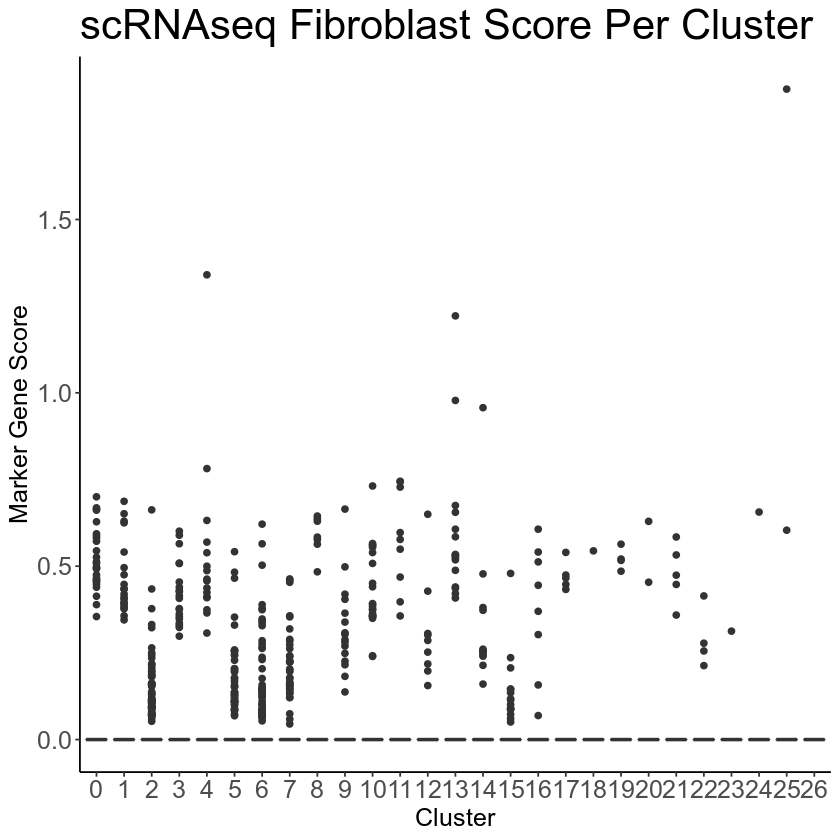

In [158]:
ggplot(nuc_meta, aes(x = as.character(qc_cluster), y = Fib)) + 
    geom_boxplot() + 
    theme_classic() +
    scale_x_discrete(limits = factor(seq(0, 14))) + 
    theme(axis.text = element_text(size = 15), axis.title = element_text(size = 15), plot.title = element_text(size = 25)) +
    labs(x = 'Cluster', y = 'Marker Gene Score', title = 'snRNAseq Fibroblast Score Per Cluster')

ggplot(sc_meta, aes(x = as.character(qc_cluster), y = Fib)) + 
    geom_boxplot() + 
    theme_classic() +
    scale_x_discrete(limits = factor(seq(0, 26))) + 
    theme(axis.text = element_text(size = 15), axis.title = element_text(size = 15), plot.title = element_text(size = 25)) +
    labs(x = 'Cluster', y = 'Marker Gene Score', title = 'scRNAseq Fibroblast Score Per Cluster')

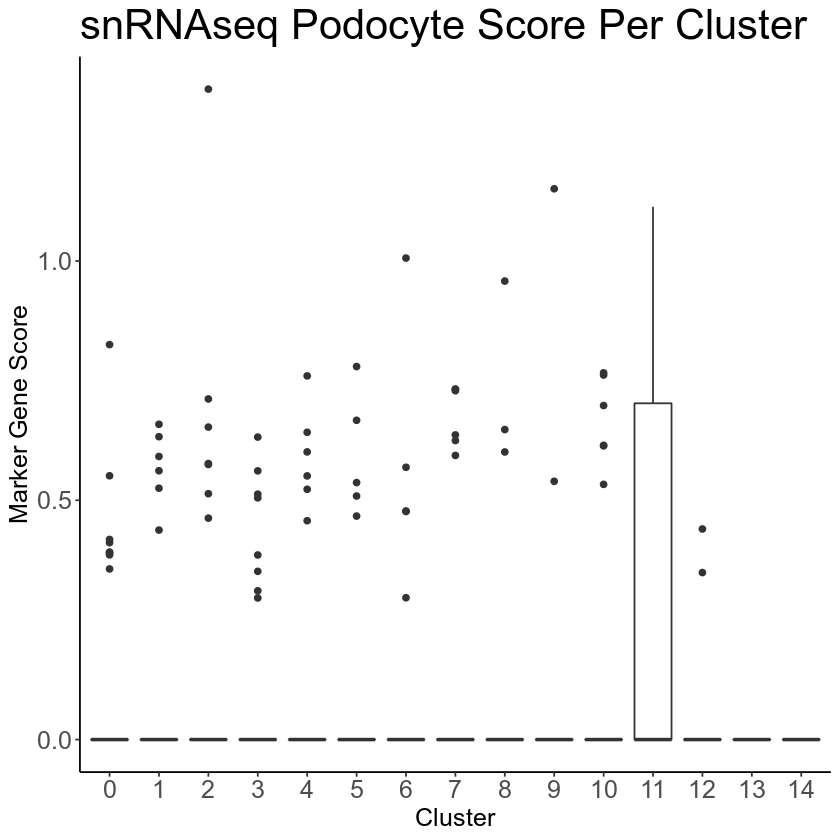

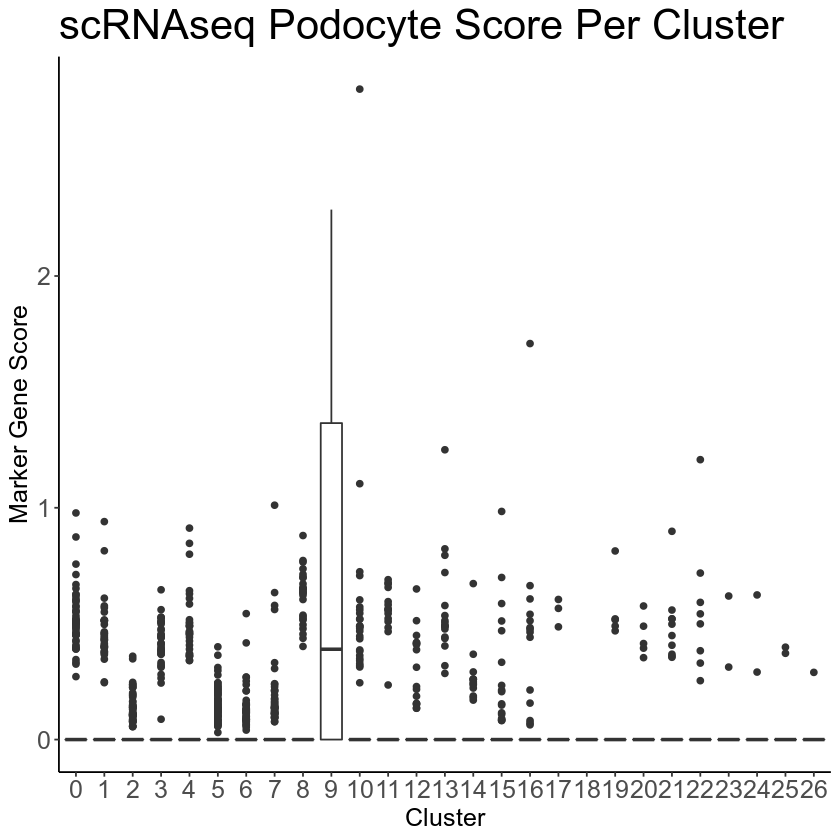

In [160]:
ggplot(nuc_meta, aes(x = as.character(qc_cluster), y = Pod)) + 
    geom_boxplot() + 
    theme_classic() +
    scale_x_discrete(limits = factor(seq(0, 14))) + 
    theme(axis.text = element_text(size = 15), axis.title = element_text(size = 15), plot.title = element_text(size = 25)) +
    labs(x = 'Cluster', y = 'Marker Gene Score', title = 'snRNAseq Podocyte Score Per Cluster')

ggplot(sc_meta, aes(x = as.character(qc_cluster), y = Pod)) + 
    geom_boxplot() + 
    theme_classic() +
    scale_x_discrete(limits = factor(seq(0, 26))) + 
    theme(axis.text = element_text(size = 15), axis.title = element_text(size = 15), plot.title = element_text(size = 25)) +
    labs(x = 'Cluster', y = 'Marker Gene Score', title = 'scRNAseq Podocyte Score Per Cluster')

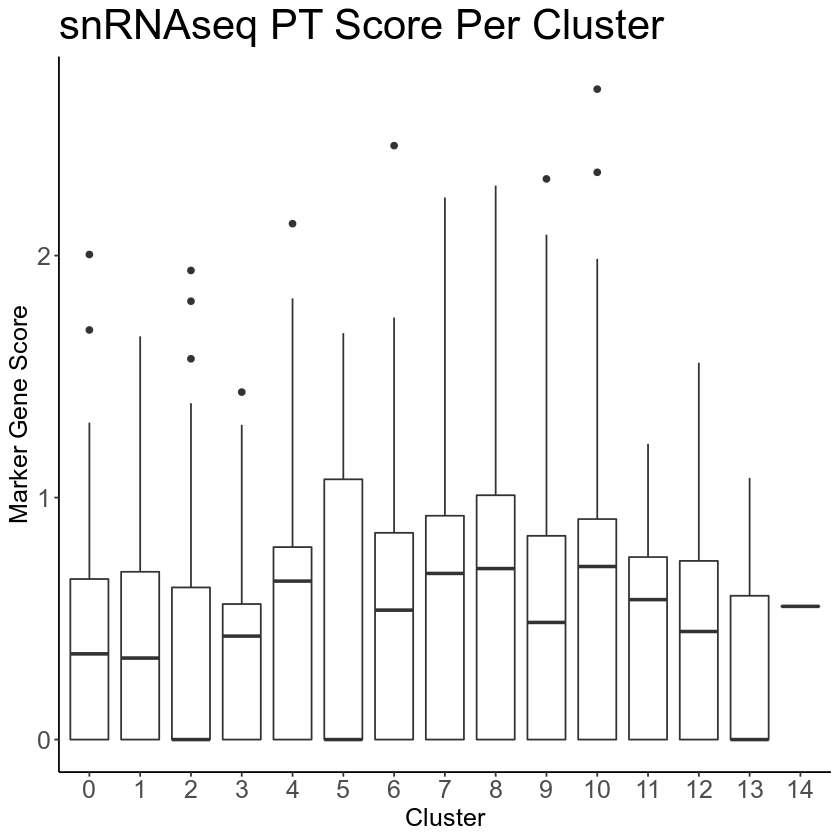

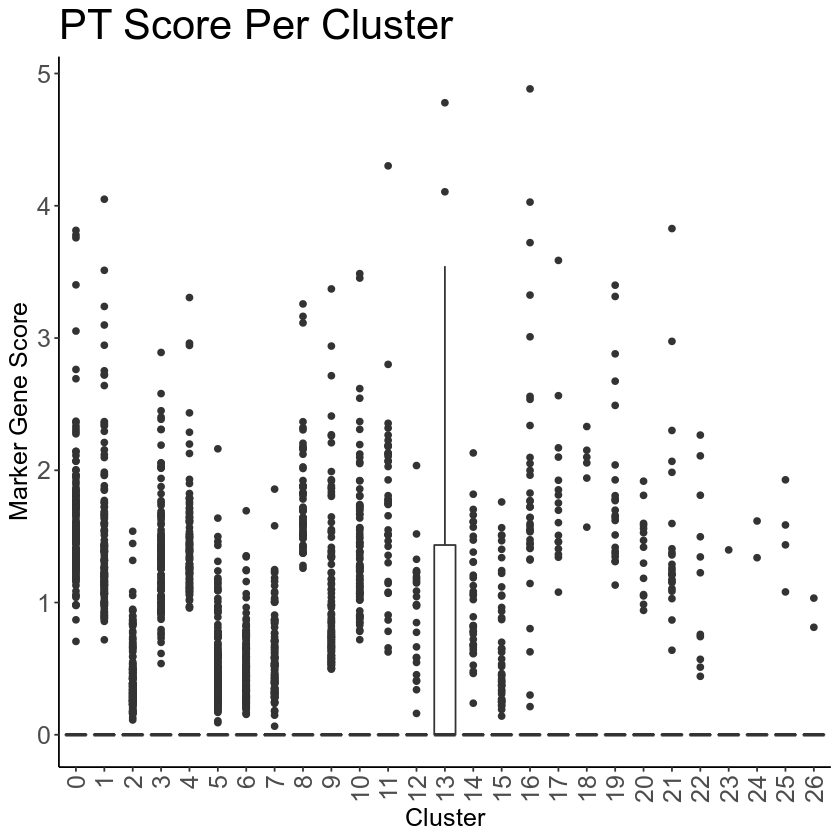

In [161]:
ggplot(nuc_meta, aes(x = as.character(qc_cluster), y = PT)) + 
    geom_boxplot() + 
    theme_classic() +
    scale_x_discrete(limits = factor(seq(0, 14))) + 
    theme(axis.text = element_text(size = 15), axis.title = element_text(size = 15), plot.title = element_text(size = 25)) +
    labs(x = 'Cluster', y = 'Marker Gene Score', title = 'snRNAseq PT Score Per Cluster')

ggplot(sc_meta, aes(x = as.character(qc_cluster), y = PT)) + 
    geom_boxplot() + 
    theme_classic() +
    scale_x_discrete(limits = factor(seq(0, 26))) + 
    theme(axis.text = element_text(size = 15), axis.title = element_text(size = 15), plot.title = element_text(size = 25)) +
    labs(x = 'Cluster', y = 'Marker Gene Score', title = 'PT Score Per Cluster') +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1))

In [169]:
saveRDS(rbind(sc_meta, nuc_meta), '/data/srlab/ssg34/SLE_kidney_v2/data/qcd/BP_preclusterQC_clustered_meta_09222022.rds')

In [192]:
qcd_sc_meta <- sc_meta %>% filter(qc_cluster != 16, qc_cluster != 22)
qcd_sc_norm <- sc_norm[, qcd_sc_meta$cell]

qcd_sn_meta <- nuc_meta %>% filter(qc_cluster != 10)
qcd_sn_norm <- nuc_norm[, qcd_sn_meta$cell]

In [201]:
qcd_meta <- rbind(qcd_sc_meta, qcd_sn_meta)
qcd_norm <- cbind(qcd_sc_norm, qcd_sn_norm)

qcd_norm <- qcd_norm[, qcd_meta$cell]

In [203]:
saveRDS(qcd_norm, '/data/srlab/ssg34/SLE_kidney_v2/data/qcd/BP_clusterQCd_norm_09222022.rds')
saveRDS(qcd_meta, '/data/srlab/ssg34/SLE_kidney_v2/data/qcd/BP_clusterQCd_meta_09222022.rds')

## WEIGHTED PCA

In [11]:
qcd_norm <- readRDS('/data/srlab/ssg34/SLE_kidney_v2/data/qcd/BP_clusterQCd_norm_09222022.rds')
qcd_meta <- readRDS('/data/srlab/ssg34/SLE_kidney_v2/data/qcd/BP_clusterQCd_meta_09222022.rds')

In [12]:
genes_exclude <- c(grep("^MT-|^RPL|^RPS|MALAT1|MIR-", row.names(norm), value = TRUE), 
                   Seurat::cc.genes$s.genes, Seurat::cc.genes$g2m.genes) 

In [13]:
## Filtering for expressed genes
threshold_genes <- qcd_norm[rownames(qcd_norm[rowMeans(qcd_norm) >= .01, ]), ]

samples_25 <- qcd_meta %>% group_by(sample) %>% tally() %>% filter(n > 25) %>% pull(sample)

threshold_samples <- threshold_genes[, qcd_meta %>% filter(sample %in% samples_25) %>% pull(cell)]

## Variable gene selection — very inefficiently written, but essentially using VST to select most variable genes from samples with > 100 cells
var_genes_raw <- vargenes_vst(object = threshold_samples, groups = qcd_meta %>% filter(sample %in% samples_25) %>% pull(sample), topn = 500)

In [9]:
#Separate variable genes by Dataset
var_genes_raw_nuc <- vector()
var_genes_raw_sc <- vector()

for (i in 1:length(var_genes_raw)) {
    if (grepl('nuc', names(var_genes_raw)[i])) {
        var_genes_raw_nuc <- c(var_genes_raw_nuc, var_genes_raw[[i]])
    }
    else {
        var_genes_raw_sc <- c(var_genes_raw_sc, var_genes_raw[[i]])   
    }

}

var_genes_raw_nuc <- var_genes_raw_nuc %>% unique()
var_genes_raw_sc <- var_genes_raw_sc %>% unique() 
#Find intersection
var_genes <- intersect(var_genes_raw_nuc, var_genes_raw_sc)

In [10]:
var_genes %>% length()

[1] 2688

In [7]:
## Scale Data
bp_scaled <- qcd_norm[var_genes[!var_genes %in% genes_exclude], ] %>% scaleData()

In [11]:
table(qcd_meta$dataset)
y <- factor(qcd_meta$dataset)
weights <- as.numeric((1 / prop.table(table(y)))[y]) / nlevels(y)
length(weights)
table(weights)


scRNAseq snRNAseq 
   13377      818 

[1] 14195

weights
0.530574867309561  8.67665036674817 
            13377               818 

In [12]:
bp_scaled <- as(bp_scaled, 'dgCMatrix')

In [13]:
weighted_pca_res <- weighted_pca(bp_scaled, weights, rownames(bp_scaled), 20, TRUE, 10)$embeddings

use_weights



[1] TRUE


use_weights

use_weights



[1] TRUE


use_weights

Harmony 1/20

Harmony 2/20

Harmony 3/20

Harmony 4/20

Harmony 5/20

Harmony 6/20

Harmony 7/20

Harmony 8/20

Harmony 9/20

Harmony 10/20

Harmony 11/20

Harmony 12/20

Harmony 13/20

Harmony 14/20

Harmony 15/20

Harmony 16/20

Harmony 17/20

Harmony 18/20

Harmony 19/20

Harmony 20/20



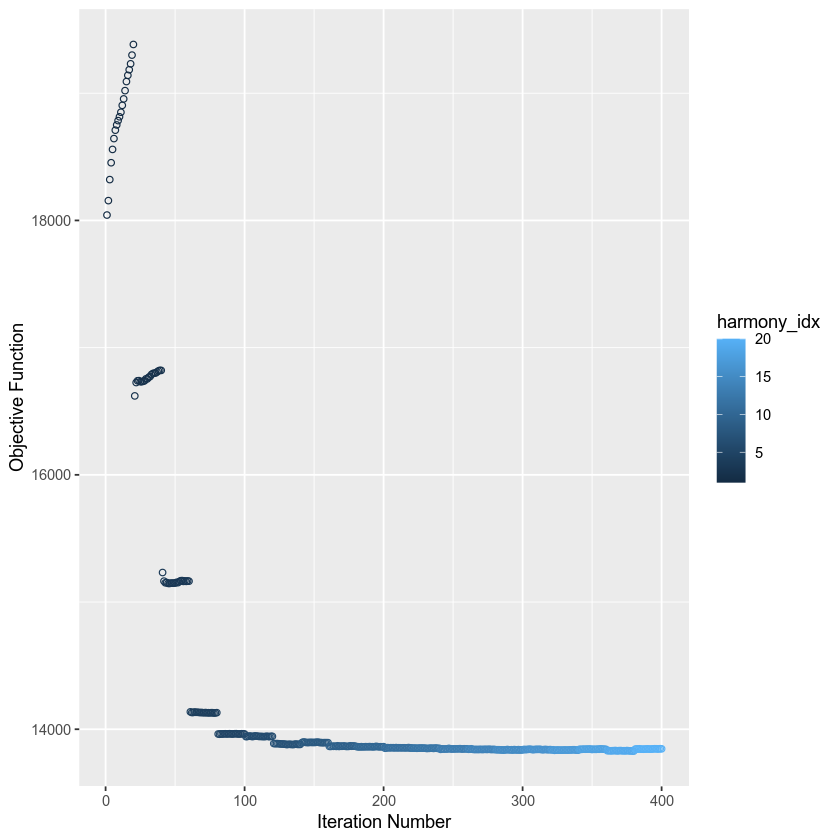

In [14]:
harmony_weighted2 <- HarmonyMatrix(weighted_pca_res, qcd_meta, 
                            c('sample', 'processing.batch', 'Site', 'dataset'), 
                            c(1.5, 1, 1, 1.5),
                            do_pca = FALSE, 
                            epsilon.harmony = -Inf, 
                            epsilon.cluster = -Inf,
                            weights = weights, 
                            max.iter.cluster = 20,
                            max.iter.harmony = 20, 
                            plot_convergence = TRUE, 
                            verbose = TRUE)

In [15]:
harmony_umap2 <- uwot::umap(harmony_weighted2, n_neighbors = 30L, metric = "euclidean", min_dist = .1)

In [16]:
weighted_umap <- uwot::umap(weighted_pca_res, n_neighbors = 30L, metric = "euclidean", min_dist = .1)

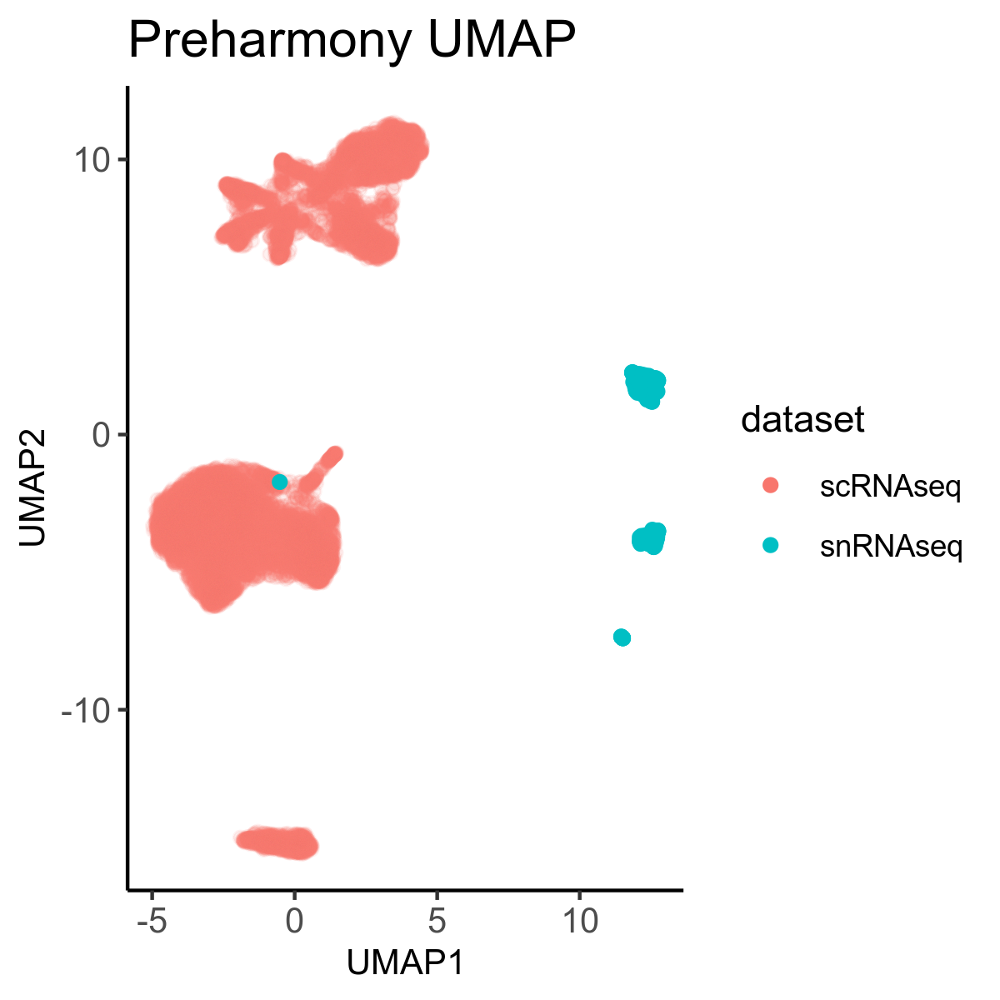

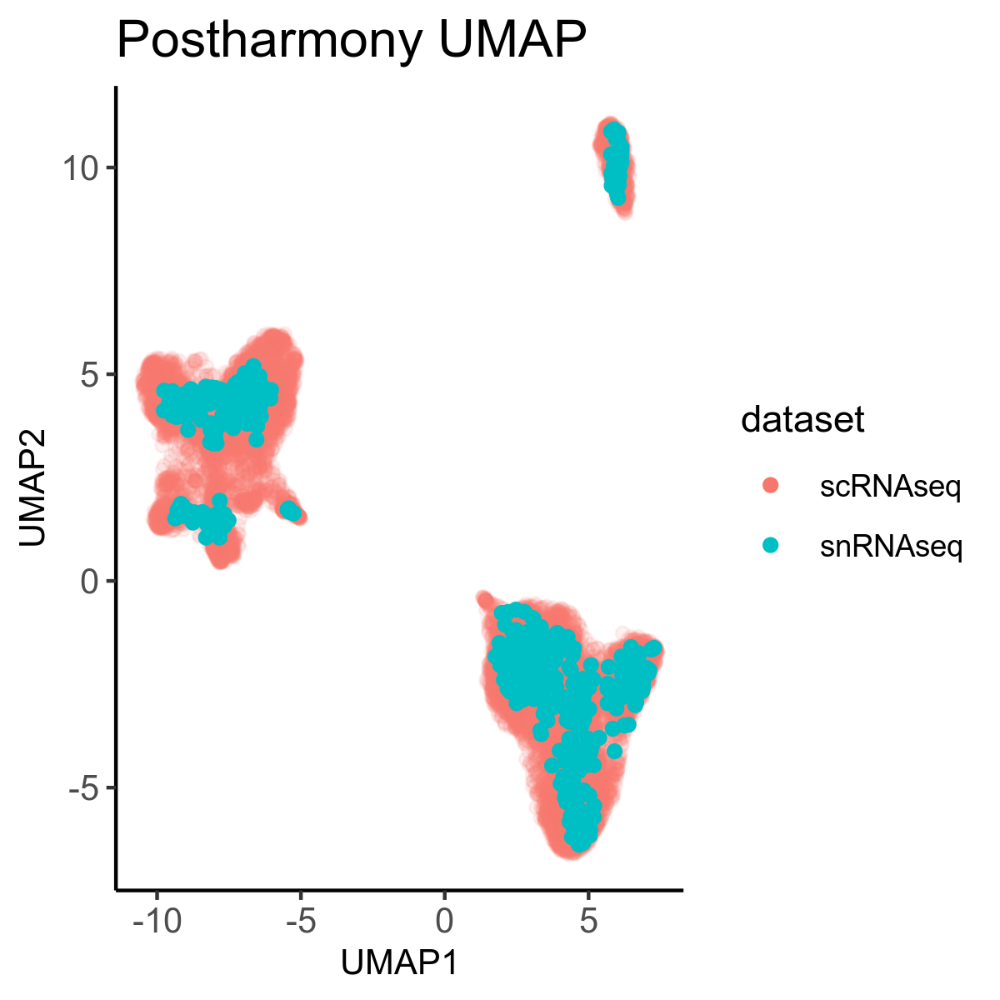

In [17]:
fig.size(4, 4)

df <- weighted_umap %>% data.frame() %>% mutate(dataset = qcd_meta$dataset)
ggplot(df, aes(x = X1, y = X2, color = dataset)) +
    geom_point(data = df %>% filter(dataset == 'scRNAseq'), alpha = 0.1, size = 1.5) +
    geom_point(data = df %>% filter(dataset == 'snRNAseq'), alpha = 2, size = 1.5) +
    theme_classic() + 
    theme(axis.text = element_text(size = 10), axis.title = element_text(size = 10), plot.title = element_text(size = 15)) +
    labs(title = 'Preharmony UMAP', x = 'UMAP1', y = 'UMAP2')

df <- harmony_umap2 %>% data.frame() %>% mutate(dataset = qcd_meta$dataset)
fig.size(4, 4)
ggplot(df, aes(x = X1, y = X2, color = dataset)) +
    geom_point(data = df %>% filter(dataset == 'scRNAseq'), alpha = 0.1, size = 1.5) +
    geom_point(data = df %>% filter(dataset == 'snRNAseq'), alpha = 2, size = 1.5) +
    theme_classic() + 
    theme(axis.text = element_text(size = 10), axis.title = element_text(size = 10), plot.title = element_text(size = 15)) +
    labs(title = 'Postharmony UMAP', x = 'UMAP1', y = 'UMAP2')

In [18]:
snn_ref <- BuildSNNSeurat(harmony_weighted2[,1:20], nn.eps = 0)


resolution_list <- c(0.2, 0.4, 0.6, 0.8, 1.0, 1.2, 1.4, 1.6, 1.8, 2.0)
ids_ref <- Reduce(cbind, mclapply(resolution_list, function(res_use) {
    Seurat:::RunModularityClustering(SNN = snn_ref, modularity = 1,
        resolution = res_use, algorithm = 1, n.start = 20,
        n.iter = 20, random.seed = 100, print.output = FALSE,
        temp.file.location = NULL, edge.file.name = NULL)
}, mc.preschedule = FALSE, mc.cores = min(20, length(resolution_list)))) 

In [19]:
harmony_umap2 <- cbind(harmony_weighted2[, 1:20], harmony_umap2, ids_ref)
colnames(harmony_umap2) <- c(paste0('hPC', 1:20), 'hUMAP1', 'hUMAP2', 'hres0.2', 'hres0.4', 'hres0.6', 'hres0.8', 'hres1.0', 'hres1.2', 'hres1.4', 'hres1.6', 'hres1.8', 'hres2.0')

In [21]:
qcd_meta <- cbind(qcd_meta %>% 
                  select(-c(colnames(qcd_meta)[grep('hres', colnames(qcd_meta))], 
                             colnames(qcd_meta)[grep('hPC', colnames(qcd_meta))],
                             huwotUMAP1, huwotUMAP2, T, B , Myeloid, EC, 
                             IC, PC, ATL, Fib, Pod, PT)),
                                                harmony_umap2) 

In [25]:
saveRDS(qcd_meta, '/data/srlab/ssg34/SLE_kidney_v2/data/qcd/BP_clusterQCd_meta_09222022.rds')

### REMOVE pDCs and RESCALE/RECLUSTER

In [93]:
qcd_meta <- readRDS('/data/srlab/ssg34/SLE_kidney_v2/data/qcd/BP_clusterQCd_meta_09222022.rds')

In [94]:
qcd_norm <- readRDS('/data/srlab/ssg34/SLE_kidney_v2/data/qcd/BP_clusterQCd_norm_09222022.rds')

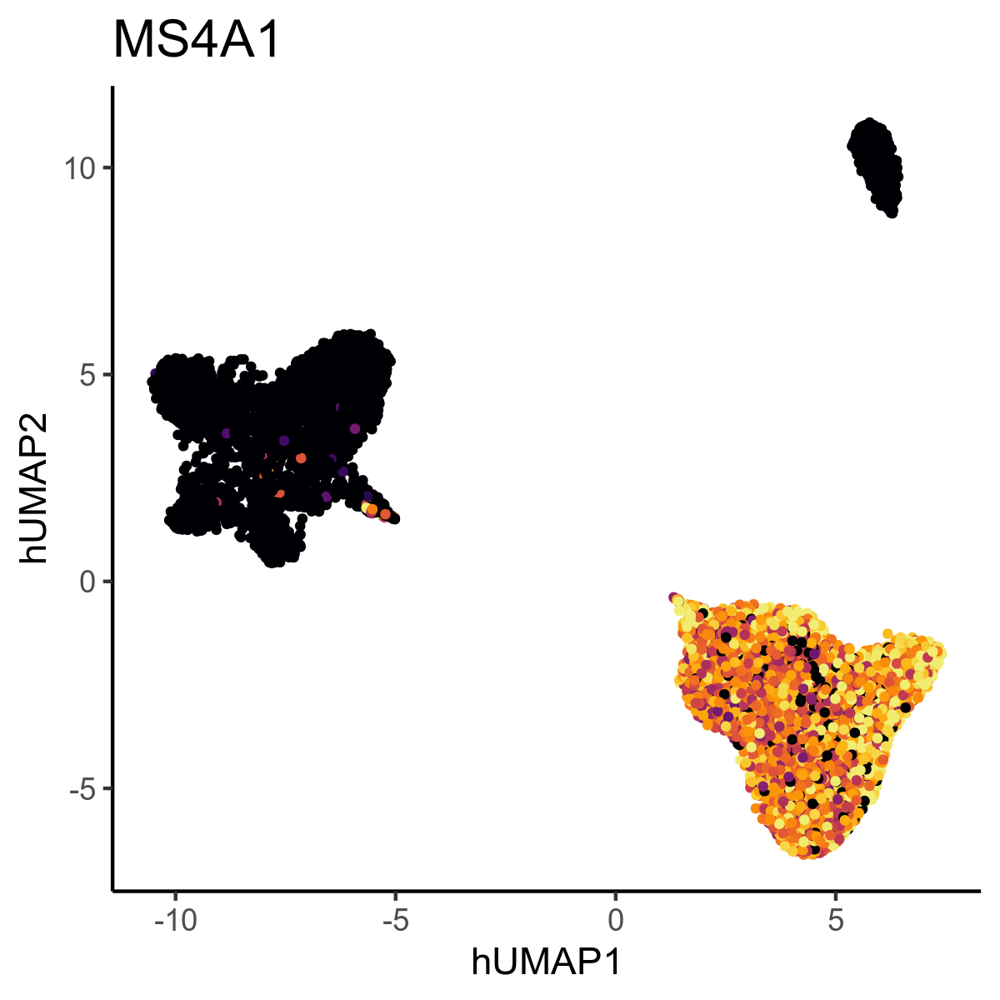

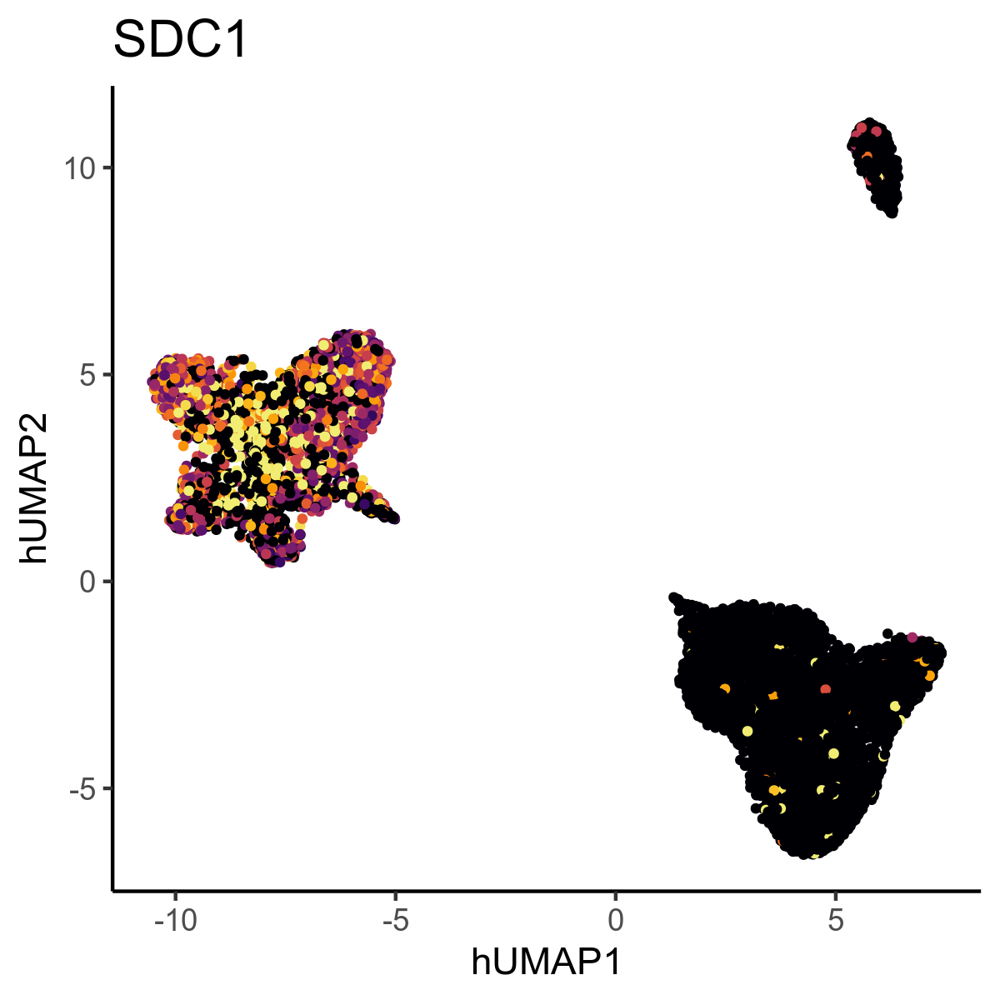

In [95]:
plot_shuffled_features('MS4A1', qcd_meta %>% select(hUMAP1, hUMAP2) %>% rename(V1 = hUMAP1, V2 = hUMAP2), 
                       qcd_norm, 0.95)
plot_shuffled_features('SDC1', qcd_meta %>% select(hUMAP1, hUMAP2) %>% rename(V1 = hUMAP1, V2 = hUMAP2), 
                       qcd_norm, 0.95)

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”


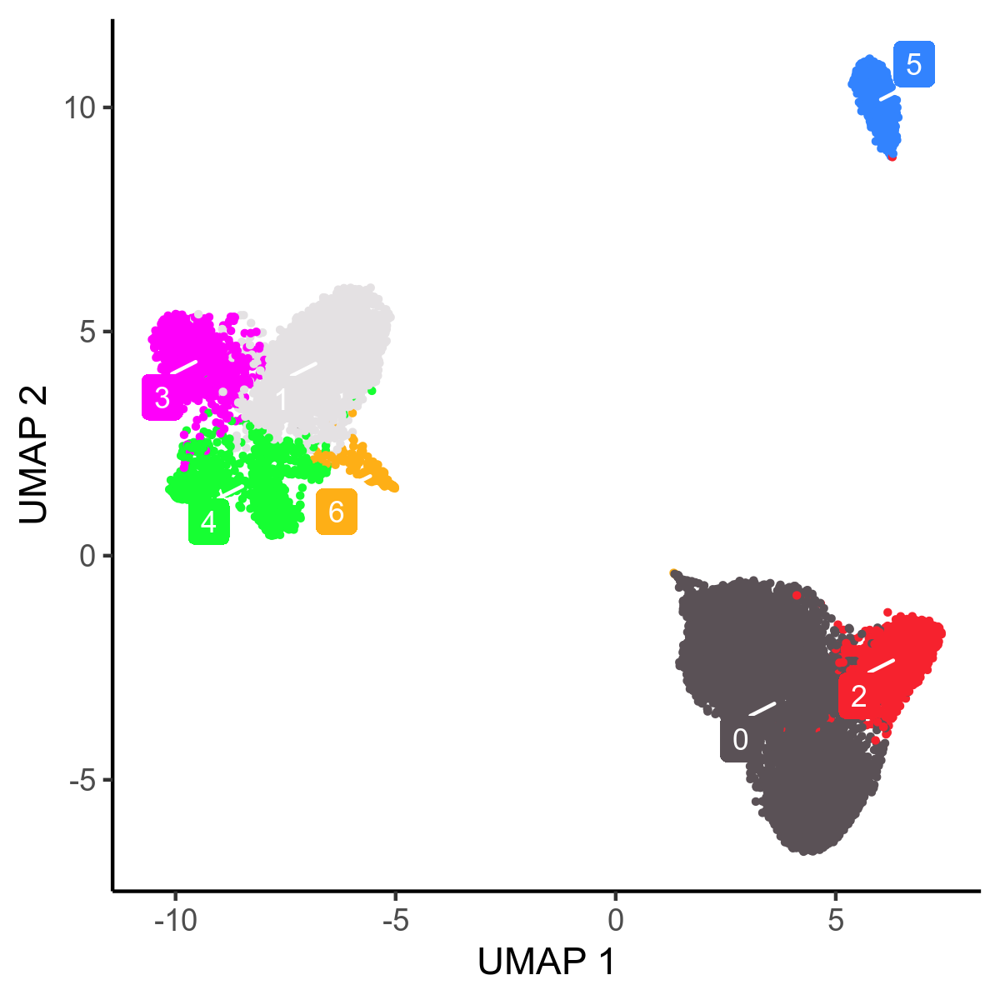

In [96]:
plot_clusters3(qcd_meta$hres0.2, qcd_meta$hres0.2, umap_use = qcd_meta %>% select(hUMAP1, hUMAP2), 
               do_labels = TRUE) +
    scale_color_manual(values = as.vector(polychrome(28))) +
    scale_fill_manual(values = as.vector(polychrome(28)))

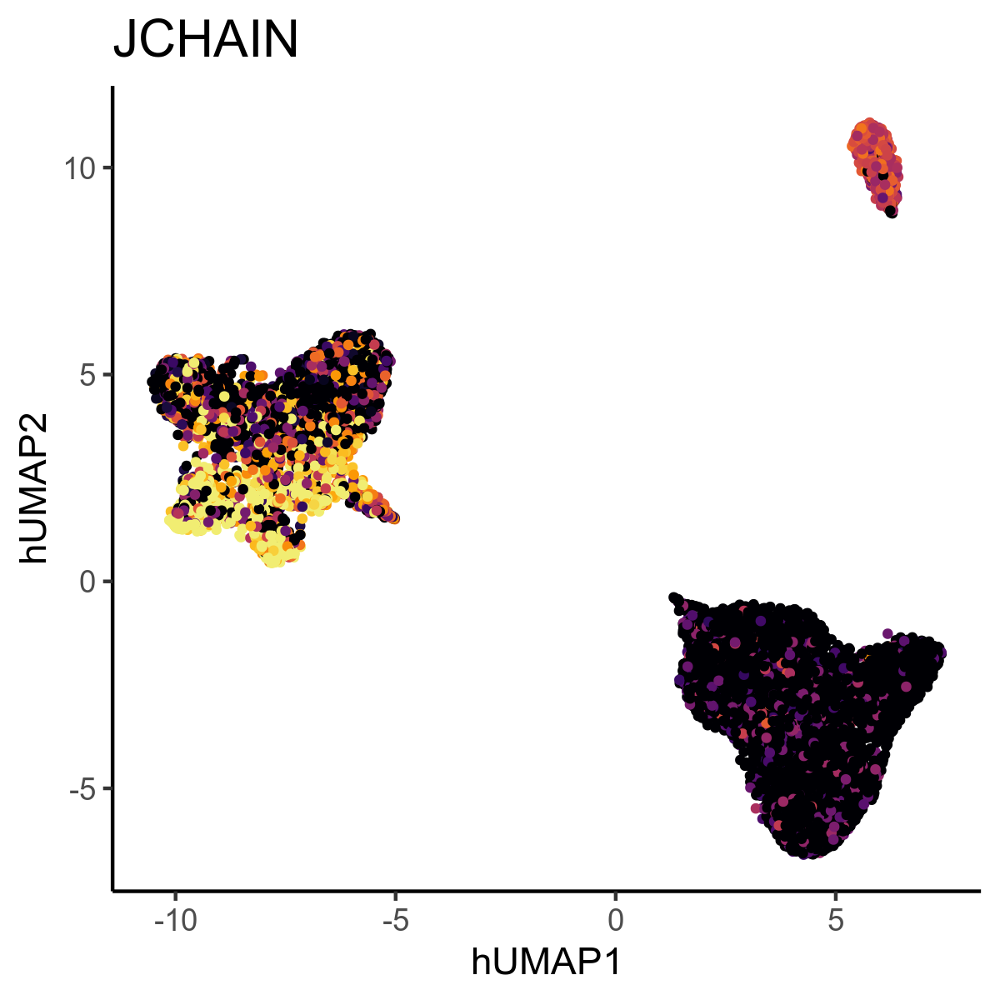

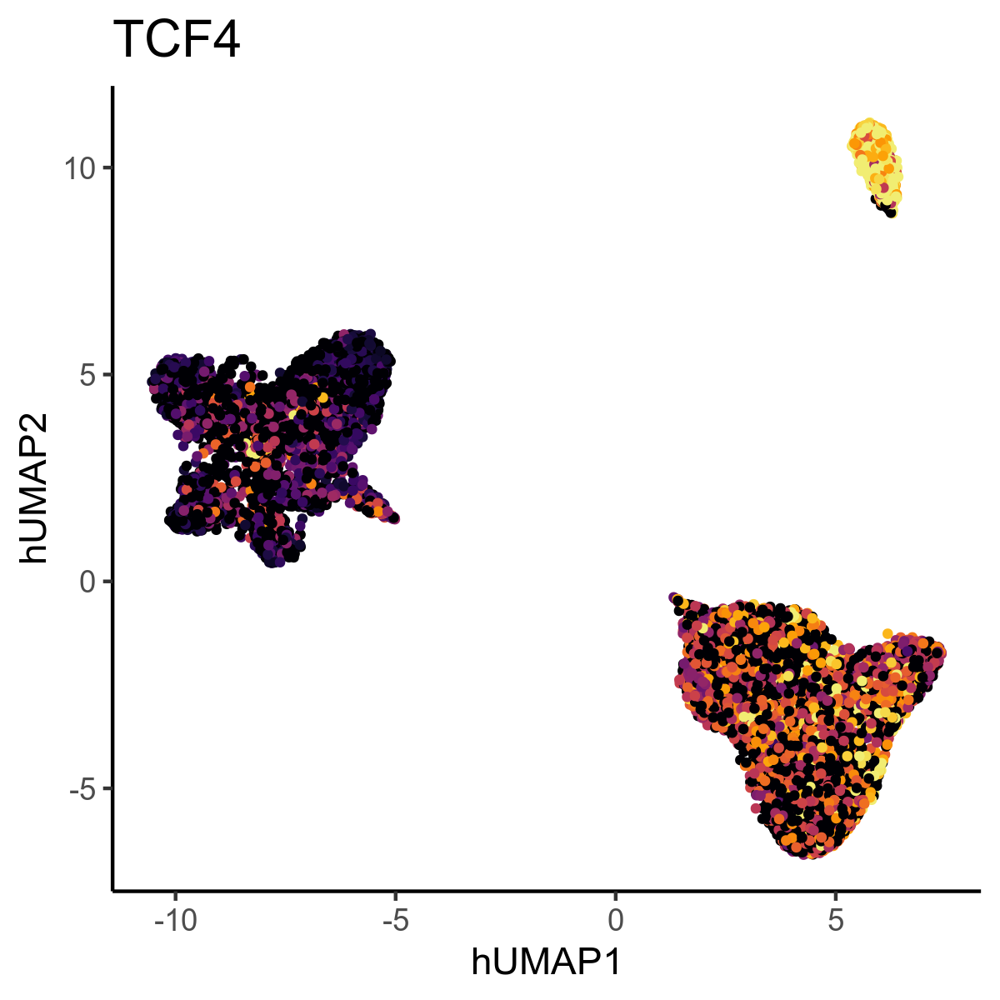

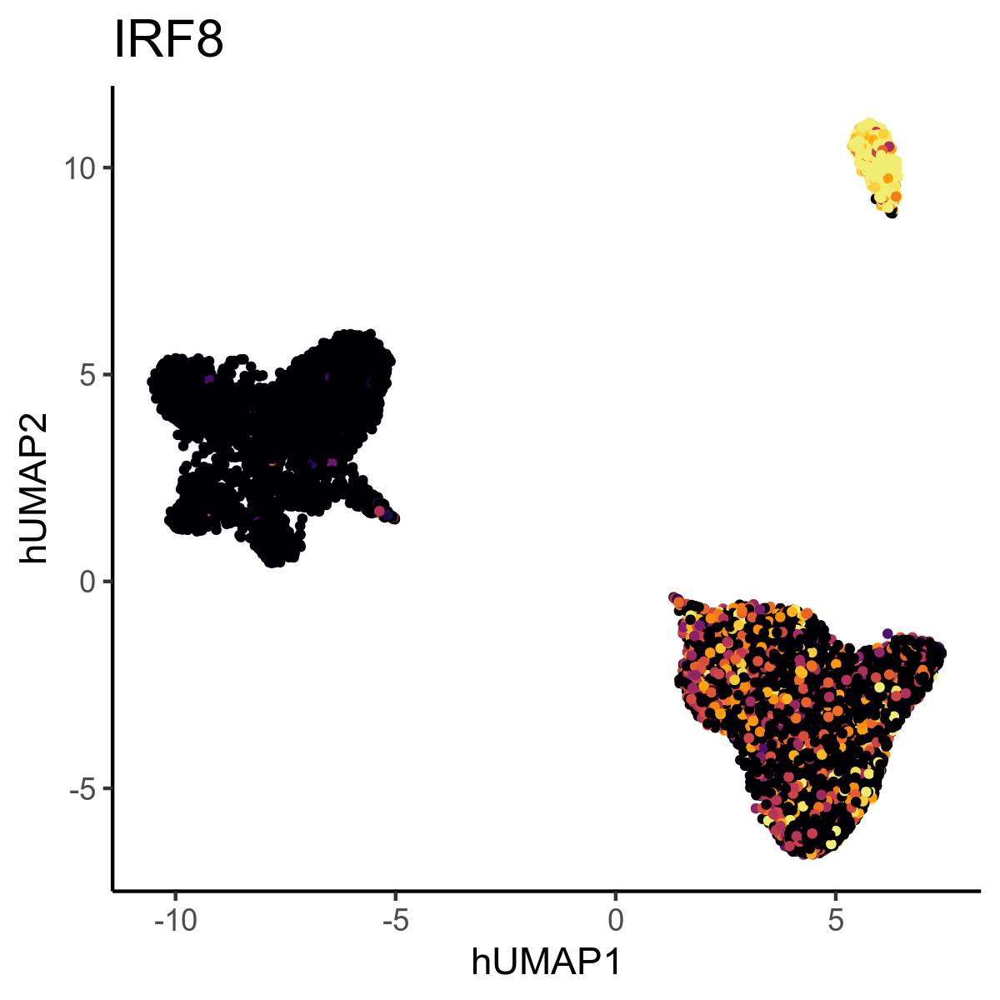

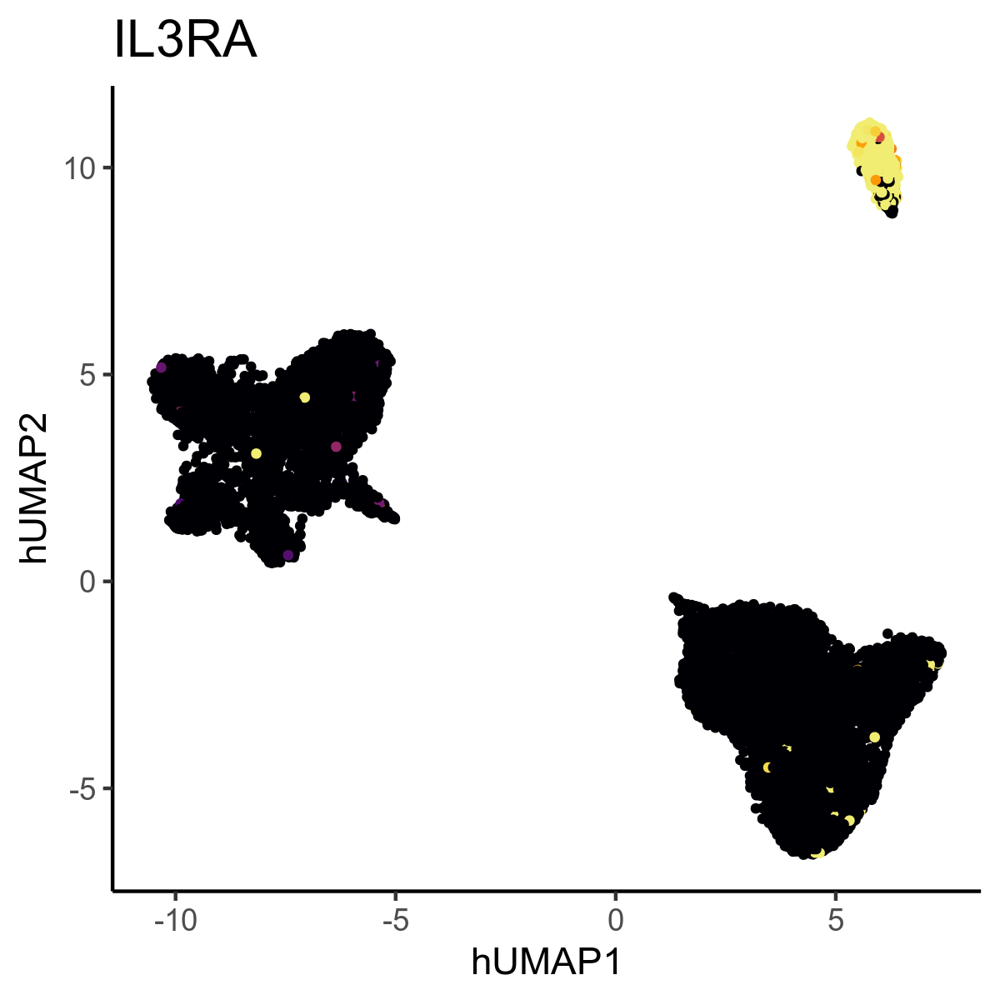

In [97]:
plot_shuffled_features('JCHAIN', qcd_meta %>% select(hUMAP1, hUMAP2) %>% rename(V1 = hUMAP1, V2 = hUMAP2), 
                       qcd_norm, 0.95)
plot_shuffled_features('TCF4', qcd_meta %>% select(hUMAP1, hUMAP2) %>% rename(V1 = hUMAP1, V2 = hUMAP2), 
                       qcd_norm, 0.95)
plot_shuffled_features('IRF8', qcd_meta %>% select(hUMAP1, hUMAP2) %>% rename(V1 = hUMAP1, V2 = hUMAP2), 
                       qcd_norm, 0.95)
plot_shuffled_features('IL3RA', qcd_meta %>% select(hUMAP1, hUMAP2) %>% rename(V1 = hUMAP1, V2 = hUMAP2), 
                       qcd_norm, 0.95)

In [98]:
pDCs_meta <- qcd_meta %>% filter(hres0.2 == 5)
pDCs_norm <- qcd_norm[, qcd_meta %>% filter(hres0.2 == 5) %>% pull(cell)]

In [99]:
saveRDS(pDCs_meta, '/data/srlab/ssg34/SLE_kidney_v2/data/qcd/pDC_clusterQCd_meta_09232022.rds')
saveRDS(pDCs_norm, '/data/srlab/ssg34/SLE_kidney_v2/data/qcd/pDC_clusterQCd_norm_09232022.rds')

In [103]:
qcd_meta <- qcd_meta %>% filter(hres0.2 != 5) 

In [104]:
saveRDS(qcd_meta, '/data/srlab/ssg34/SLE_kidney_v2/data/qcd/BP_clusterQCd_meta_09232022.rds')

In [105]:
qcd_norm <- qcd_norm[, qcd_meta$cell]

In [106]:
saveRDS(qcd_norm, '/data/srlab/ssg34/SLE_kidney_v2/data/qcd/BP_clusterQCd_norm_09232022.rds')

In [124]:
qcd_meta <- qcd_meta %>% select(- c(hres0.4, hres0.6, hres0.8, hres1.0, hres1.2, hres1.4, hres1.6,
                                  hres1.8, hres2.0, hUMAP1, hUMAP2))

### Weighted PCA v2

In [19]:
qcd_meta <- readRDS('/data/srlab/ssg34/SLE_kidney_v2/data/qcd/BP_clusterQCd_meta_09232022.rds')
qcd_norm <- readRDS('/data/srlab/ssg34/SLE_kidney_v2/data/qcd/BP_clusterQCd_norm_09232022.rds')

In [21]:
genes_exclude <- c(grep("^MT-|^RPL|^RPS|MALAT1|MIR-", row.names(norm), value = TRUE), 
                   Seurat::cc.genes$s.genes, Seurat::cc.genes$g2m.genes) 

In [ ]:
## Filtering for expressed genes
threshold_genes <- qcd_norm[rownames(qcd_norm[rowMeans(qcd_norm) >= .01, ]), ]

samples_25 <- qcd_meta %>% group_by(sample) %>% tally() %>% filter(n > 25) %>% pull(sample)

threshold_samples <- threshold_genes[, qcd_meta %>% filter(sample %in% samples_25) %>% pull(cell)]

## Variable gene selection — very inefficiently written, but essentially using VST to select most variable genes from samples with > 100 cells
var_genes_raw <- vargenes_vst(object = threshold_samples, groups = qcd_meta %>% filter(sample %in% samples_25) %>% pull(sample), topn = 500)

In [ ]:
#Separate variable genes by Dataset
var_genes_raw_nuc <- vector()
var_genes_raw_sc <- vector()

for (i in 1:length(var_genes_raw)) {
    if (grepl('nuc', names(var_genes_raw)[i])) {
        var_genes_raw_nuc <- c(var_genes_raw_nuc, var_genes_raw[[i]])
    }
    else {
        var_genes_raw_sc <- c(var_genes_raw_sc, var_genes_raw[[i]])   
    }

}

var_genes_raw_nuc <- var_genes_raw_nuc %>% unique()
var_genes_raw_sc <- var_genes_raw_sc %>% unique() 
#Find intersection
var_genes <- intersect(var_genes_raw_nuc, var_genes_raw_sc)

In [ ]:
var_genes %>% length() 

In [134]:
## Scale Data
bp_scaled <- qcd_norm[var_genes[!var_genes %in% genes_exclude], ] %>% scaleData()

In [135]:
table(qcd_meta$dataset)
y <- factor(qcd_meta$dataset)
weights <- as.numeric((1 / prop.table(table(y)))[y]) / nlevels(y)
length(weights)
table(weights)


scRNAseq snRNAseq 
   12644      779 

[1] 13423

weights
0.530805124960456  8.61553273427471 
            12644               779 

In [136]:
bp_scaled <- as(bp_scaled, 'dgCMatrix')

In [137]:
weighted_pca_res <- weighted_pca(bp_scaled, weights, rownames(bp_scaled), 20, TRUE, 10)$embeddings

use_weights



[1] TRUE


use_weights

use_weights



[1] TRUE


use_weights

Harmony 1/20

Harmony 2/20

Harmony 3/20

Harmony 4/20

Harmony 5/20

Harmony 6/20

Harmony 7/20

Harmony 8/20

Harmony 9/20

Harmony 10/20

Harmony 11/20

Harmony 12/20

Harmony 13/20

Harmony 14/20

Harmony 15/20

Harmony 16/20

Harmony 17/20

Harmony 18/20

Harmony 19/20

Harmony 20/20



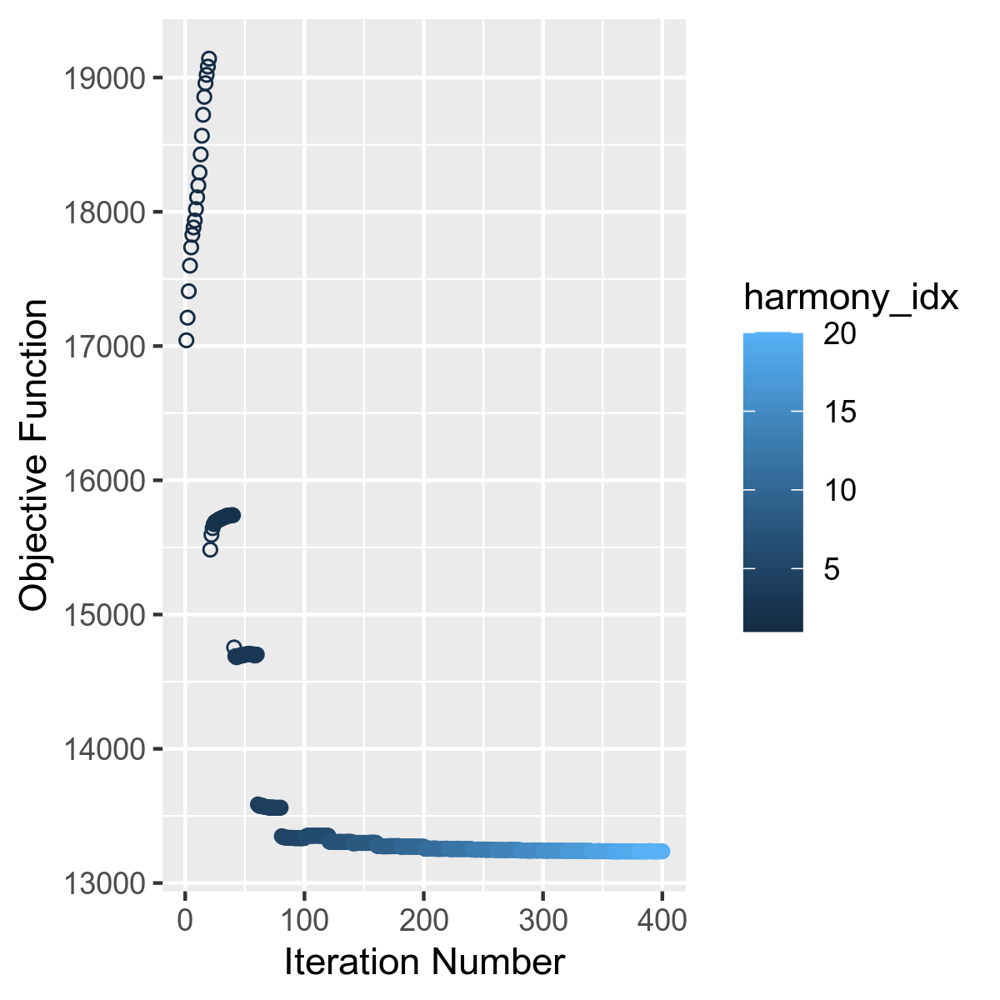

In [138]:
harmony_weighted2 <- HarmonyMatrix(weighted_pca_res, qcd_meta, 
                            c('sample', 'processing.batch', 'Site', 'dataset'), 
                            c(1.5, 1, 1, 1.5),
                            do_pca = FALSE, 
                            epsilon.harmony = -Inf, 
                            epsilon.cluster = -Inf,
                            weights = weights, 
                            max.iter.cluster = 20,
                            max.iter.harmony = 20, 
                            plot_convergence = TRUE, 
                            verbose = TRUE)

In [139]:
harmony_umap2 <- uwot::umap(harmony_weighted2, n_neighbors = 30L, metric = "euclidean", min_dist = .1)

In [140]:
weighted_umap <- uwot::umap(weighted_pca_res, n_neighbors = 30L, metric = "euclidean", min_dist = .1)

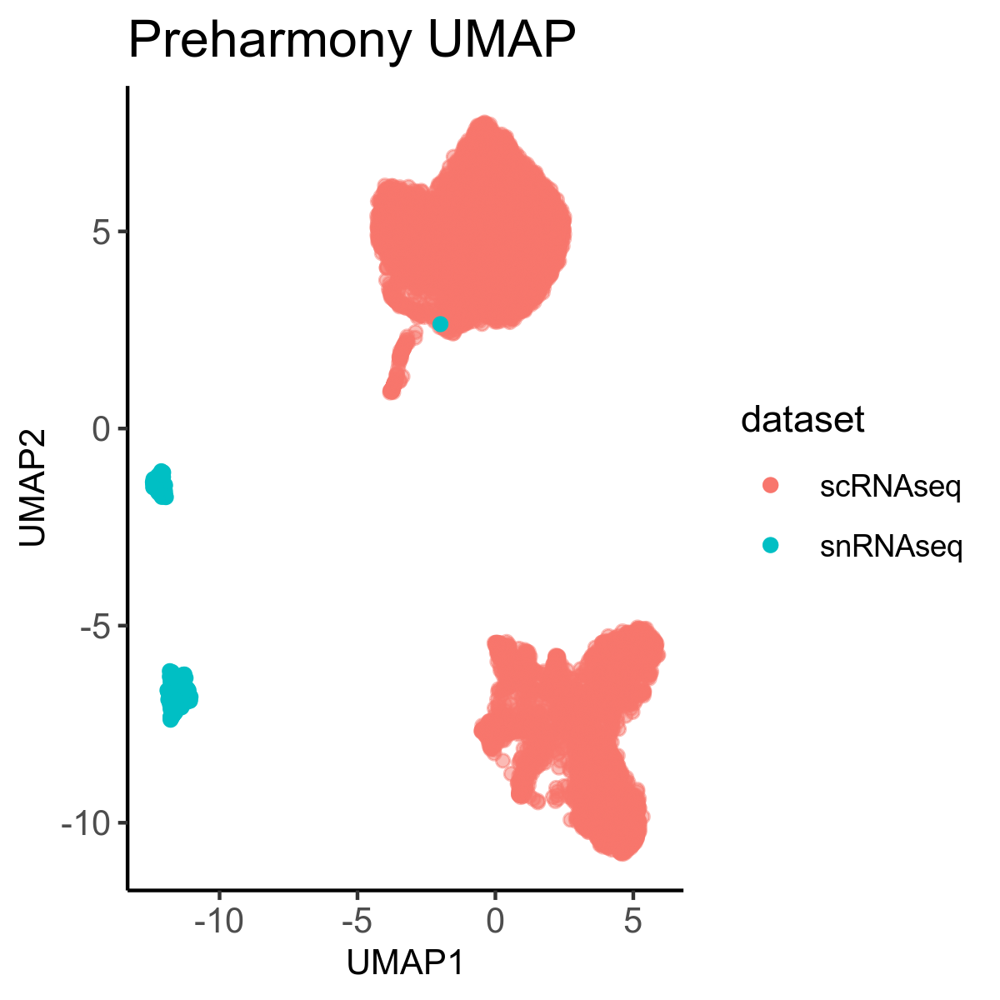

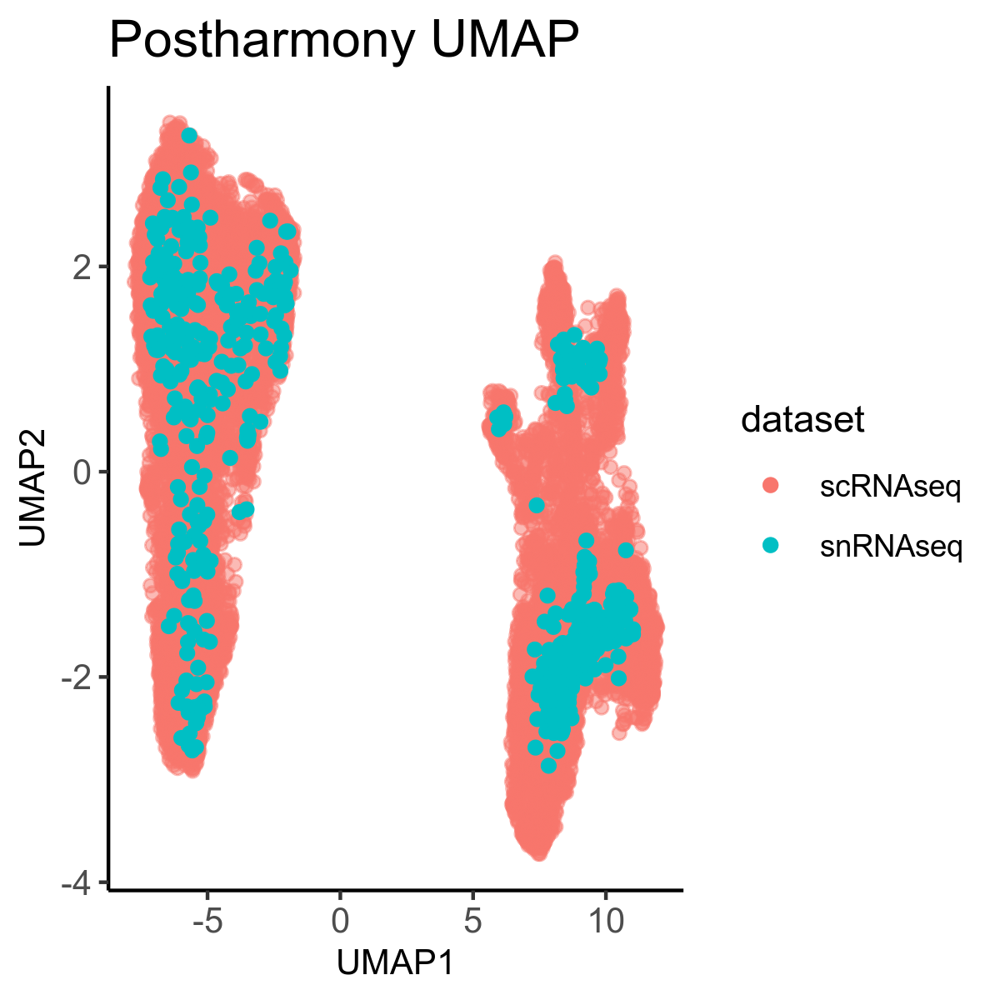

In [144]:
fig.size(4, 4)

df <- weighted_umap %>% data.frame() %>% mutate(dataset = qcd_meta$dataset)
ggplot(df, aes(x = X1, y = X2, color = dataset)) +
    geom_point(data = df %>% filter(dataset == 'scRNAseq'), alpha = 0.5, size = 1.5) +
    geom_point(data = df %>% filter(dataset == 'snRNAseq'), alpha = 2, size = 1.5) +
    theme_classic() + 
    theme(axis.text = element_text(size = 10), axis.title = element_text(size = 10), plot.title = element_text(size = 15)) +
    labs(title = 'Preharmony UMAP', x = 'UMAP1', y = 'UMAP2')

df <- harmony_umap2 %>% data.frame() %>% mutate(dataset = qcd_meta$dataset)
fig.size(4, 4)
ggplot(df, aes(x = X1, y = X2, color = dataset)) +
    geom_point(data = df %>% filter(dataset == 'scRNAseq'), alpha = 0.5, size = 1.5) +
    geom_point(data = df %>% filter(dataset == 'snRNAseq'), alpha = 2, size = 1.5) +
    theme_classic() + 
    theme(axis.text = element_text(size = 10), axis.title = element_text(size = 10), plot.title = element_text(size = 15)) +
    labs(title = 'Postharmony UMAP', x = 'UMAP1', y = 'UMAP2')

In [145]:
snn_ref <- BuildSNNSeurat(harmony_weighted2[,1:20], nn.eps = 0)


resolution_list <- c(0.2, 0.4, 0.6, 0.8, 1.0, 1.2, 1.4, 1.6, 1.8, 2.0)
ids_ref <- Reduce(cbind, mclapply(resolution_list, function(res_use) {
    Seurat:::RunModularityClustering(SNN = snn_ref, modularity = 1,
        resolution = res_use, algorithm = 1, n.start = 20,
        n.iter = 20, random.seed = 100, print.output = FALSE,
        temp.file.location = NULL, edge.file.name = NULL)
}, mc.preschedule = FALSE, mc.cores = min(20, length(resolution_list)))) 

In [146]:
harmony_umap2 <- cbind(harmony_weighted2[, 1:20], harmony_umap2, ids_ref)
colnames(harmony_umap2) <- c(paste0('hPC', 1:20), 'hUMAP1', 'hUMAP2', 'hres0.2', 'hres0.4', 'hres0.6', 'hres0.8', 'hres1.0', 'hres1.2', 'hres1.4', 'hres1.6', 'hres1.8', 'hres2.0')

In [148]:
qcd_meta <- cbind(qcd_meta, harmony_umap2)

In [260]:
saveRDS(qcd_meta, '/data/srlab/ssg34/SLE_kidney_v2/data/qcd/BP_clusterQCd_cellstate_meta_09232022.rds')

## CELL STATE CLUSTERING

In [1]:
pivot_wilcox_expr <- function(wilcox_obj) {
    df <- wilcox_obj %>% select(group, feature, avgExpr) %>% 
                    pivot_wider(names_from = 'feature', values_from = 'avgExpr') %>% data.frame()
    rownames(df) <- df$group
    df <- df %>% select(-group) %>% as.matrix()
    return(df)
}

pivot_wilcox_logFC <- function(wilcox_obj) {
    df <- wilcox_obj %>% select(group, feature, logFC) %>% 
                    pivot_wider(names_from = 'feature', values_from = 'logFC') %>% data.frame()
    rownames(df) <- df$group
    df <- df %>% select(-group) %>% as.matrix()
    return(df)
}

In [2]:
qcd_norm <- readRDS('/data/srlab/ssg34/SLE_kidney_v2/data/qcd/BP_clusterQCd_norm_09232022.rds')
qcd_meta <- readRDS('/data/srlab/ssg34/SLE_kidney_v2/data/qcd/BP_clusterQCd_cellstate_meta_09232022.rds')

In [120]:
arnon_clusters <- rbind(arnon_b_clusters %>% rename(cell = cells, arnon_cluster = cluster) %>% mutate(arnon_cluster = paste0('B', arnon_cluster)),
                  arnon_plasma_clusters %>% rename(cell = cells, arnon_cluster = cluster) %>% mutate(arnon_cluster = paste0('P', arnon_cluster)))

In [460]:
arnon_annot <- c('B0. Naive', 'B1. Switched Memory', 'B2. Activated', 'B3. Memory', 'B4, Switched Memory',
                 'B5. ABCs', 'B6. Activated Low Quality', 'B7. ISG High', 'B8. Transitional', 'B9. Unswitched Memory',
                 'B10. GC Cells', 'P0. Mature (?) Low Quality', 'P1. Mature', 'P2. Mature', 'P3. Immature', 
                 'P4. Mature IgA', 'P5. Mature (?) Low Quality', 'P6. ISG High', 'P7. Immature', 'P8. Plasmablasts like')
arnon_annot <- data.frame(arnon_cluster = c(paste0('B', 0:10), paste0('P', 0:8)), arnon_annot)

In [457]:
arnon_clusters %>% select(arnon_cluster) %>% unique()

,arnon_cluster
,<chr>
1,B0
2,B2
3,B1
7,B3
12,B4
13,B8
21,B5
24,B6
63,B9


In [121]:
qcd_meta <- left_join(qcd_meta, arnon_clusters)

Joining, by = c("cell", "arnon_cluster")


In [5]:
qcd_meta <- left_join(qcd_meta %>% select(-new_cluster_number), qcd_meta %>% 
            group_by(hres1.0) %>% 
            summarize(umap_mean = mean(hUMAP1)) %>% 
            arrange(umap_mean) %>% 
            mutate(new_cluster_number = 0:11) %>% select(- umap_mean))

Joining, by = "hres1.0"


Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Warning message:
“Removed 1 rows containing missing values (geom_label_repel).”


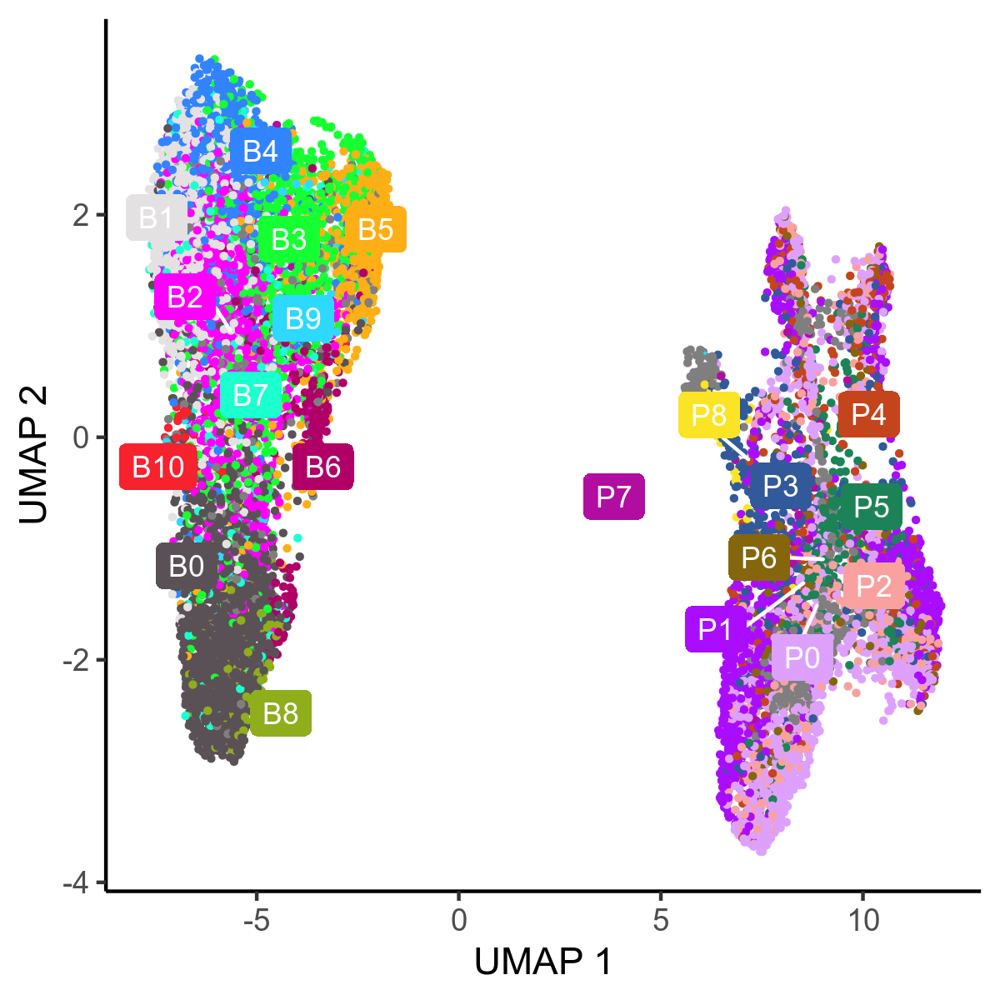

In [194]:
plot_clusters3(qcd_meta$arnon_cluster, qcd_meta$arnon_cluster, umap_use = qcd_meta %>% select(hUMAP1, hUMAP2), 
               do_labels = TRUE) +
    scale_color_manual(values = as.vector(polychrome(28))) +
    scale_fill_manual(values = as.vector(polychrome(28)))

In [389]:
plot_shuffled_features('IG', qcd_meta %>% select(hUMAP1, hUMAP2) %>% rename(V1 = hUMAP1, V2 = hUMAP2), 
                       qcd_norm, 0.95)

ERROR: Error in intI(i, n = x@Dim[1], dn[[1]], give.dn = FALSE): invalid character indexing


In [54]:
plot_clusters3(qcd_meta %>% pull(hres1.4), qcd_meta %>% pull(hres1.4), label_size = 3, umap_use = qcd_meta %>% select(hUMAP1, hUMAP2), 
               do_labels = TRUE) +
    scale_color_manual(values = as.vector(polychrome(28))) +
    scale_fill_manual(values = as.vector(polychrome(28)))

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
ERROR while rich displaying an object: Error in factor(cluster_label, factor_levels): object 'cluster_label' not found

Traceback:
1. tryCatch(withCallingHandlers({
 .     if (!mime %in% names(repr::mime2repr)) 
 .         stop("No repr_* for mimetype ", mime, " in repr::mime2repr")
 .     rpr <- repr::mime2repr[[mime]](obj)
 .     if (is.null(rpr)) 
 .         return(NULL)
 .     prepare_content(is.raw(rpr), rpr)
 . }, error = error_handler), error = outer_handler)
2. tryCatchList(expr, classes, parentenv, handlers)
3. tryCatchOne(expr, names, parentenv, handlers[[1L]])
4. doTryCatch(return(expr), name, parentenv, handler)
5. withCallingHandlers({
 .     if (!mime %in% names(repr::mime2repr)) 
 .         stop("No repr_* for mimetype ", mime, " in repr::mime2repr")
 .     rpr <- repr::mime2repr[[mime]](obj)
 .     if (is.null(rpr)) 
 .         return(NULL)
 .     prepare_content(i

In [50]:
plot_clusters3(qcd_meta$arnon_cluster, qcd_meta$arnon_cluster, umap_use = qcd_meta %>% select(hUMAP1, hUMAP2), 
               do_labels = TRUE) +
    scale_color_manual(values = as.vector(polychrome(28))) +
    scale_fill_manual(values = as.vector(polychrome(28)))

Warning message in mask$eval_all_mutate(quo):
“NAs introduced by coercion”


ERROR: Error in ggrepel::geom_label_repel(data = data.table(plt_df)[, .(hUMAP1 = mean(hUMAP1), : argument "label_size" is missing, with no default


In [5]:
wilcox <- wilcoxauc(qcd_norm, qcd_meta$new_cluster_number)

In [86]:
wilcox %>% filter(group == 7)  %>% arrange(desc(logFC)) 

feature,group,avgExpr,logFC,statistic,auc,pval,padj,pct_in,pct_out
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
IGKC,7,7.7542896,4.2141021,16200982,0.8813264,0.000000e+00,0.000000e+00,96.77003,82.686316
IGHG1,7,4.2123932,2.8196267,14347030,0.7804722,0.000000e+00,0.000000e+00,85.14212,48.303158
IGHG4,7,3.3849576,2.4566516,14442664,0.7856746,0.000000e+00,0.000000e+00,82.36434,35.595789
IGHG3,7,3.6230907,2.3428719,13929262,0.7577458,4.199645e-267,1.060077e-264,85.14212,48.682105
XBP1,7,2.3676883,1.5940435,15350706,0.8350717,0.000000e+00,0.000000e+00,94.63824,34.812632
MZB1,7,2.5063668,1.5087943,14542752,0.7911194,0.000000e+00,0.000000e+00,93.60465,40.480000
SSR4,7,3.0675521,1.5028298,14095526,0.7667905,2.474523e-265,6.078525e-263,87.20930,64.985263
TXNDC5,7,1.9072004,1.2179684,14758272,0.8028435,0.000000e+00,0.000000e+00,95.34884,33.389474
FKBP11,7,1.5926861,1.0019314,14137562,0.7690772,0.000000e+00,0.000000e+00,86.36951,31.183158


In [72]:
wilcox %>% filter(feature %in% c("IGHG1"))

feature,group,avgExpr,logFC,statistic,auc,pval,padj,pct_in,pct_out
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
IGHG1,0,1.0074379,-0.7142786,449182,0.4738247,4.201021e-01,1.000000e+00,57.74648,52.52397
IGHG1,1,0.9595499,-1.0520720,15926556,0.4392809,6.103196e-31,1.797128e-29,50.97411,53.16246
IGHG1,2,0.2869635,-1.7583281,7118627,0.2607644,0.000000e+00,0.000000e+00,17.20688,60.63713
IGHG1,3,0.7441028,-1.0413284,4440860,0.4066308,1.646557e-22,1.462758e-20,43.44828,53.18251
IGHG1,4,0.9331432,-0.8015756,1595875,0.4321466,3.705564e-05,7.233459e-04,40.56940,52.80779
IGHG1,5,0.9140947,-0.8593496,4850174,0.4455403,1.312062e-08,3.182423e-07,51.21107,52.64415
IGHG1,6,2.1652087,0.4600191,2762262,0.5689552,1.534969e-06,6.424402e-06,70.43011,52.04199
IGHG1,7,4.2123932,2.8196267,14347030,0.7804722,0.000000e+00,0.000000e+00,85.14212,48.30316
IGHG1,8,0.3800312,-1.4125160,3047636,0.3380918,2.281968e-53,2.850591e-51,34.97884,53.53154


In [409]:
bp_de <- wilcox %>% filter(feature %in% c('HLA-DPB1', 'HLA-DRA', 'HLA-DRB1', 'HLA-DPA1', 'IGHM')) %>% pivot_wilcox_logFC() %>% data.frame()

In [298]:
max(bp_de)

[1] 1.493463

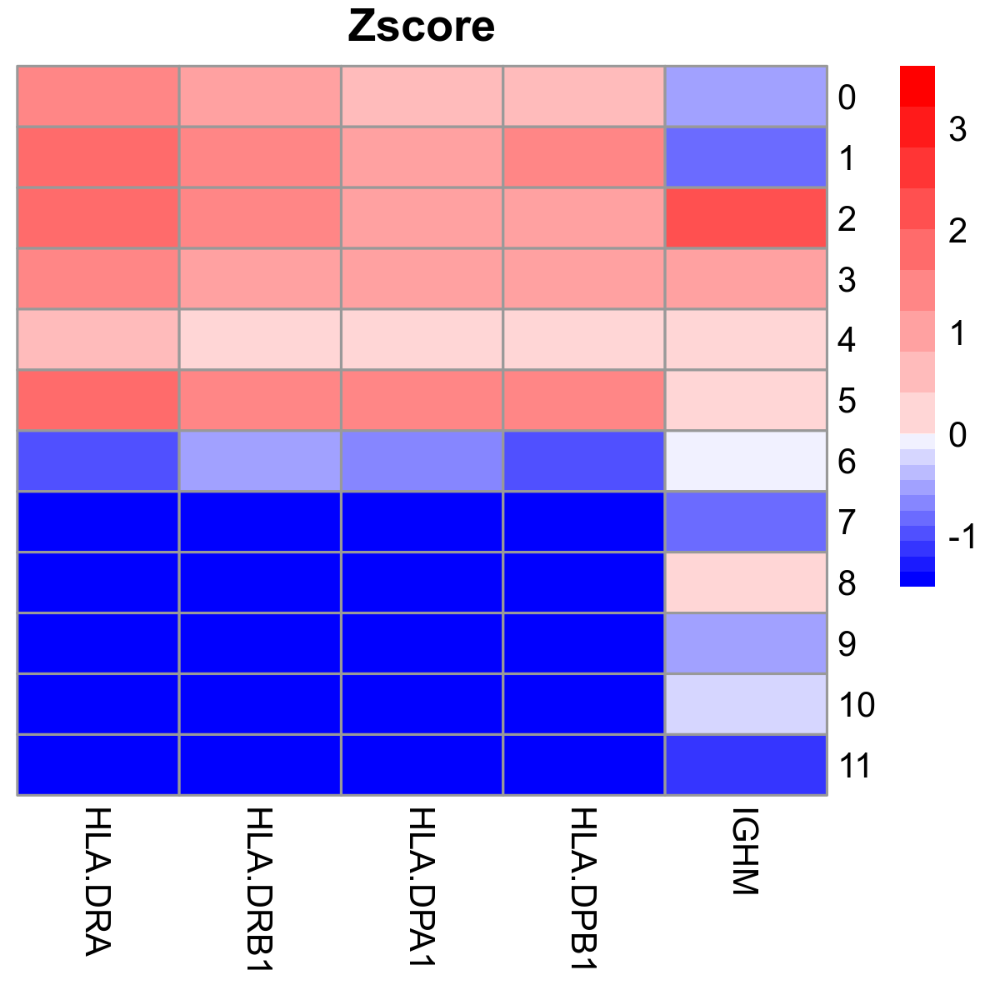

In [411]:
fig.size(4, 4)
pheatmap(bp_de, scale = 'none', cluster_rows = FALSE, cluster_cols = FALSE,
         fontsize_row = 10, fontsize_col= 10, main = 'Zscore',
         color=colorRampPalette(c("blue", "white", "red"))(20),
         breaks = c(seq(-1.5, 0, 0.15), seq(0.01, 4, 0.4)))

In [3]:
annotations <- c('0. MME+ BCL6+ B', '1. MHC2+ IGHM- B', '2. IGHD+ FCER2+ CD22+ B', '3. CD24+ CD80+ IGHM+ B', '4. BCL11A+ TCF4+ IGHE+ B', '5. ITGAX+ TBX21+ B',
                 '6. CD38++ CD27++ IGHD- Plasma', '7. IGHG+ IGL- Plasma', '8. JCHAIN+ IGA+ IGL- Plasma', '9. IGHG+ IGL- Plasma', '10. JCHAIN+ IGA+ IGL+ Plasma',
                 '11. IGHG+ IGL+ Plasma')
cluster <- seq(0, 11)
final_annot <- data.frame(new_cluster_number = cluster, annotation = annotations)

In [105]:
qcd_meta <- left_join(qcd_meta, final_annot)

Joining, by = "new_cluster_number"


In [4]:
plot_clusters3(qcd_meta$new_cluster_number, qcd_meta$annotation, label_size = 2, umap_use = qcd_meta %>% select(hUMAP1, hUMAP2), 
               do_labels = TRUE) +
    scale_color_manual(values = as.vector(polychrome(28))) +
    scale_fill_manual(values = as.vector(polychrome(28)))

Warning message in base::nchar(wide_chars$test, type = "width"):
“restarting interrupted promise evaluation”
Warning message in base::nchar(wide_chars$test, type = "width"):
“internal error -3 in R_decompress1”
ERROR while rich displaying an object: Error in base::nchar(wide_chars$test, type = "width"): lazy-load database '/PHShome/ssg34/.conda/envs/plswork/lib/R/library/cli/R/sysdata.rdb' is corrupt

Traceback:
1. tryCatch(withCallingHandlers({
 .     if (!mime %in% names(repr::mime2repr)) 
 .         stop("No repr_* for mimetype ", mime, " in repr::mime2repr")
 .     rpr <- repr::mime2repr[[mime]](obj)
 .     if (is.null(rpr)) 
 .         return(NULL)
 .     prepare_content(is.raw(rpr), rpr)
 . }, error = error_handler), error = outer_handler)
2. tryCatchList(expr, classes, parentenv, handlers)
3. tryCatchOne(expr, names, parentenv, handlers[[1L]])
4. doTryCatch(return(expr), name, parentenv, handler)
5. withCallingHandlers({
 .     if (!mime %in% names(repr::mime2repr)) 
 .         

In [5]:
ggplot(qcd_meta, aes(x = hUMAP1, y = hUMP2, fill = annotation)) +
    geom_point() + 
    scale_color_manual(values = as.vector(polychrome(28))) +
    scale_fill_manual(values = as.vector(polychrome(28))) 

Warning message in base::nchar(wide_chars$test, type = "width"):
“restarting interrupted promise evaluation”
Warning message in base::nchar(wide_chars$test, type = "width"):
“internal error -3 in R_decompress1”
ERROR while rich displaying an object: Error in base::nchar(wide_chars$test, type = "width"): lazy-load database '/PHShome/ssg34/.conda/envs/plswork/lib/R/library/cli/R/sysdata.rdb' is corrupt

Traceback:
1. tryCatch(withCallingHandlers({
 .     if (!mime %in% names(repr::mime2repr)) 
 .         stop("No repr_* for mimetype ", mime, " in repr::mime2repr")
 .     rpr <- repr::mime2repr[[mime]](obj)
 .     if (is.null(rpr)) 
 .         return(NULL)
 .     prepare_content(is.raw(rpr), rpr)
 . }, error = error_handler), error = outer_handler)
2. tryCatchList(expr, classes, parentenv, handlers)
3. tryCatchOne(expr, names, parentenv, handlers[[1L]])
4. doTryCatch(return(expr), name, parentenv, handler)
5. withCallingHandlers({
 .     if (!mime %in% names(repr::mime2repr)) 
 .         

In [3]:
plot_clusters3(qcd_meta$annotation, qcd_meta$new_cluster_number, label_size = 2, umap_use = qcd_meta %>% select(hUMAP1, hUMAP2),
              do_labels = TRUE) +
    scale_color_manual(values = as.vector(polychrome(28))) +
    scale_fill_manual(values = as.vector(polychrome(28))) +
    theme(legend.position = 'none')

Warning message in mask$eval_all_mutate(quo):
“NAs introduced by coercion”
Warning message in base::nchar(wide_chars$test, type = "width"):
“internal error -3 in R_decompress1”


ERROR: Error in base::nchar(wide_chars$test, type = "width"): lazy-load database '/PHShome/ssg34/.conda/envs/plswork/lib/R/library/cli/R/sysdata.rdb' is corrupt


In [461]:
qcd_meta <- left_join(qcd_meta, arnon_annot)

Joining, by = "arnon_cluster"


In [464]:
arnon_vs_sid <- qcd_meta %>% filter(dataset == 'scRNAseq') %>% select(annotation, arnon_annot) %>% na.omit() %>% 
                                            group_by(annotation, arnon_annot) %>% tally()

In [467]:
df <- ungroup(arnon_vs_sid)
statistic <- vector()
for (i in 1:nrow(df)) {
        inAandB <- df %>% filter(annotation == arnon_vs_sid$annotation[i], 
                                           arnon_annot == arnon_vs_sid$arnon_annot[i]) %>% pull(n) %>% sum()
        inAnotB <- df %>% filter(annotation == arnon_vs_sid$annotation[i], 
                                           arnon_annot != arnon_vs_sid$arnon_annot[i]) %>% pull(n) %>% sum()
        inBnotA <- df %>% filter(annotation != arnon_vs_sid$annotation[i], 
                                           arnon_annot == arnon_vs_sid$arnon_annot[i]) %>% pull(n) %>% sum()
        notBnotA <- df %>% filter(annotation != arnon_vs_sid$annotation[i], 
                                            arnon_annot != arnon_vs_sid$arnon_annot[i]) %>% pull(n) %>% sum()
        contin <- data.frame(c(inAandB, inAnotB), c(inBnotA, notBnotA))
        or <- (contin[1, 1] * contin[2, 2]) / (contin[1, 2] * contin[2, 1])
        statistic <- c(statistic, sign(log(or)) * sqrt(chisq.test(contin, simulate.p.value = TRUE)$statistic))        
}

In [468]:
df$stat <- statistic

In [469]:
or_plot <- df %>% select(-n) %>% pivot_wider(names_from = 'annotation', values_from = 'stat') 
cols <- colnames(or_plot)
or_plot[is.na(or_plot)] <- 0 
or_plot <- or_plot %>% data.frame()
rownames(or_plot) <- or_plot$arnon_annot
colnames(or_plot) <- cols
or_plot <- or_plot[, -1]

In [471]:
library(dendsort)
sort_hclust <- function(...) as.hclust(dendsort(as.dendrogram(...)))

mat_cluster_rows <- hclust(dist(or_plot))

mat_cluster_rows <- sort_hclust(mat_cluster_rows)

In [474]:
or_plot %>% rownames()

[1] "B0. Naive"                  "B10. GC Cells"             
 [3] "B3. Memory"                 "B4, Switched Memory"       
 [5] "B9. Unswitched Memory"      "B1. Switched Memory"       
 [7] "B2. Activated"              "B5. ABCs"                  
 [9] "B6. Activated Low Quality"  "B7. ISG High"              
[11] "P3. Immature"               "P7. Immature"              
[13] "P0. Mature (?) Low Quality" "P1. Mature"                
[15] "P2. Mature"                 "P4. Mature IgA"            
[17] "P5. Mature (?) Low Quality" "P6. ISG High"              
[19] "P8. Plasmablasts like"      "B8. Transitional"

In [475]:
or_plot %>% colnames()

[1] "0. MME+ BCL6+ B"               "1. MHC2+ IGHM- B"             
 [3] "10. JCHAIN+ IGA+ IGL+ Plasma"  "11. IGHG+ IGL+ Plasma"        
 [5] "2. IGHD+ FCER2+ CD22+ B"       "3. CD24+ CD80+ IGHM+ B"       
 [7] "4. BCL11A+ TCF4+ IGHE+ B"      "5. ITGAX+ TBX21+ B"           
 [9] "6. CD38++ CD27++ IGHD- Plasma" "7. IGHG+ IGL- Plasma"         
[11] "8. JCHAIN+ IGA+ IGL- Plasma"   "9. IGHG+ IGL- Plasma"

In [477]:
col.order <- c('0. MME+ BCL6+ B', '1. MHC2+ IGHM- B', '2. IGHD+ FCER2+ CD22+ B', '3. CD24+ CD80+ IGHM+ B', '4. BCL11A+ TCF4+ IGHE+ B', 
               '5. ITGAX+ TBX21+ B', '6. CD38++ CD27++ IGHD- Plasma', '7. IGHG+ IGL- Plasma', '8. JCHAIN+ IGA+ IGL- Plasma', '9. IGHG+ IGL- Plasma', 
               '10. JCHAIN+ IGA+ IGL+ Plasma', '11. IGHG+ IGL+ Plasma')

In [484]:
row.order <- c('B10. GC Cells', 'B1. Switched Memory', 'B2. Activated', 'B4, Switched Memory', 
               'B0. Naive', 'B8. Transitional', 'B3. Memory', 'B6. Activated Low Quality', 'B5. ABCs', 'P3. Immature', 'P8. Plasmablasts like', 
               'P1. Mature', 'P0. Mature (?) Low Quality', 'P2. Mature', 'P4. Mature IgA', 'P5. Mature (?) Low Quality',
              'B7. ISG High', 'P7. Immature', 'P6. ISG High')

In [483]:
rownames(or_plot)[- which(or_plot %>% rownames() %in% row.order)]

[1] "B3. Memory"                "B9. Unswitched Memory"    
[3] "B6. Activated Low Quality" "B7. ISG High"             
[5] "P7. Immature"              "P6. ISG High"

In [491]:
quantile(unlist(or_plot), c(0, 0.2, 0.4, 0.6, 0.8, 1.0))

0%        20%        40%        60%        80%       100% 
-24.455929   0.000000   0.000000   0.000000   2.994168  84.600144

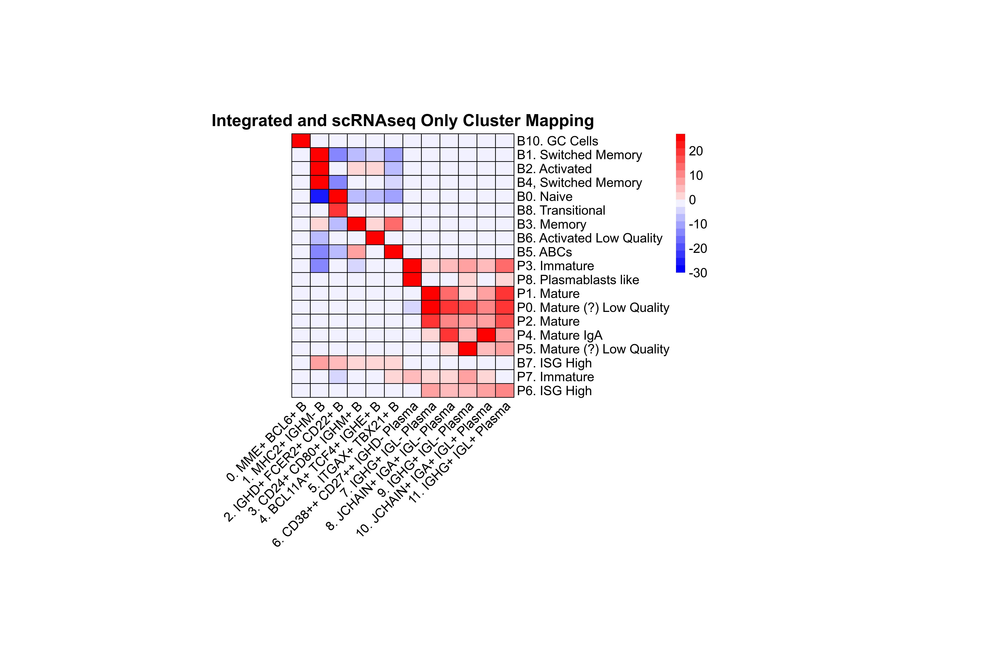

In [486]:
fig.size(10, 15)
pheatmap::pheatmap(or_plot[row.order, col.order], cellwidth = 20, cellheight = 15, 
                   color=colorRampPalette(c("blue", "white", "red"))(20), 
                   breaks = c(seq(-30, 0, 3), seq(0.001, 30, 3)), 
                   border_color = 'black', scale = 'none',
                   cluster_rows = FALSE, cluster_cols = FALSE, 
                   main = 'Integrated and scRNAseq Only Cluster Mapping', 
                   fontsize = 14, angle_col = 45)

In [8]:
wilcox <- wilcoxauc(qcd_norm, qcd_meta$annotation)

In [11]:
saveRDS(wilcox %>% filter(padj < 0.05), '/data/srlab/ssg34/SLE_kidney_v2/data/qcd/bp_cluster_de_wilcoxauc_pad0.05.rds')

In [3]:
wilcox_sig <- readRDS('/data/srlab/ssg34/SLE_kidney_v2/data/qcd/bp_cluster_de_wilcoxauc_pad0.05.rds')

In [5]:
write.csv(wilcox_sig, '/data/srlab/ssg34/SLE_kidney_v2/data/qcd/bp_cluster_de_wilcoxauc_pad0.05.csv', row.names = FALSE, quote = FALSE)

In [13]:
top_bottom_100 <- rbind(wilcox %>% filter(padj < 0.05) %>% group_by(group) %>% arrange(desc(logFC)) %>% slice(1:100),
                       wilcox %>% filter(padj < 0.05) %>% group_by(group) %>% arrange(logFC) %>% slice(1:100))

In [14]:
saveRDS(top_bottom_100, '/data/srlab/ssg34/SLE_kidney_v2/data/qcd/bp_cluster_de_wilcoxauc_pad0.05_topbottom100.rds')

In [6]:
wilcox_100 <- readRDS('/data/srlab/ssg34/SLE_kidney_v2/data/qcd/bp_cluster_de_wilcoxauc_pad0.05_topbottom100.rds')

In [8]:
write.csv(wilcox_100, '/data/srlab/ssg34/SLE_kidney_v2/data/qcd/bp_cluster_de_wilcoxauc_pad0.05_topbottom100.csv', quote = FALSE, row.names = FALSE)

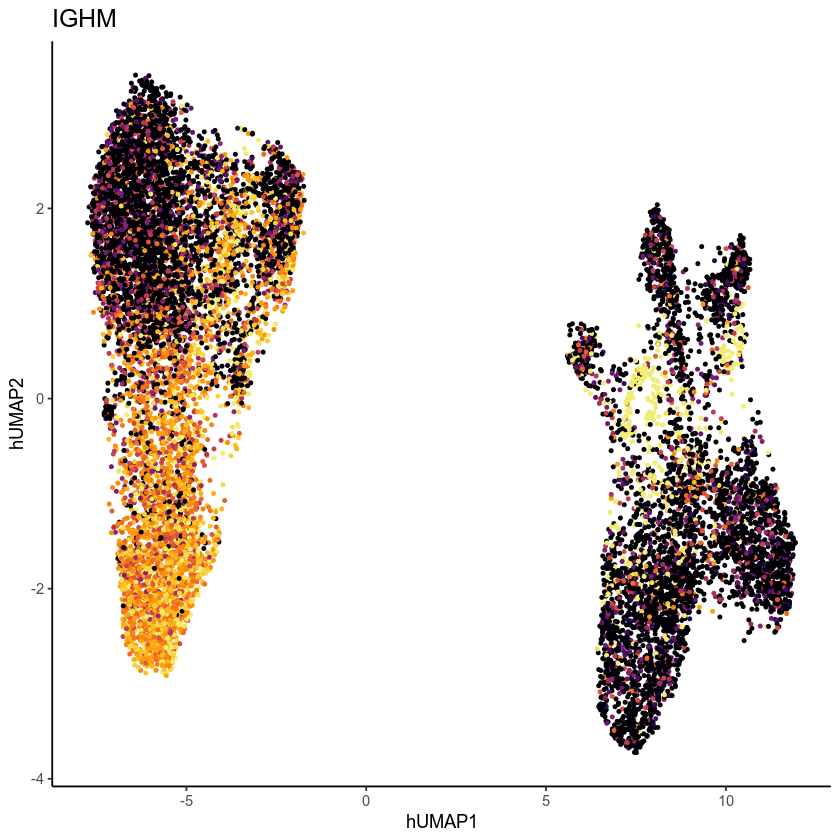

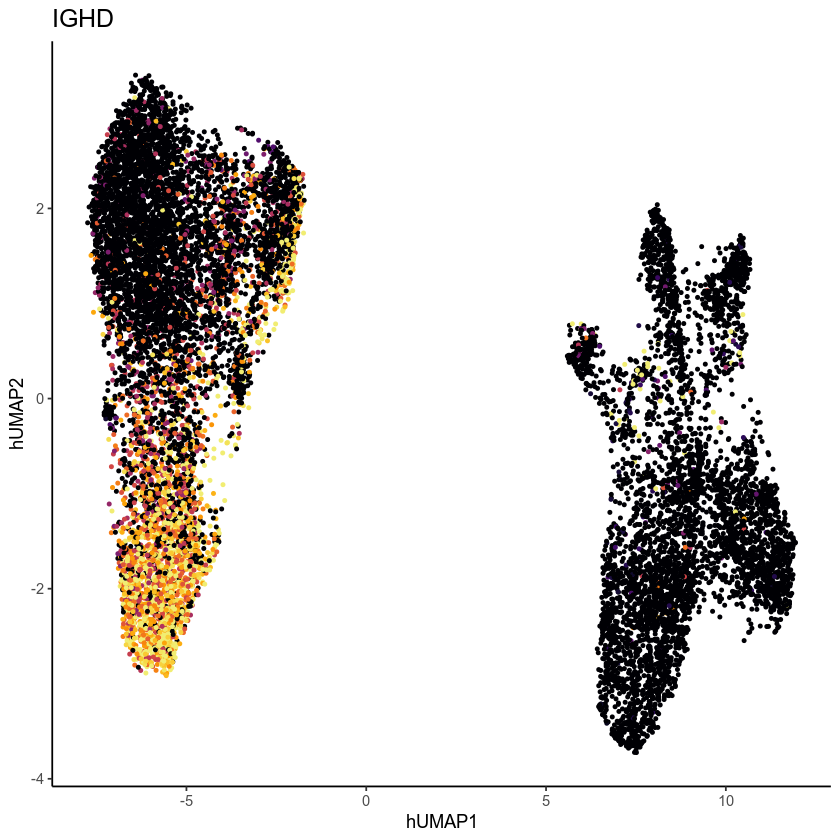

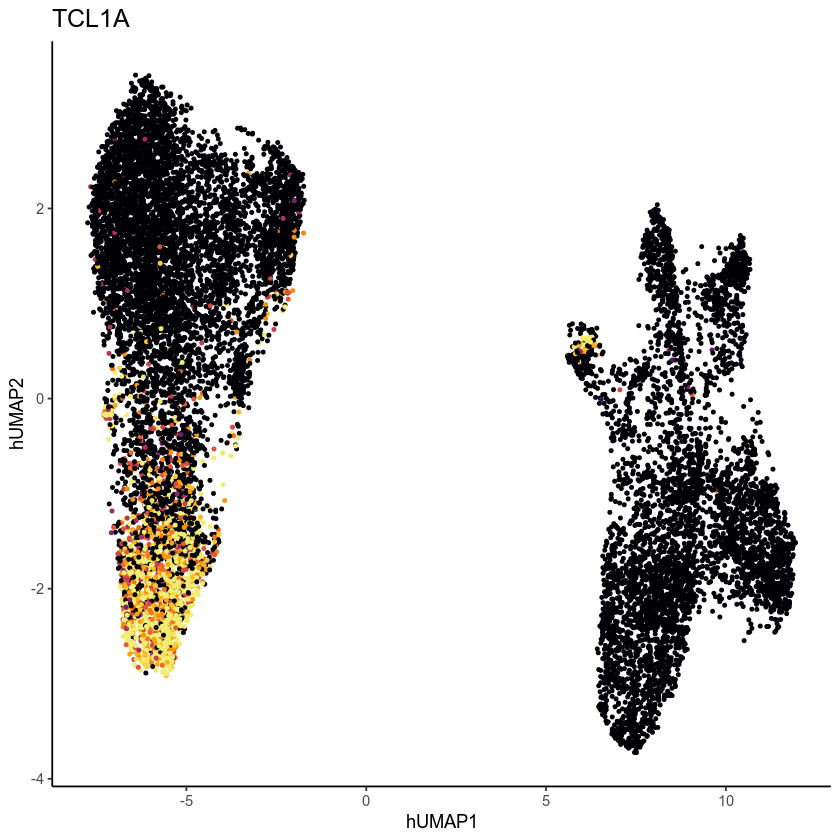

In [72]:
plot_shuffled_features('IGHM', qcd_meta %>% select(hUMAP1, hUMAP2) %>% rename(V1 = hUMAP1, V2 = hUMAP2), 
                       qcd_norm, 0.95)
plot_shuffled_features('IGHD', qcd_meta %>% select(hUMAP1, hUMAP2) %>% rename(V1 = hUMAP1, V2 = hUMAP2), 
                       qcd_norm, 0.95)
plot_shuffled_features('TCL1A', qcd_meta %>% select(hUMAP1, hUMAP2) %>% rename(V1 = hUMAP1, V2 = hUMAP2), 
                       qcd_norm, 0.95)

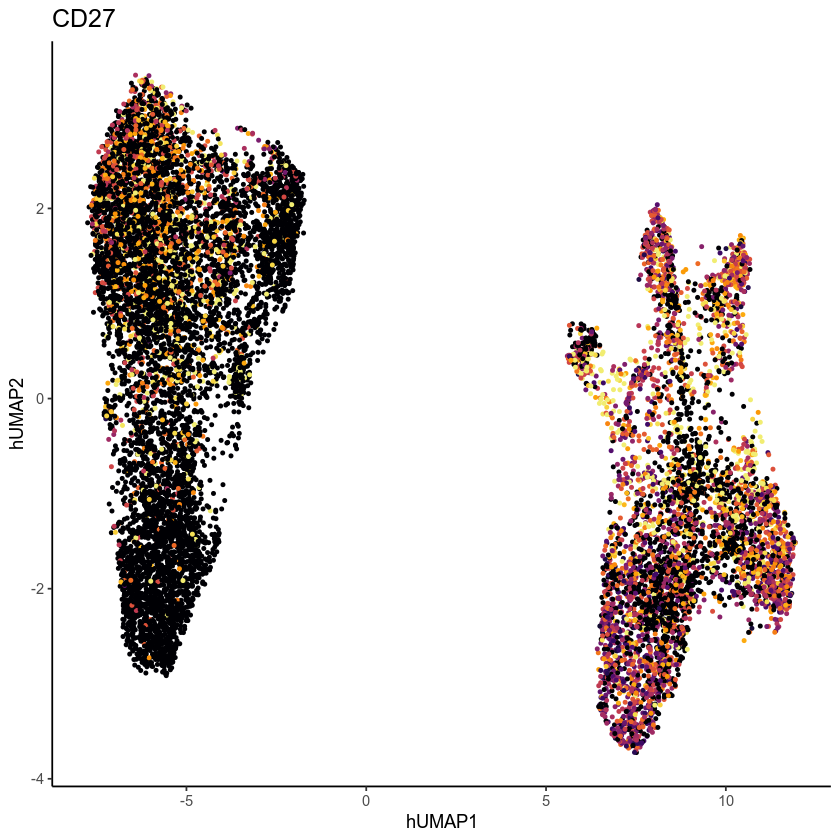

In [74]:
plot_shuffled_features('CD27', qcd_meta %>% select(hUMAP1, hUMAP2) %>% rename(V1 = hUMAP1, V2 = hUMAP2), 
                       qcd_norm, 0.95)

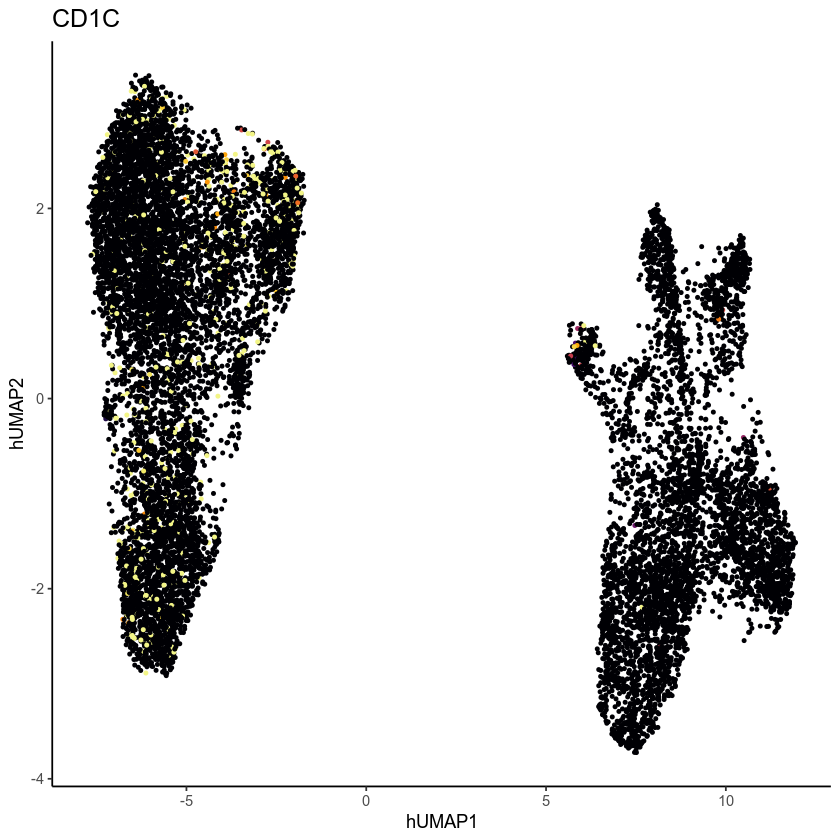

In [78]:
plot_shuffled_features('CD1C', qcd_meta %>% select(hUMAP1, hUMAP2) %>% rename(V1 = hUMAP1, V2 = hUMAP2), 
                       qcd_norm, 0.97)

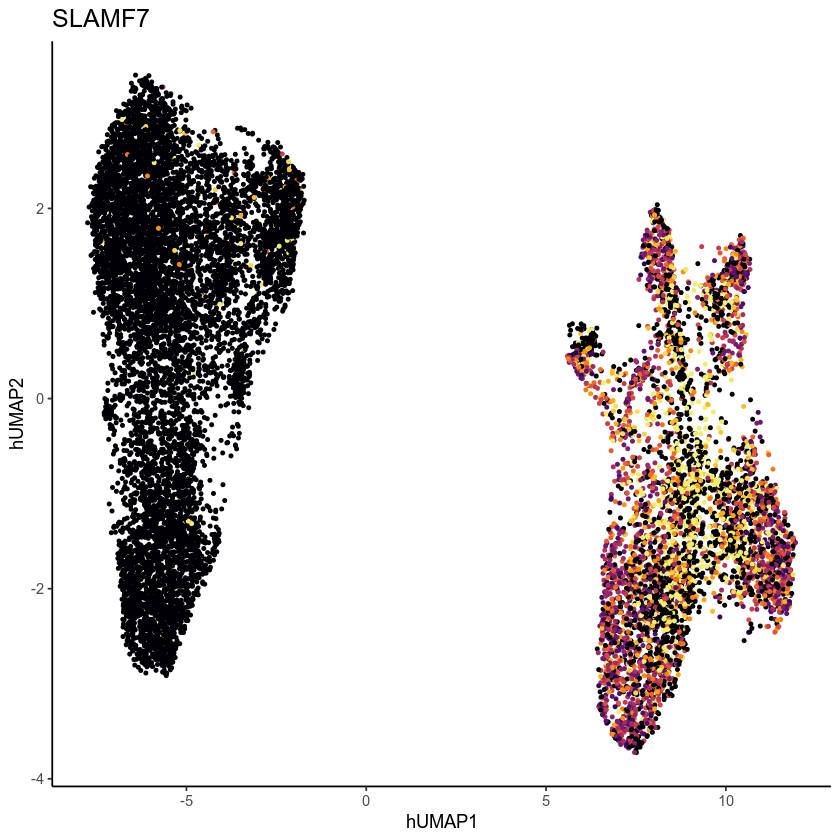

In [100]:
plot_shuffled_features('SLAMF7', qcd_meta %>% select(hUMAP1, hUMAP2) %>% rename(V1 = hUMAP1, V2 = hUMAP2), 
                       qcd_norm, 0.95)

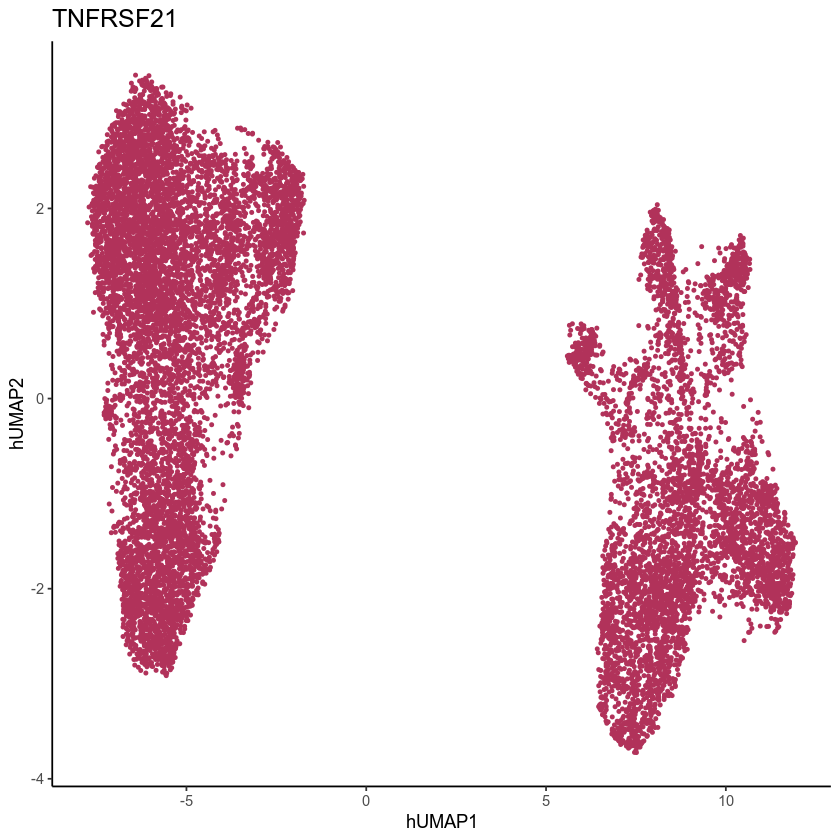

In [25]:
plot_shuffled_features('TNFRSF21', qcd_meta %>% select(hUMAP1, hUMAP2) %>% rename(V1 = hUMAP1, V2 = hUMAP2), 
                       qcd_norm, 0.95)

In [11]:
qcd_meta <- read.csv('/data/srlab/ssg34/SLE_kidney_v2/data/qcd/BP_clusterQCd_cellstate_meta_09232022.csv')

In [9]:
saveRDS(qcd_meta %>% select(-X), '/data/srlab/ssg34/SLE_kidney_v2/data/qcd/BP_clusterQCd_cellstate_meta_09232022.rds')

In [10]:
write.csv(qcd_meta %>% select(-X), '/data/srlab/ssg34/SLE_kidney_v2/data/qcd/BP_clusterQCd_cellstate_meta_09232022.csv', 
          quote = FALSE, row.names = FALSE)

In [106]:
saveRDS(qcd_meta, '/data/srlab/ssg34/SLE_kidney_v2/data/qcd/BP_clusterQCd_cellstate_meta_annotations_09232022.rds')

## CHECK STUFF FOR ARNON

In [2]:
qcd_meta <- readRDS('/data/srlab/ssg34/SLE_kidney_v2/data/qcd/BP_clusterQCd_cellstate_meta_annotations_09232022.rds')
qcd_norm <- readRDS('/data/srlab/ssg34/SLE_kidney_v2/data/qcd/BP_clusterQCd_norm_09232022.rds')

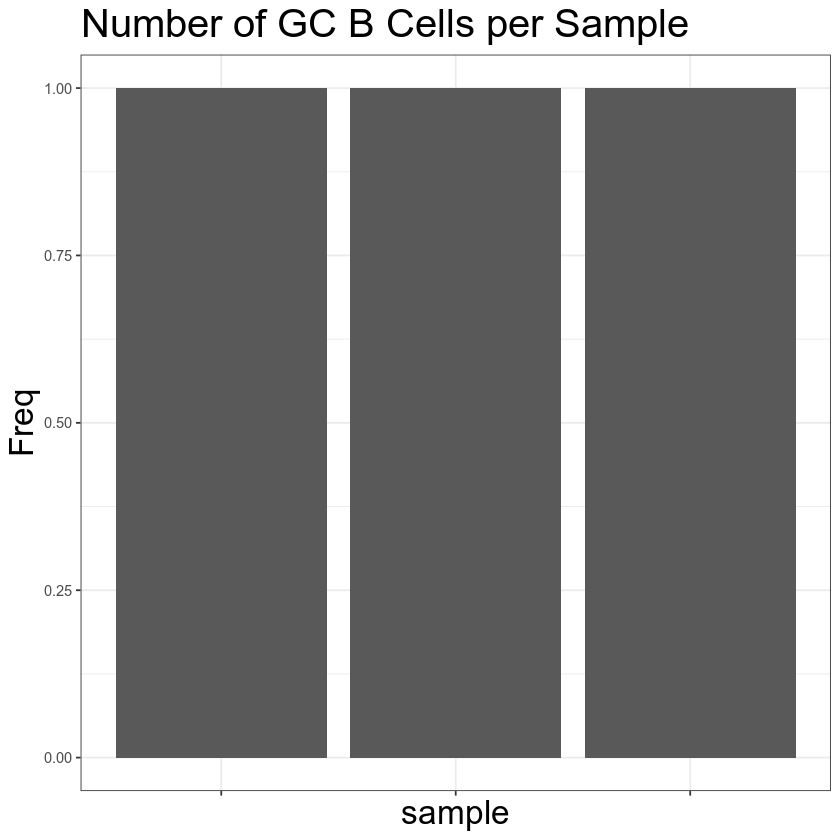

In [135]:
ggplot(qcd_meta %>% select(annotation, sample, dataset) %>% filter(annotation == '0. MME+ BCL6+ B', dataset == 'snRNAseq') %>% table() %>% data.frame(), aes(x = sample, y = Freq)) +
    geom_bar(stat = 'identity') + 
    theme_bw() + 
    theme(axis.text.x  = element_blank(),
          axis.title = element_text(size = 20),
          title = element_text(size = 20)) + 
    labs(title = "Number of GC B Cells per Sample")

In [136]:
qcd_meta %>% select(annotation, sample, dataset) %>% filter(annotation == '0. MME+ BCL6+ B', dataset == 'snRNAseq') %>% table() %>% data.frame()

annotation,sample,dataset,Freq
<fct>,<fct>,<fct>,<int>
0. MME+ BCL6+ B,AMPSLEkid_nuc_2725,snRNAseq,1
0. MME+ BCL6+ B,AMPSLEkid_nuc_2807,snRNAseq,1
0. MME+ BCL6+ B,AMPSLEkid_nuc_2824,snRNAseq,1


Adding missing grouping variables: `new_cluster_number`


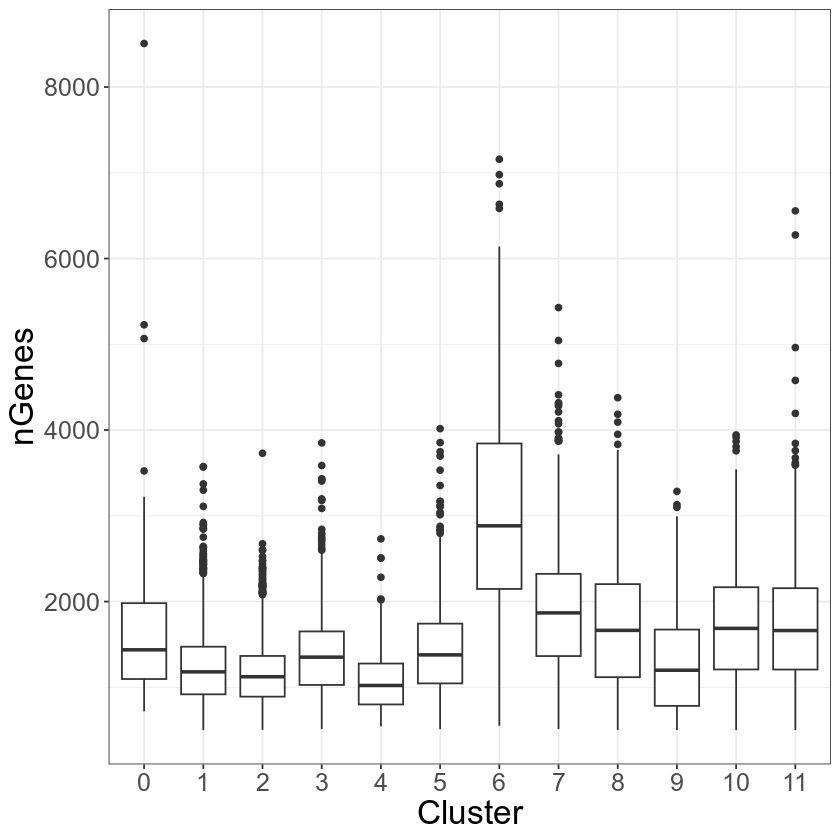

In [32]:
ggplot(qcd_meta %>% group_by(new_cluster_number) %>% select(nCount_RNA, nFeature_RNA),
        aes(x = as.factor(new_cluster_number), y = nFeature_RNA)) + 
    geom_boxplot() +
    theme_bw() +
    labs(x = 'Cluster', y = "nGenes") + 
    theme(axis.text = element_text(size = 15),
          axis.title = element_text(size = 20))

In [110]:
qcd_norm[ISG_genes, 1]

CXCR5    CCR7     CR2   TRAF5    ETS1 TNFAIP3    IRF8   BACH2    TCF7 
      0       0       0       0       0       0       0       0       0

In [88]:
ISG_genes <- c("CXCR5", "CCR7", "CR2", "TRAF5", "ETS1", "TNFAIP3", "IRF8", "BACH2", "TCF7")

In [111]:
ISG_scores <- colMeans(qcd_norm[ISG_genes, ]) / apply(qcd_norm[ISG_genes, ], 2, sd)

In [123]:
ISG_scores <- colMeans(((qcd_norm[ISG_genes, ] - rowMeans(qcd_norm[ISG_genes, ])) / apply(qcd_norm[ISG_genes, ], 1, sd)))

In [121]:
apply(qcd_norm[ISG_genes, ], 1, sd)

CXCR5      CCR7       CR2     TRAF5      ETS1   TNFAIP3      IRF8     BACH2 
0.3253172 0.5325710 0.3135749 0.5450504 0.6794934 0.3292927 0.6635849 0.4720010 
     TCF7 
0.3571177

In [107]:
colSds(matrix(qcd_norm[ISG_genes, ]))

[1] 0.4995212

In [105]:
library(matrixStats)
col

Warning message:
“package ‘matrixStats’ was built under R version 4.1.3”

Attaching package: ‘matrixStats’


The following object is masked from ‘package:singlecellmethods’:

    rowVars


The following object is masked from ‘package:dplyr’:

    count




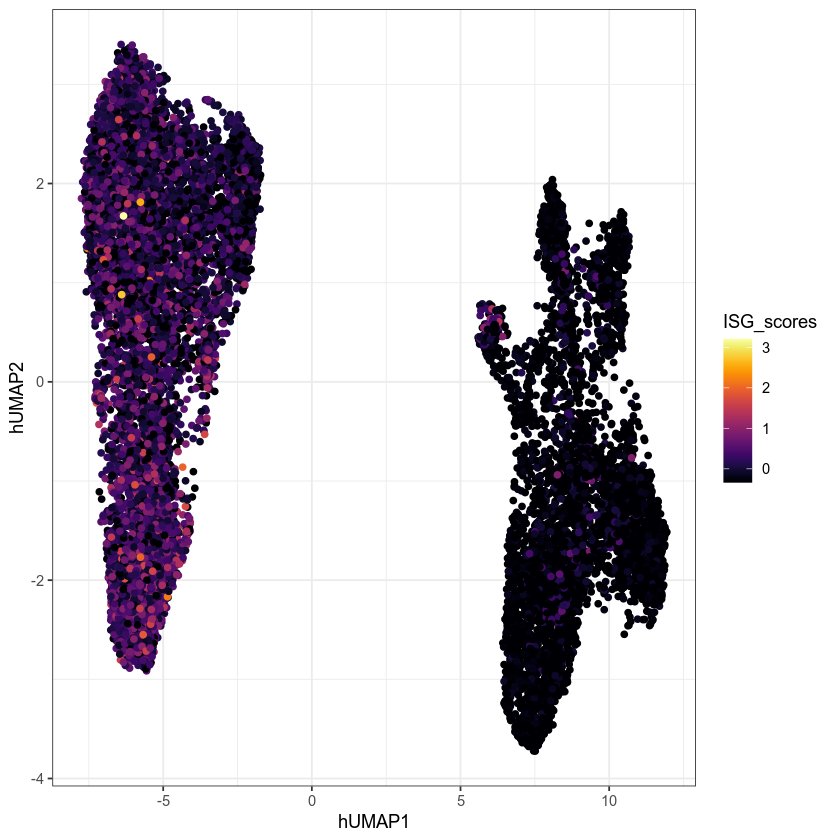

In [124]:
ggplot(qcd_meta, aes(x = hUMAP1, y = hUMAP2, color = ISG_scores)) + 
    geom_point() + 
    scale_color_viridis(option = "inferno") + 
    theme_bw() 

In [125]:
qcd_meta$ISG_score <- ISG_scores

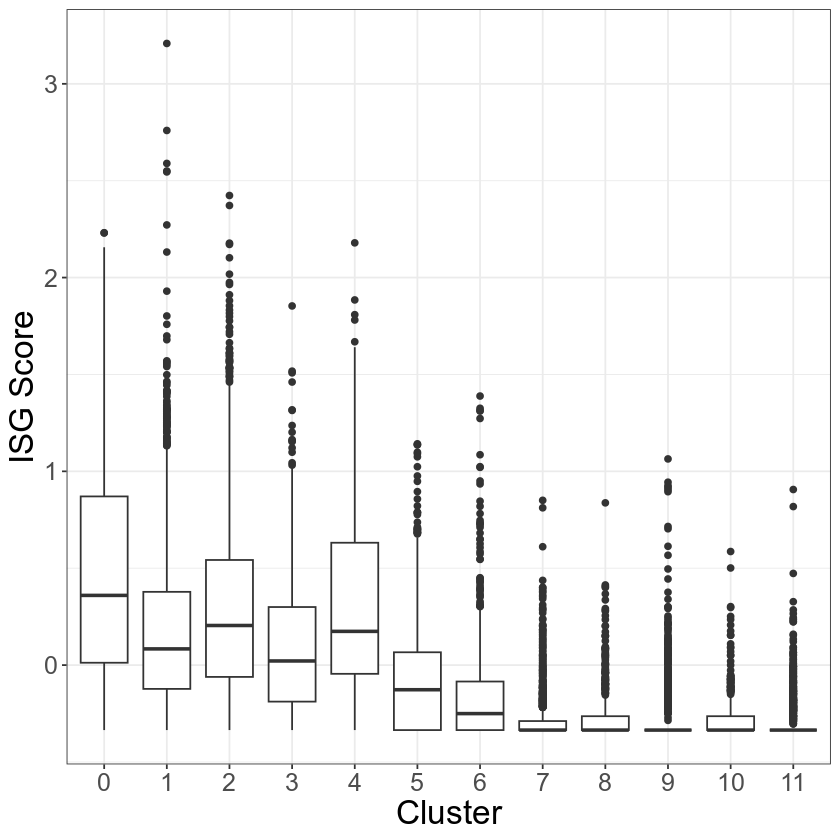

In [132]:
ggplot(qcd_meta %>% group_by(new_cluster_number) %>% select(new_cluster_number, ISG_score),
        aes(x = as.factor(new_cluster_number), y = ISG_score)) + 
    geom_boxplot() +
    theme_bw() +
    labs(x = 'Cluster', y = "ISG Score") + 
    theme(axis.text = element_text(size = 15),
          axis.title = element_text(size = 20))

## SPLIT B and Plasma

In [28]:
qcd_meta_b <- qcd_meta %>% filter(new_cluster_number %in% c(0, 1, 2, 3, 4, 5))
qcd_meta_plasma <- qcd_meta %>% filter(new_cluster_number %in% c(6, 7, 8, 9, 10, 11))

In [34]:
saveRDS(qcd_meta_b[, 1:15], '/data/srlab/ssg34/SLE_kidney_v2/data/qcd/B_subsetted_meta_10272022.rds')
saveRDS(qcd_meta_plasma[, 1:15], '/data/srlab/ssg34/SLE_kidney_v2/data/qcd/Plasma_subsetted_meta_10272022.rds')

## CELL STATE PROPORTIONS

In [7]:
cell_states <- qcd_meta %>% group_by(dataset, annotation, new_cluster_number) %>% 
                select(dataset, annotation) %>% tally() %>% ungroup() %>%
                group_by(dataset) %>% mutate(prop = n / sum(n)) %>% select(-n) %>% pivot_wider(values_from = prop, names_from = dataset)

Adding missing grouping variables: `new_cluster_number`


In [8]:
cell_states <- cell_states[order(cell_states$new_cluster_number), ]

In [9]:
cor.test(cell_states$scRNAseq, cell_states$snRNAseq)


	Pearson's product-moment correlation

data:  cell_states$scRNAseq and cell_states$snRNAseq
t = 1.9563, df = 10, p-value = 0.07892
alternative hypothesis: true correlation is not equal to 0
95 percent confidence interval:
 -0.0684765  0.8449011
sample estimates:
      cor 
0.5261002 


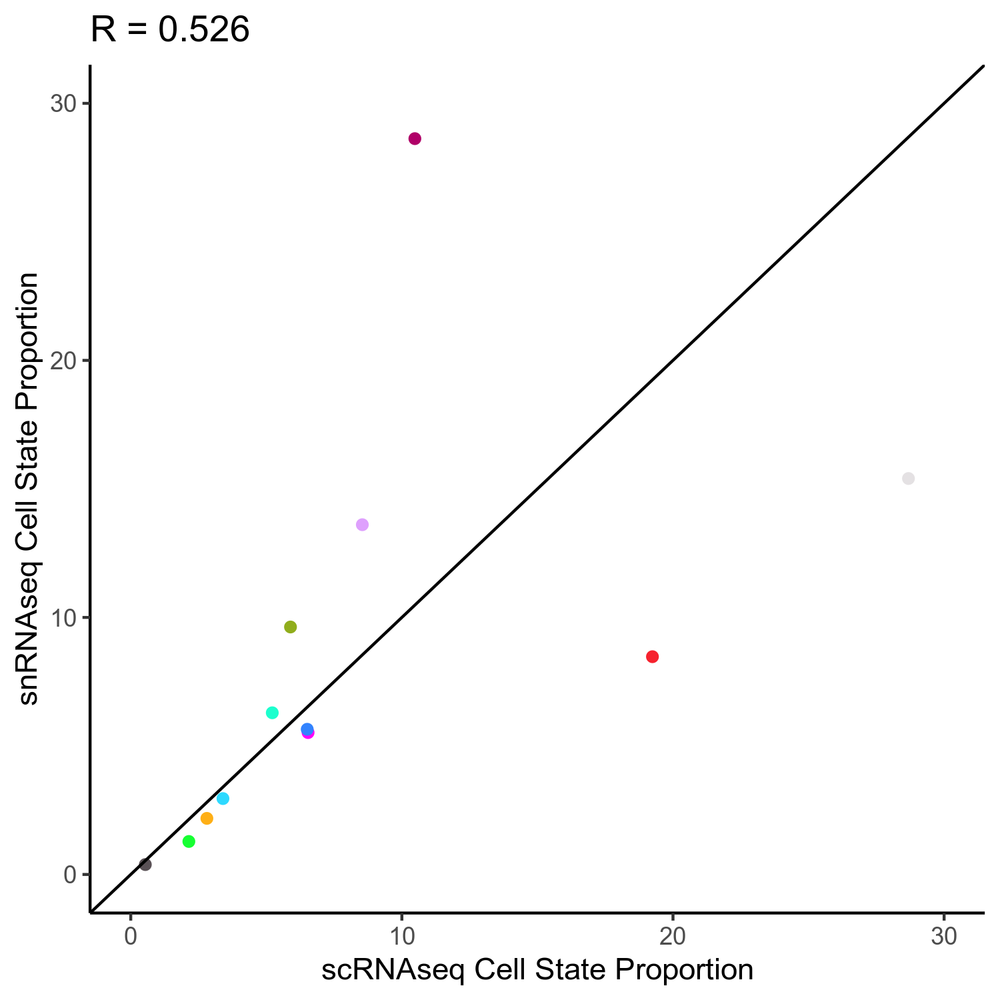

In [550]:
fig.size(5, 5)
ggplot(cell_states, aes(x = scRNAseq * 100 , y = snRNAseq * 100, color = factor(annotation, levels = annotations))) + 
    geom_point() + 
    geom_abline() + 
    scale_x_continuous(limits = c(0, 30)) + 
    scale_y_continuous(limits = c(0, 30)) + 
    theme_classic() +
    scale_color_manual(values = as.vector(polychrome(28))) +
    theme(legend.position = 'none') +
    labs(x = 'scRNAseq Cell State Proportion', y = 'snRNAseq Cell State Proportion', title = 'R = 0.526')

In [10]:
overlapping_meta <- qcd_meta %>%  mutate(individual = str_split(sample, '_')) %>% 
                                    rowwise() %>% 
                                    mutate(individual = unlist(individual)[3]) %>% 
                                    group_by(individual, dataset, annotation) %>% 
                                    tally() %>% pivot_wider(names_from = 'annotation', values_from = 'n') 
overlapping_meta[is.na(overlapping_meta)] <- 0
overlapping_meta <- overlapping_meta %>% pivot_longer(cols = c('1. MHC2+ IGHM- B', '10. JCHAIN+ IGA+ IGL+ Plasma', '11. IGHG+ IGL+ Plasma', 
                                                              '2. IGHD+ FCER2+ CD22+ B', '3. CD24+ CD80+ IGHM+ B', '4. BCL11A+ TCF4+ IGHE+ B',
                                                              '5. ITGAX+ TBX21+ B', '7. IGHG+ IGL- Plasma', '8. JCHAIN+ IGA+ IGL- Plasma', 
                                                              '9. IGHG+ IGL- Plasma', '6. CD38++ CD27++ IGHD- Plasma', '0. MME+ BCL6+ B'),
                                                           names_to = 'annotation') %>%
                                        pivot_wider(names_from = 'dataset', values_from = 'value') %>%
                                ungroup() %>% group_by(individual) %>% filter(sum(scRNAseq) > 15, sum(snRNAseq) > 15) %>%
                                    mutate(snRNAseq = (snRNAseq / sum(snRNAseq)), 
                                           scRNAseq = (scRNAseq / sum(scRNAseq))) 

In [11]:
overlapping_meta$individual %>% unique()

[1] "0137" "0880" "0882" "1138" "1150" "1157" "2715" "2725" "2804" "2807"
[11] "2824" "2877"

In [12]:
correlations <- vector()
clusters <- vector()
for (i in overlapping_meta %>% pull(annotation) %>% unique()) {
correlations <- c(correlations, cor(overlapping_meta %>% 
        filter(annotation == i) %>% pull(snRNAseq),
        overlapping_meta %>% 
        filter(annotation == i) %>% pull(scRNAseq))) 
clusters <- c(clusters, i)}

In [13]:
correlations <- data.frame(correlations, clusters = clusters)

In [14]:
cell_number <- vector() 
for (i in correlations$cluster) {
    cell_number <- c(cell_number, qcd_meta %>% group_by(annotation) %>% tally() %>% mutate(prop = n / sum(n)) %>% filter(annotation == i) %>% pull(prop))
}

In [15]:
correlations$prop <- cell_number

`geom_smooth()` using formula 'y ~ x'



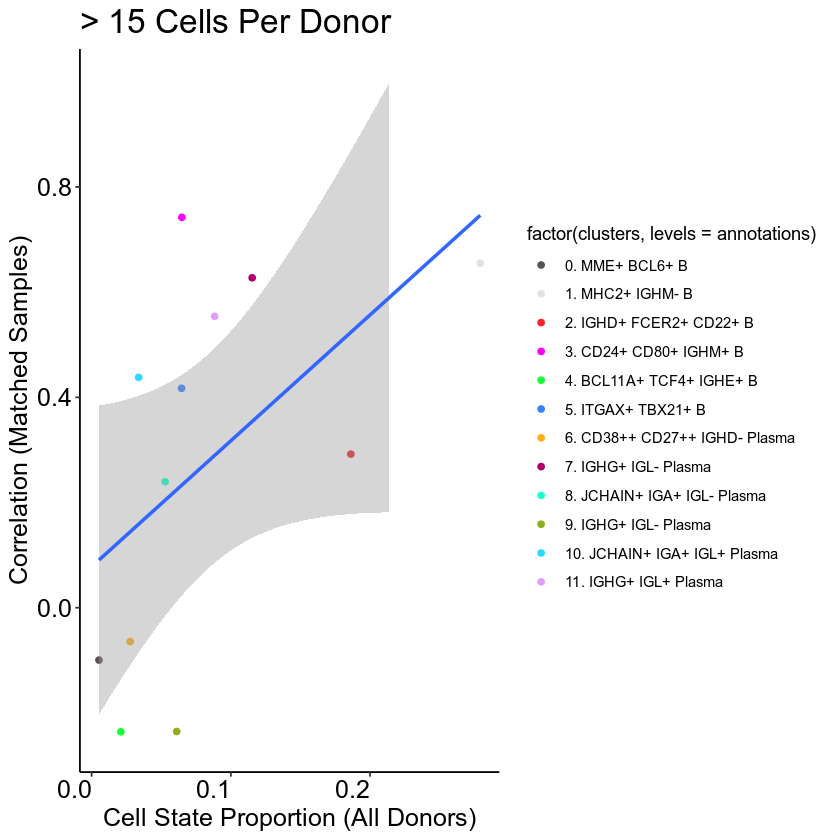

In [17]:
ggplot(correlations, aes(x = prop, y = correlations)) +
    geom_point(aes(color = factor(clusters, levels = annotations))) + 
    theme_classic() + 
    geom_smooth(method = 'lm') +
    scale_color_manual(values = as.vector(polychrome(28))) +
    labs(x = 'Cell State Proportion (All Donors)', y = 'Correlation (Matched Samples)',
         title = '> 15 Cells Per Donor') +
        theme(
        panel.grid = element_blank(),
        plot.title = element_text(color="black", size=20),
        axis.text = element_text(color = "black", size = 15,vjust = 0.5, hjust=1),
        axis.title=element_text(size=15)) +
    scale_y_continuous(limits = c(-0.25, 1))
    

In [656]:
correlations

correlations,clusters,prop
<dbl>,<chr>,<dbl>
0.65497939,1. MHC2+ IGHM- B,0.279147732
0.43799937,10. JCHAIN+ IGA+ IGL+ Plasma,0.033748044
0.55402538,11. IGHG+ IGL+ Plasma,0.088355807
0.29208813,2. IGHD+ FCER2+ CD22+ B,0.186172987
0.74230455,3. CD24+ CD80+ IGHM+ B,0.064814125
-0.23593586,4. BCL11A+ TCF4+ IGHE+ B,0.020934217
0.41721986,5. ITGAX+ TBX21+ B,0.064590628
0.62738833,7. IGHG+ IGL- Plasma,0.115324443
0.23958615,8. JCHAIN+ IGA+ IGL- Plasma,0.052819787


`geom_smooth()` using formula 'y ~ x'



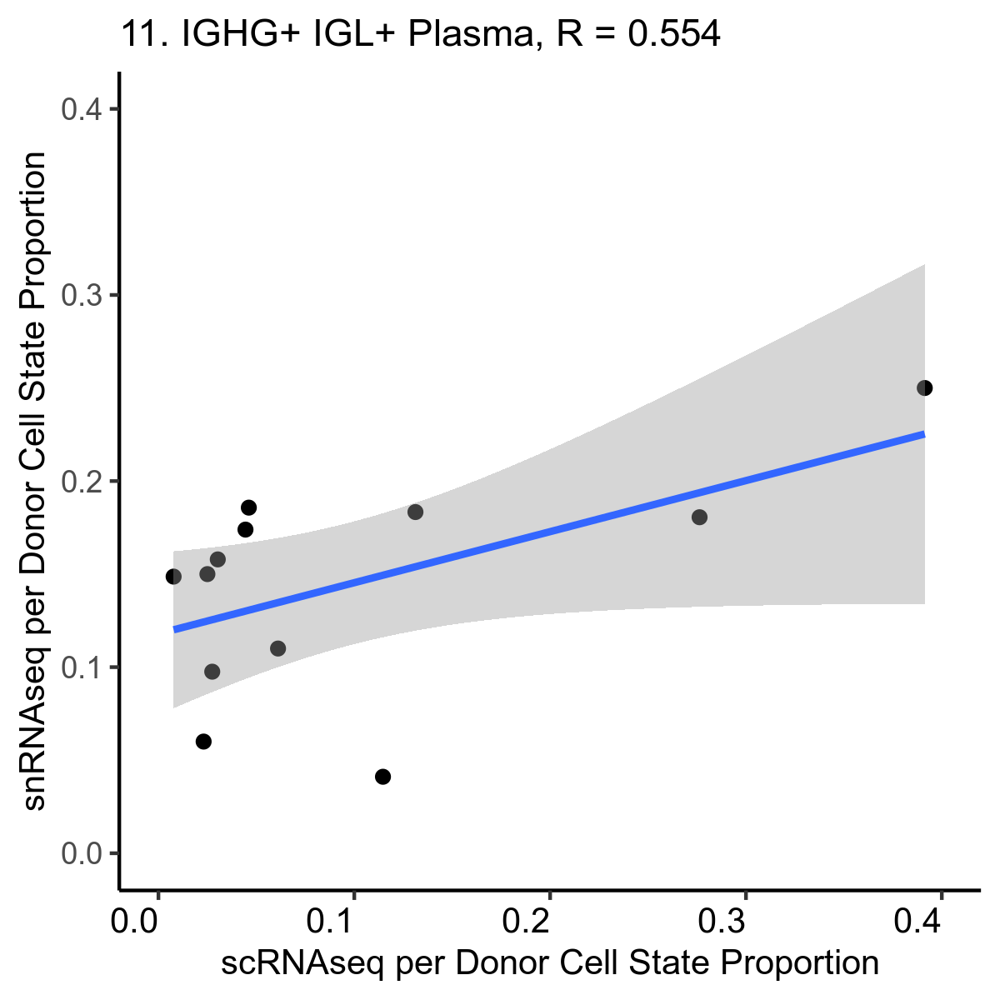

In [687]:
fig.size(4, 4)
ggplot(overlapping_meta %>% filter(annotation == '11. IGHG+ IGL+ Plasma'), aes(x = scRNAseq, y = snRNAseq)) + 
    geom_point() + 
    scale_color_manual(values = as.vector(polychrome(28))) +
    theme_classic() + 
    geom_smooth(method = 'lm') + 
    scale_x_continuous(limits = c(0, 0.4)) + 
    scale_y_continuous(limits = c(0, 0.4)) + 
    labs(x = 'scRNAseq per Donor Cell State Proportion', y = 'snRNAseq per Donor Cell State Proportion', title = '11. IGHG+ IGL+ Plasma, R = 0.554') + 
    theme(
        legend.position = "none",
        panel.grid = element_blank(),
        plot.title = element_text(color="black", size=11),
        axis.text.x = element_text(color = "black", size = 10, hjust=1),
        axis.title = element_text(size=10))

In [653]:
overlapping_meta %>% filter(annotation == '0. MME+ BCL6+ B')

individual,annotation,scRNAseq,snRNAseq
<chr>,<chr>,<dbl>,<dbl>
0137,0. MME+ BCL6+ B,0.000000000,0.00000000
0880,0. MME+ BCL6+ B,0.000000000,0.00000000
0882,0. MME+ BCL6+ B,0.000000000,0.00000000
1138,0. MME+ BCL6+ B,0.000000000,0.00000000
1150,0. MME+ BCL6+ B,0.000000000,0.00000000
1157,0. MME+ BCL6+ B,0.000000000,0.00000000
2715,0. MME+ BCL6+ B,0.000000000,0.00000000
2725,0. MME+ BCL6+ B,0.000000000,0.02439024
2804,0. MME+ BCL6+ B,0.062992126,0.00000000


In [586]:
overlapping_meta %>% filter(annotation == '0. MME+ BCL6+ B')

individual,annotation,scRNAseq,snRNAseq
<chr>,<chr>,<dbl>,<dbl>
2725,0. MME+ BCL6+ B,0.000000000,0.02439024
2804,0. MME+ BCL6+ B,0.062992126,0.00000000
2807,0. MME+ BCL6+ B,0.007633588,0.01000000
2824,0. MME+ BCL6+ B,0.005128205,0.01428571


## SYMPHONY

In [492]:
ref <- readRDS("/data/srlab1/public/srcollab/AMP_Phase_2/singlecell_result/Bcell_reference_2021-11-30.rds")
ref$save_uwot_path <- '/data/srlab1/public/srcollab/AMP_Phase_2/singlecell_result/Bcell_uwot_model_2021-05-03'

In [495]:
query = mapQuery(qcd_norm[, qcd_meta %>% filter(dataset == 'scRNAseq') %>% pull(cell)], # query gene expression (genes x cells)
                    qcd_meta %>% filter(dataset == 'scRNAseq'),        # query metadata (cells x attributes)
                    ref, # Symphony reference object
                    do_normalize = FALSE,  # perform log(CP10k) normalization on query
                    vars = c("sample", "processing.batch"),
                    do_umap = TRUE)        # project query cells into reference UMAP

Scaling and synchronizing query gene expression

Found 6552 out of 6647 reference variable genes in query dataset

Project query cells using reference gene loadings

Clustering query cells to reference centroids

Correcting query batch effects

UMAP

All done!



In [496]:
query = knnPredict(query, ref, ref$meta_data[ ,"cluster_name"], k = 5, confidence=TRUE)

In [497]:
plot_df <- query$meta_data
plot_df <- cbind(plot_df, data.frame(query$umap))
plot_df <- plot_df %>% filter(cell_type_pred_knn_prob > 0.6) 

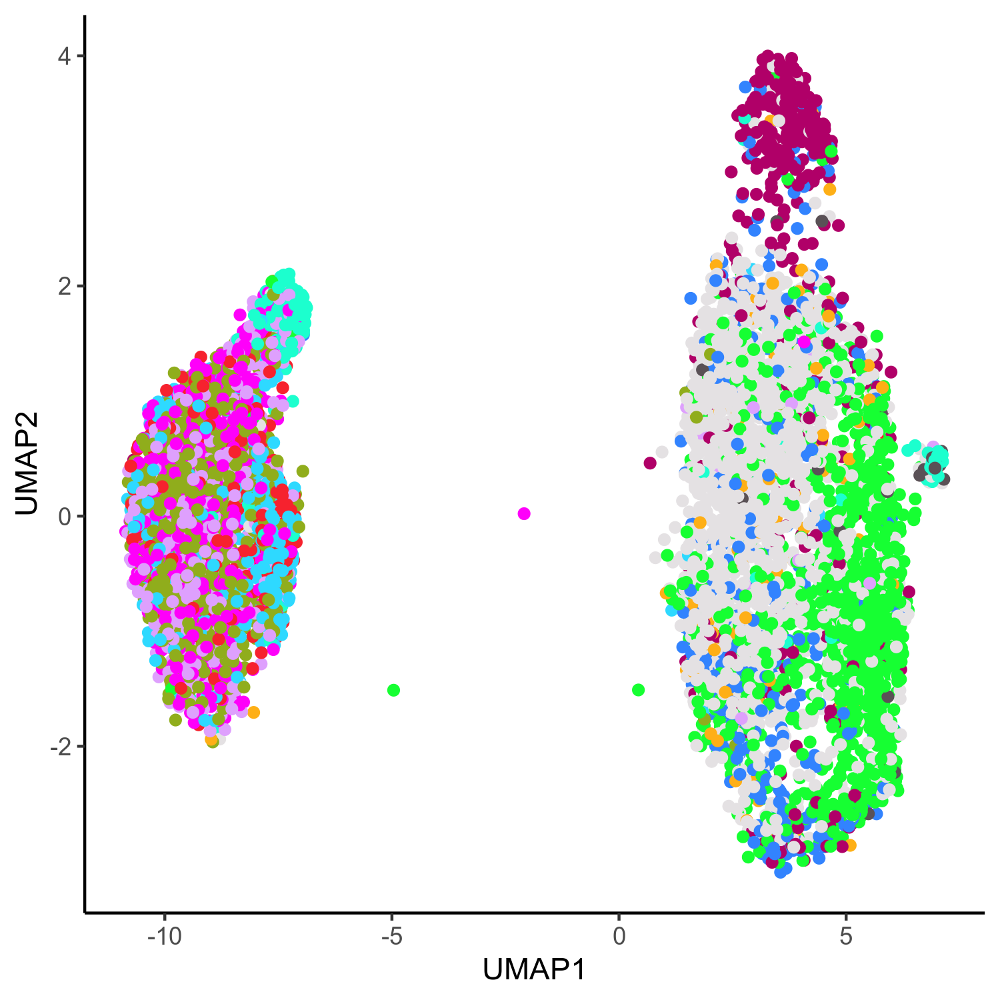

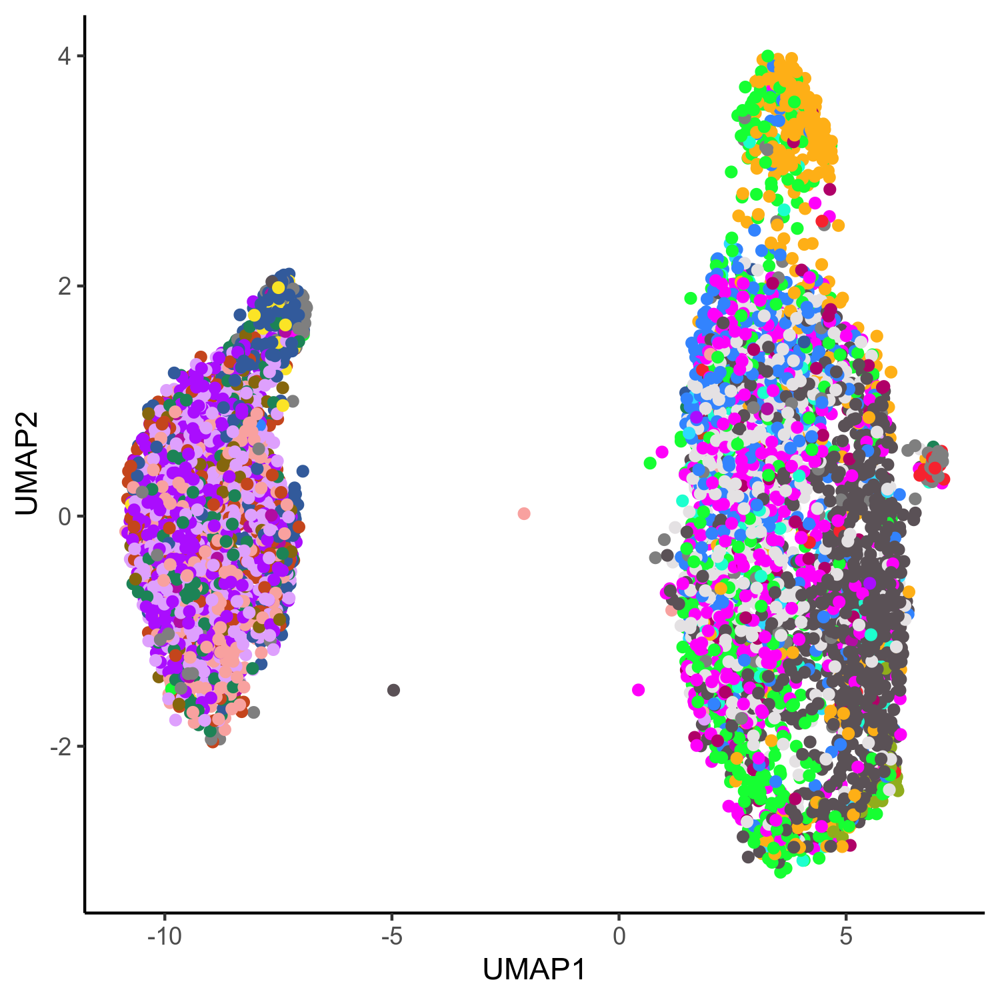

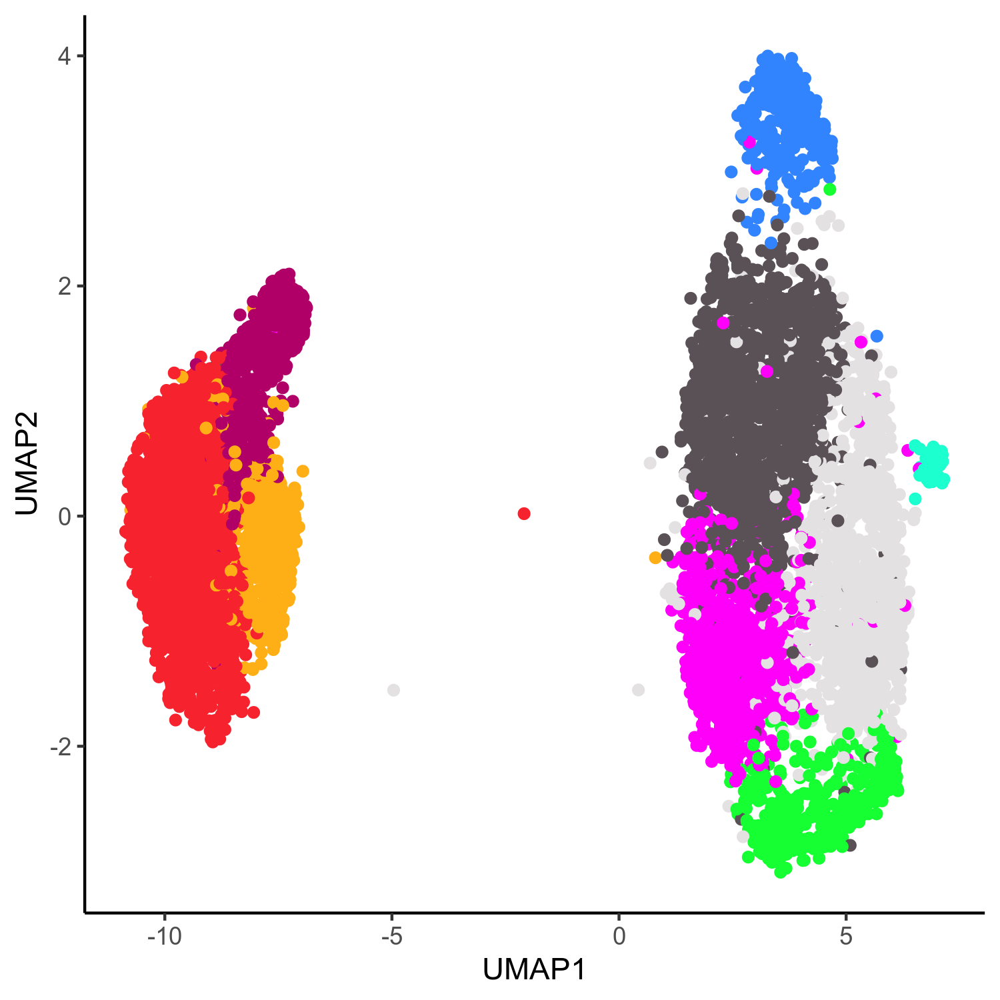

In [499]:
fig.size(5, 5)
ggplot(plot_df, aes(x = UMAP1, y = UMAP2, color = factor(annotation))) + 
    geom_point() + 
    theme_classic() +
    scale_color_manual(values = as.vector(polychrome(26)), drop = FALSE) +
    guides(colour = guide_legend(override.aes = list(size=3), text = element_text(size = 5), title="Cluster")) +
    theme(legend.position = 'none')
ggplot(plot_df, aes(x = UMAP1, y = UMAP2, color = factor(arnon_annot))) + 
    geom_point() + 
    theme_classic() +
    scale_color_manual(values = as.vector(polychrome(26)), drop = FALSE) +
    guides(colour = guide_legend(override.aes = list(size=3), text = element_text(size = 5), title="Cluster")) +
    theme(legend.position = 'none')

ggplot(plot_df, aes(x = UMAP1, y = UMAP2, color = factor(cell_type_pred_knn))) + 
    geom_point() + 
    theme_classic() +
    scale_color_manual(values = as.vector(polychrome(26)), drop = FALSE) +
    guides(colour = guide_legend(override.aes = list(size=3), text = element_text(size = 5), title="Cluster")) +
    theme(legend.position = 'none')

In [500]:
cell_type <- plot_df %>%  select(annotation, cell_type_pred_knn) %>% 
                                group_by(annotation, cell_type_pred_knn) %>% tally()

In [501]:
df <- ungroup(cell_type)
or <- vector()
statistic <- vector() 
for (i in 1:nrow(df)) {
        inAandB <- df %>% filter(annotation == df$annotation[i], 
                                           cell_type_pred_knn == df$cell_type_pred_knn[i]) %>% pull(n) %>% sum()
        inAnotB <- df %>% filter(annotation == df$annotation[i], 
                                           cell_type_pred_knn != df$cell_type_pred_knn[i]) %>% pull(n) %>% sum()
        inBnotA <- df %>% filter(annotation != df$annotation[i], 
                                           cell_type_pred_knn == df$cell_type_pred_knn[i]) %>% pull(n) %>% sum()
        notBnotA <- df %>% filter(annotation != df$annotation[i], 
                                           cell_type_pred_knn != df$cell_type_pred_knn[i]) %>% pull(n) %>% sum()
        contin <- data.frame(c(inAandB, inAnotB), c(inBnotA, notBnotA))
        or <- (contin[1, 1] * contin[2, 2]) / (contin[1, 2] * contin[2, 1])
        statistic <- c(statistic, sign(log(or)) * sqrt(chisq.test(contin, simulate.p.value = TRUE)$statistic))        
}

df$stat <- statistic

or_plot <- df %>% select(-n) %>% pivot_wider(names_from = 'annotation', values_from = 'stat') 
cols <- colnames(or_plot)
or_plot[is.na(or_plot)] <- 0 
or_plot <- or_plot %>% data.frame()
rownames(or_plot) <- or_plot$cell_type_pred_knn
colnames(or_plot) <- cols
or_plot <- or_plot[, -1]

In [502]:
library(dendsort)
sort_hclust <- function(...) as.hclust(dendsort(as.dendrogram(...)))

mat_cluster_cols <- hclust(dist(t(or_plot)))

mat_cluster_cols <- sort_hclust(mat_cluster_cols)

In [510]:
or_plot %>% colnames()

[1] "0. MME+ BCL6+ B"               "1. MHC2+ IGHM- B"             
 [3] "10. JCHAIN+ IGA+ IGL+ Plasma"  "11. IGHG+ IGL+ Plasma"        
 [5] "2. IGHD+ FCER2+ CD22+ B"       "3. CD24+ CD80+ IGHM+ B"       
 [7] "4. BCL11A+ TCF4+ IGHE+ B"      "5. ITGAX+ TBX21+ B"           
 [9] "6. CD38++ CD27++ IGHD- Plasma" "7. IGHG+ IGL- Plasma"         
[11] "8. JCHAIN+ IGA+ IGL- Plasma"   "9. IGHG+ IGL- Plasma"

In [517]:
row.order <- c('B-0: CD24+CD27+CD11b+ switched memory', 'B-1: CD24++CD27+IgM+ unswitched memory', 'B-2: IgM+IgD+TCL1A+ naive', 
               'B-3: IgM+IgD+CD1c+ MZ-like', 'B-4: AICDA+BCL6+ GC-like', 'B-5: CD11c+LAMP1+ ABC', 'B-6: IgM+ plasma', 
               'B-7: HLA-DR+IgG+ plasmablast', 'B-8: IgG1+IgG3+ plasma')
col.order <- c('1. MHC2+ IGHM- B', '2. IGHD+ FCER2+ CD22+ B', '3. CD24+ CD80+ IGHM+ B', '0. MME+ BCL6+ B', '5. ITGAX+ TBX21+ B', 
              '10. JCHAIN+ IGA+ IGL+ Plasma',  '8. JCHAIN+ IGA+ IGL- Plasma', '6. CD38++ CD27++ IGHD- Plasma', 
               '11. IGHG+ IGL+ Plasma',  '9. IGHG+ IGL- Plasma', '7. IGHG+ IGL- Plasma', '4. BCL11A+ TCF4+ IGHE+ B')

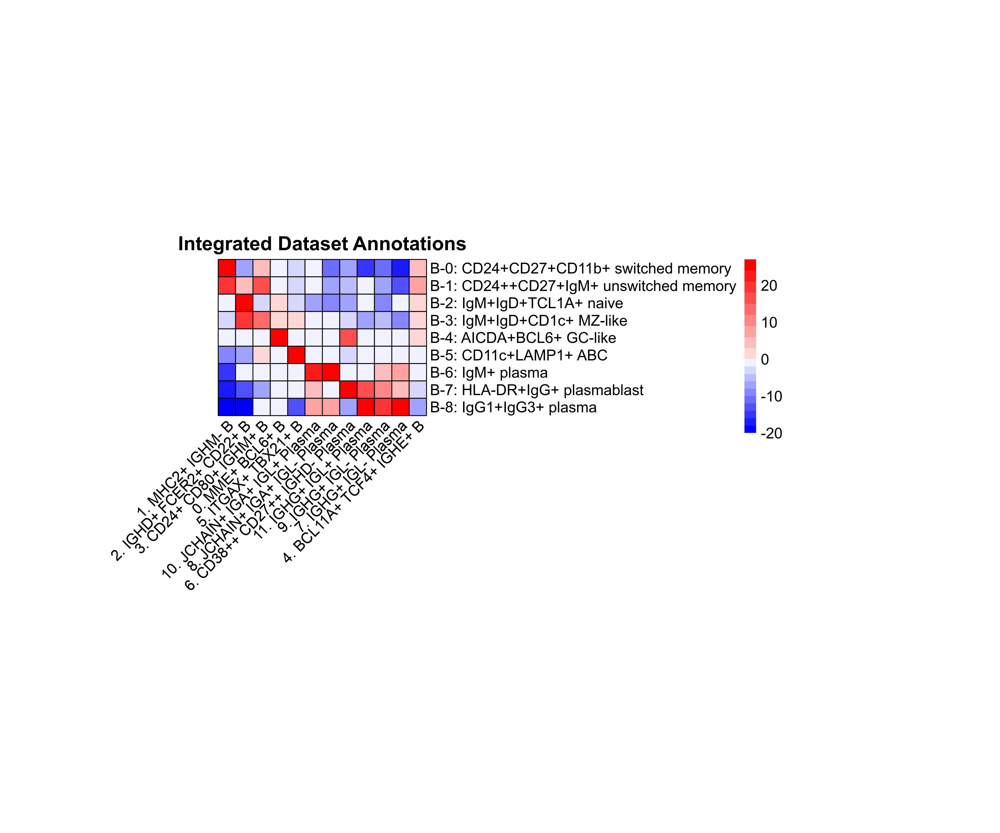

In [524]:
fig.size(10, 12)
pheatmap::pheatmap(or_plot[row.order, col.order], cellwidth = 15, cellheight = 15, 
                   color=colorRampPalette(c("blue", "white", "red"))(20), 
                   breaks = c(seq(-20, 0, 2), seq(0.001, 30, 3)), border_color = 'black', scale = 'none',
                   cluster_cols = FALSE, cluster_rows = FALSE, main = 'Integrated Dataset Annotations', fontsize = 13, angle_col = 45)

## CNA

In [1]:
qcd_meta <- readRDS('/data/srlab/ssg34/SLE_kidney_v2/data/qcd/BP_clusterQCd_cellstate_meta_annotations_09232022.rds')

In [4]:
library(readxl)
library(stringr)
clinical <- read_xlsx("/data/srlab2/jmears/jupyter/SLE_Phase2_Kidney_Analysis/cell-seq-output/FinalClinical/final_clinical_data_8-10-21_ResponderNA.xlsx")
clinical <- clinical %>% 
                        mutate(individual = str_split(Sample, '-')) %>% 
                        rowwise() %>% 
                        mutate(individual = unlist(individual)[2])

In [5]:
sn_cna_meta <- qcd_meta %>% 
                        filter(dataset == 'snRNAseq') %>% 
                        mutate(individual = str_split(sample, '_')) %>% 
                        rowwise() %>% 
                        mutate(individual = unlist(individual)[3]) %>% left_join(clinical %>% 
                                                                                 select(-c('sample', 'Sample', 'Site', 'Type', 'processing.batch')), 
                                                                                 by = 'individual')
sc_cna_meta <- qcd_meta %>% 
                        filter(dataset == 'scRNAseq') %>% 
                        mutate(individual = str_split(sample, '_')) %>% 
                        rowwise() %>% 
                        mutate(individual = unlist(individual)[3]) %>% left_join(clinical %>% 
                                                                                 select(-c('sample', 'Sample', 'Site', 'Type', 'processing.batch')), 
                                                                                 by = 'individual')

### CASE/CONTROL

In [6]:
meta <- sc_cna_meta %>% select(-c(colnames(sn_cna_meta[grep('hPC', colnames(sn_cna_meta))]), 
                          colnames(sn_cna_meta[grep('UMAP', colnames(sn_cna_meta))])))
harmony <- sc_cna_meta %>% select(colnames(sn_cna_meta)[grep('hPC', colnames(sn_cna_meta))])

umap <- sc_cna_meta %>% select(c(hUMAP1, hUMAP2))


ind <- meta$Type == "NA"
sum(ind)
meta <- meta[!ind,]
umap <- umap[!ind,]
harmony <- harmony[!ind,]


meta$Type_numeric <- as.numeric(as.factor(meta$Type))
#meta$Site <- as.numeric(as.factor(meta$Site))
meta$Responder_Status <- as.numeric(as.factor(meta$Responder.Status))
meta$processing_batch <- as.numeric(as.factor(meta$processing.batch))
meta$Sex <- as.numeric(as.factor(meta$Sex))
#meta$Race <- as.numeric(as.factor(meta$Race))
meta$Ethnicity <- as.numeric(as.factor(meta$Ethnicity))
meta$ISN <- as.numeric(as.factor(meta$ISN))
meta$Chronicity <- as.numeric(as.factor(meta$Chronicity))
meta$Activity <- as.numeric(factor(meta$Activity, levels = c(0,1,2,3,4,5,6,7,8,9,10,11,13,14,15,16,18)))

write.csv(meta, '/data/srlab/ssg34/SLE_kidney_v2/data/cna/b_plasma/sc_b_plasma_casecontrol_meta.csv', row.names = FALSE, quote = FALSE)
write.csv(harmony, '/data/srlab/ssg34/SLE_kidney_v2/data/cna/b_plasma/sc_b_plasma_casecontrol_harmony.csv', row.names = FALSE, quote = FALSE)
write.csv(umap, '/data/srlab/ssg34/SLE_kidney_v2/data/cna/b_plasma/sc_b_plasma_casecontrol_umap.csv', row.names = FALSE, quote = FALSE)

[1] 0

### SN CHRONICITY

In [91]:
meta <- sn_cna_meta %>% select(-c(colnames(sn_cna_meta[grep('hPC', colnames(sn_cna_meta))]), 
                          colnames(sn_cna_meta[grep('UMAP', colnames(sn_cna_meta))])))
harmony <- sn_cna_meta %>% select(colnames(sn_cna_meta)[grep('hPC', colnames(sn_cna_meta))])

umap <- sn_cna_meta %>% select(c(hUMAP1, hUMAP2))


ind <- meta$Chronicity == "NA"
sum(ind)
meta <- meta[!ind,]
umap <- umap[!ind,]
harmony <- harmony[!ind,]


meta$Type <- as.numeric(as.factor(meta$Type))
#meta$Site <- as.numeric(as.factor(meta$Site))
meta$Responder_Status <- as.numeric(as.factor(meta$Responder.Status))
meta$processing_batch <- as.numeric(as.factor(meta$processing.batch))
meta$Sex <- as.numeric(as.factor(meta$Sex))
#meta$Race <- as.numeric(as.factor(meta$Race))
meta$Ethnicity <- as.numeric(as.factor(meta$Ethnicity))
meta$ISN <- as.numeric(as.factor(meta$ISN))
meta$Chronicity <- as.numeric(as.factor(meta$Chronicity))
meta$Activity <- as.numeric(factor(meta$Activity, levels = c(0,1,2,3,4,5,6,7,8,9,10,11,13,14,15,16,18)))

write.csv(meta, '/data/srlab/ssg34/SLE_kidney_v2/data/cna/b_plasma/sn_b_plasma_chronicity_meta.csv', row.names = FALSE, quote = FALSE)
write.csv(harmony, '/data/srlab/ssg34/SLE_kidney_v2/data/cna/b_plasma/sn_b_plasma_chronicity_harmony.csv', row.names = FALSE, quote = FALSE)
write.csv(umap, '/data/srlab/ssg34/SLE_kidney_v2/data/cna/b_plasma/sn_b_plasma_chronicity_umap.csv', row.names = FALSE, quote = FALSE)

[1] 134

In [35]:
chronicity_metadata <- meta %>% select(individual, Chronicity, annotation)

#### B 

In [92]:
b_sn_cna_meta <- sn_cna_meta %>% filter(!annotation %in% c('6. CD38++ CD27++ IGHD- Plasma ', '7. IGHG+ IGL- Plasma ',
                          '8. JCHAIN+ IGA+ IGL- Plasma', '9. IGHG+ IGL- Plasma',
                          '10. JCHAIN+ IGA+ IGL+ Plasma', '11. IGHG+ IGL+ Plasma'))
meta <- b_sn_cna_meta %>% select(-c(colnames(sn_cna_meta[grep('hPC', colnames(sn_cna_meta))]), 
                          colnames(sn_cna_meta[grep('UMAP', colnames(sn_cna_meta))])))
harmony <- b_sn_cna_meta %>% select(colnames(sn_cna_meta)[grep('hPC', colnames(sn_cna_meta))])

umap <- b_sn_cna_meta %>% select(c(hUMAP1, hUMAP2))


ind <- meta$Chronicity == "NA"
sum(ind)
meta <- meta[!ind,]
umap <- umap[!ind,]
harmony <- harmony[!ind,]


meta$Type <- as.numeric(as.factor(meta$Type))
#meta$Site <- as.numeric(as.factor(meta$Site))
meta$Responder_Status <- as.numeric(as.factor(meta$Responder.Status))
meta$processing_batch <- as.numeric(as.factor(meta$processing.batch))
meta$Sex <- as.numeric(as.factor(meta$Sex))
#meta$Race <- as.numeric(as.factor(meta$Race))
meta$Ethnicity <- as.numeric(as.factor(meta$Ethnicity))
meta$ISN <- as.numeric(as.factor(meta$ISN))
meta$Chronicity <- as.numeric(as.factor(meta$Chronicity))
meta$Activity <- as.numeric(factor(meta$Activity, levels = c(0,1,2,3,4,5,6,7,8,9,10,11,13,14,15,16,18)))

write.csv(meta, '/data/srlab/ssg34/SLE_kidney_v2/data/cna/b_plasma/sn_b_chronicity_meta.csv', row.names = FALSE, quote = FALSE)
write.csv(harmony, '/data/srlab/ssg34/SLE_kidney_v2/data/cna/b_plasma/sn_b_chronicity_harmony.csv', row.names = FALSE, quote = FALSE)
write.csv(umap, '/data/srlab/ssg34/SLE_kidney_v2/data/cna/b_plasma/sn_b_chronicity_umap.csv', row.names = FALSE, quote = FALSE)

[1] 81

In [93]:
chronicity_metadata <- meta %>% select(individual, Chronicity)

In [94]:
write.csv(chronicity_metadata, '/data/srlab/ssg34/SLE_kidney_v2/data/cna/b_plasma/sn_b_chronicity_meta.csv', row.names = FALSE, quote = FALSE)

#### PLASMA

In [95]:
plasma_sn_cna_meta <- sn_cna_meta %>% filter(annotation %in% c('6. CD38++ CD27++ IGHD- Plasma ', '7. IGHG+ IGL- Plasma ',
                                                               '8. JCHAIN+ IGA+ IGL- Plasma', '9. IGHG+ IGL- Plasma',
                                                               '10. JCHAIN+ IGA+ IGL+ Plasma', '11. IGHG+ IGL+ Plasma'))
meta <- plasma_sn_cna_meta %>% select(-c(colnames(sn_cna_meta[grep('hPC', colnames(sn_cna_meta))]), 
                          colnames(sn_cna_meta[grep('UMAP', colnames(sn_cna_meta))])))
harmony <- plasma_sn_cna_meta %>% select(colnames(sn_cna_meta)[grep('hPC', colnames(sn_cna_meta))])

umap <- plasma_sn_cna_meta %>% select(c(hUMAP1, hUMAP2))


ind <- meta$Chronicity == "NA"
sum(ind)
meta <- meta[!ind,]
umap <- umap[!ind,]
harmony <- harmony[!ind,]


meta$Type <- as.numeric(as.factor(meta$Type))
#meta$Site <- as.numeric(as.factor(meta$Site))
meta$Responder_Status <- as.numeric(as.factor(meta$Responder.Status))
meta$processing_batch <- as.numeric(as.factor(meta$processing.batch))
meta$Sex <- as.numeric(as.factor(meta$Sex))
#meta$Race <- as.numeric(as.factor(meta$Race))
meta$Ethnicity <- as.numeric(as.factor(meta$Ethnicity))
meta$ISN <- as.numeric(as.factor(meta$ISN))
meta$Chronicity <- as.numeric(as.factor(meta$Chronicity))
meta$Activity <- as.numeric(factor(meta$Activity, levels = c(0,1,2,3,4,5,6,7,8,9,10,11,13,14,15,16,18)))

write.csv(meta, '/data/srlab/ssg34/SLE_kidney_v2/data/cna/b_plasma/sn_plasma_chronicity_meta.csv', row.names = FALSE, quote = FALSE)
write.csv(harmony, '/data/srlab/ssg34/SLE_kidney_v2/data/cna/b_plasma/sn_plasma_chronicity_harmony.csv', row.names = FALSE, quote = FALSE)
write.csv(umap, '/data/srlab/ssg34/SLE_kidney_v2/data/cna/b_plasma/sn_plasma_chronicity_umap.csv', row.names = FALSE, quote = FALSE)

[1] 53

In [96]:
chronicity_metadata <- meta %>% select(individual, Chronicity)

In [97]:
write.csv(chronicity_metadata, '/data/srlab/ssg34/SLE_kidney_v2/data/cna/b_plasma/sn_plasma_chronicity_meta.csv', row.names = FALSE, quote = FALSE)

### SC CHRONICITY

#### B

In [98]:
b_sc_cna_meta <- sc_cna_meta %>% filter(!annotation %in% c('6. CD38++ CD27++ IGHD- Plasma ', '7. IGHG+ IGL- Plasma ',
                          '8. JCHAIN+ IGA+ IGL- Plasma', '9. IGHG+ IGL- Plasma',
                          '10. JCHAIN+ IGA+ IGL+ Plasma', '11. IGHG+ IGL+ Plasma'))
meta <- b_sc_cna_meta %>% select(-c(colnames(sn_cna_meta[grep('hPC', colnames(sn_cna_meta))]), 
                          colnames(sn_cna_meta[grep('UMAP', colnames(sn_cna_meta))])))
harmony <- b_sc_cna_meta %>% select(colnames(sn_cna_meta)[grep('hPC', colnames(sn_cna_meta))])

umap <- b_sc_cna_meta %>% select(c(hUMAP1, hUMAP2))


ind <- meta$Chronicity == "NA"
sum(ind)
meta <- meta[!ind,]
umap <- umap[!ind,]
harmony <- harmony[!ind,]


meta$Type <- as.numeric(as.factor(meta$Type))
#meta$Site <- as.numeric(as.factor(meta$Site))
meta$Responder_Status <- as.numeric(as.factor(meta$Responder.Status))
meta$processing_batch <- as.numeric(as.factor(meta$processing.batch))
meta$Sex <- as.numeric(as.factor(meta$Sex))
#meta$Race <- as.numeric(as.factor(meta$Race))
meta$Ethnicity <- as.numeric(as.factor(meta$Ethnicity))
meta$ISN <- as.numeric(as.factor(meta$ISN))
meta$Chronicity <- as.numeric(as.factor(meta$Chronicity))
meta$Activity <- as.numeric(factor(meta$Activity, levels = c(0,1,2,3,4,5,6,7,8,9,10,11,13,14,15,16,18)))

write.csv(meta, '/data/srlab/ssg34/SLE_kidney_v2/data/cna/b_plasma/sc_b_chronicity_meta.csv', row.names = FALSE, quote = FALSE)
write.csv(harmony, '/data/srlab/ssg34/SLE_kidney_v2/data/cna/b_plasma/sc_b_chronicity_harmony.csv', row.names = FALSE, quote = FALSE)
write.csv(umap, '/data/srlab/ssg34/SLE_kidney_v2/data/cna/b_plasma/sc_b_chronicity_umap.csv', row.names = FALSE, quote = FALSE)

[1] 1467

In [99]:
chronicity_metadata <- meta %>% select(individual, Chronicity, annotation)

In [100]:
write.csv(chronicity_metadata, '/data/srlab/ssg34/SLE_kidney_v2/data/cna/b_plasma/sc_b_chronicity_meta.csv', row.names = FALSE, quote = FALSE)

#### PLASMA

In [105]:
plasma_sc_cna_meta <- sc_cna_meta %>% filter(annotation %in% c('6. CD38++ CD27++ IGHD- Plasma ', '7. IGHG+ IGL- Plasma ',
                                                               '8. JCHAIN+ IGA+ IGL- Plasma', '9. IGHG+ IGL- Plasma',
                                                               '10. JCHAIN+ IGA+ IGL+ Plasma', '11. IGHG+ IGL+ Plasma'))
meta <- plasma_sc_cna_meta %>% select(-c(colnames(sn_cna_meta[grep('hPC', colnames(sn_cna_meta))]), 
                          colnames(sn_cna_meta[grep('UMAP', colnames(sn_cna_meta))])))
harmony <- plasma_sc_cna_meta %>% select(colnames(sn_cna_meta)[grep('hPC', colnames(sn_cna_meta))])

umap <- plasma_sc_cna_meta %>% select(c(hUMAP1, hUMAP2))


ind <- meta$Activity == "NA"
sum(ind)
meta <- meta[!ind,]
umap <- umap[!ind,]
harmony <- harmony[!ind,]


meta$Type <- as.numeric(as.factor(meta$Type))
#meta$Site <- as.numeric(as.factor(meta$Site))
meta$Responder_Status <- as.numeric(as.factor(meta$Responder.Status))
meta$processing_batch <- as.numeric(as.factor(meta$processing.batch))
meta$Sex <- as.numeric(as.factor(meta$Sex))
#meta$Race <- as.numeric(as.factor(meta$Race))
meta$Ethnicity <- as.numeric(as.factor(meta$Ethnicity))
meta$ISN <- as.numeric(as.factor(meta$ISN))
meta$Chronicity <- as.numeric(as.factor(meta$Chronicity))
meta$Activity <- as.numeric(factor(meta$Activity, levels = c(0,1,2,3,4,5,6,7,8,9,10,11,13,14,15,16,18)))

write.csv(meta, '/data/srlab/ssg34/SLE_kidney_v2/data/cna/b_plasma/sc_plasma_chronicity_meta.csv', row.names = FALSE, quote = FALSE)
write.csv(harmony, '/data/srlab/ssg34/SLE_kidney_v2/data/cna/b_plasma/sc_plasma_chronicity_harmony.csv', row.names = FALSE, quote = FALSE)
write.csv(umap, '/data/srlab/ssg34/SLE_kidney_v2/data/cna/b_plasma/sc_plasma_chronicity_umap.csv', row.names = FALSE, quote = FALSE)

[1] 413

In [106]:
chronicity_metadata <- meta %>% select(individual, Chronicity, annotation)

In [107]:
write.csv(chronicity_metadata, '/data/srlab/ssg34/SLE_kidney_v2/data/cna/b_plasma/sc_plasma_chronicity_meta.csv', row.names = FALSE, quote = FALSE)

### ACTIVITY

In [12]:


meta <- sn_cna_meta %>% select(-c(colnames(sn_cna_meta[grep('hPC', colnames(sn_cna_meta))]), 
                          colnames(sn_cna_meta[grep('UMAP', colnames(sn_cna_meta))])))
harmony <- sn_cna_meta %>% select(colnames(sn_cna_meta)[grep('hPC', colnames(sn_cna_meta))])

umap <- sn_cna_meta %>% select(c(hUMAP1, hUMAP2))


ind <- meta$Activity == "NA"
sum(ind)
meta <- meta[!ind,]
umap <- umap[!ind,]
harmony <- harmony[!ind,]


meta$Type <- as.numeric(as.factor(meta$Type))
#meta$Site <- as.numeric(as.factor(meta$Site))
meta$Responder_Status <- as.numeric(as.factor(meta$Responder.Status))
meta$processing_batch <- as.numeric(as.factor(meta$processing.batch))
meta$Sex <- as.numeric(as.factor(meta$Sex))
#meta$Race <- as.numeric(as.factor(meta$Race))
meta$Ethnicity <- as.numeric(as.factor(meta$Ethnicity))
meta$ISN <- as.numeric(as.factor(meta$ISN))
meta$Chronicity <- as.numeric(as.factor(meta$Chronicity))
meta$Activity <- as.numeric(factor(meta$Activity, levels = c(0,1,2,3,4,5,6,7,8,9,10,11,13,14,15,16,18)))

write.csv(meta, '/data/srlab/ssg34/SLE_kidney_v2/data/cna/b_plasma/sn_b_plasma_activity_meta.csv', row.names = FALSE, quote = FALSE)
write.csv(harmony, '/data/srlab/ssg34/SLE_kidney_v2/data/cna/b_plasma/sn_b_plasma_activity_harmony.csv', row.names = FALSE, quote = FALSE)
write.csv(umap, '/data/srlab/ssg34/SLE_kidney_v2/data/cna/b_plasma/sn_b_plasma_activity_umap.csv', row.names = FALSE, quote = FALSE)

[1] 128

## RECLUSTER WITHOUT IGS

In [2]:
qcd_meta <- readRDS('/data/srlab/ssg34/SLE_kidney_v2/data/qcd/BP_clusterQCd_meta_09232022.rds')
qcd_norm <- readRDS('/data/srlab/ssg34/SLE_kidney_v2/data/qcd/BP_clusterQCd_norm_09232022.rds')

In [3]:
genes_exclude <- c(grep("^MT-|^RPL|^RPS|MALAT1|MIR-", 
                        row.names(norm), value = TRUE), 
                   Seurat::cc.genes$s.genes, 
                   Seurat::cc.genes$g2m.genes, 
                   grep("^IG", row.names(qcd_norm), value = TRUE)) 

In [12]:
## Filtering for expressed genes
threshold_genes <- qcd_norm[rownames(qcd_norm[rowMeans(qcd_norm) >= .01, ]), ]

samples_25 <- qcd_meta %>% group_by(sample) %>% tally() %>% filter(n > 25) %>% pull(sample)

threshold_samples <- threshold_genes[, qcd_meta %>% filter(sample %in% samples_25) %>% pull(cell)]

## Variable gene selection — very inefficiently written, but essentially using VST to select most variable genes from samples with > 100 cells
var_genes_raw <- vargenes_vst(object = threshold_samples, 
                              groups = qcd_meta %>% filter(sample %in% samples_25) %>% pull(sample), 
                              topn = 500)

In [13]:
#Separate variable genes by Dataset
var_genes_raw_nuc <- vector()
var_genes_raw_sc <- vector()

for (i in 1:length(var_genes_raw)) {
    if (grepl('nuc', names(var_genes_raw)[i])) {
        var_genes_raw_nuc <- c(var_genes_raw_nuc, var_genes_raw[[i]])
    }
    else {
        var_genes_raw_sc <- c(var_genes_raw_sc, var_genes_raw[[i]])   
    }

}

var_genes_raw_nuc <- var_genes_raw_nuc %>% unique()
var_genes_raw_sc <- var_genes_raw_sc %>% unique() 
#Find intersection
var_genes <- intersect(var_genes_raw_nuc, var_genes_raw_sc)

In [14]:
## Scale Data
bp_scaled <- qcd_norm[var_genes[!var_genes %in% genes_exclude], ] %>% scaleData()

In [16]:
table(qcd_meta$dataset)
y <- factor(qcd_meta$dataset)
weights <- as.numeric((1 / prop.table(table(y)))[y]) / nlevels(y)
length(weights)
table(weights)


scRNAseq snRNAseq 
   12644      779 

[1] 13423

weights
0.530805124960456  8.61553273427471 
            12644               779 

In [17]:
bp_scaled <- as(bp_scaled, 'dgCMatrix')

In [18]:
weighted_pca_res <- weighted_pca(bp_scaled, weights, rownames(bp_scaled), 20, TRUE, 10)$embeddings

use_weights



[1] TRUE


use_weights

use_weights



[1] TRUE


use_weights

Harmony 1/20

Harmony 2/20

Harmony 3/20

Harmony 4/20

Harmony 5/20

Harmony 6/20

Harmony 7/20

Harmony 8/20

Harmony 9/20

Harmony 10/20

Harmony 11/20

Harmony 12/20

Harmony 13/20

Harmony 14/20

Harmony 15/20

Harmony 16/20

Harmony 17/20

Harmony 18/20

Harmony 19/20

Harmony 20/20



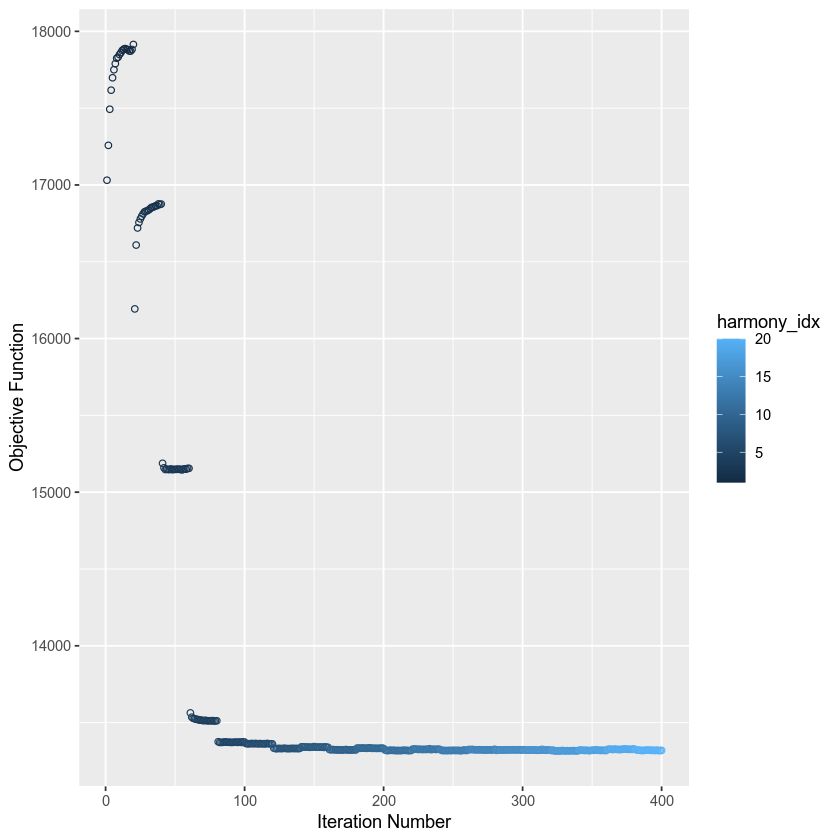

In [19]:
harmony_weighted2 <- HarmonyMatrix(weighted_pca_res, qcd_meta, 
                            c('sample', 'processing.batch', 'Site', 'dataset'), 
                            c(1.5, 1, 1, 1.5),
                            do_pca = FALSE, 
                            epsilon.harmony = -Inf, 
                            epsilon.cluster = -Inf,
                            weights = weights, 
                            max.iter.cluster = 20,
                            max.iter.harmony = 20, 
                            plot_convergence = TRUE, 
                            verbose = TRUE)

In [20]:
harmony_umap2 <- uwot::umap(harmony_weighted2, n_neighbors = 30L, metric = "euclidean", min_dist = .1)

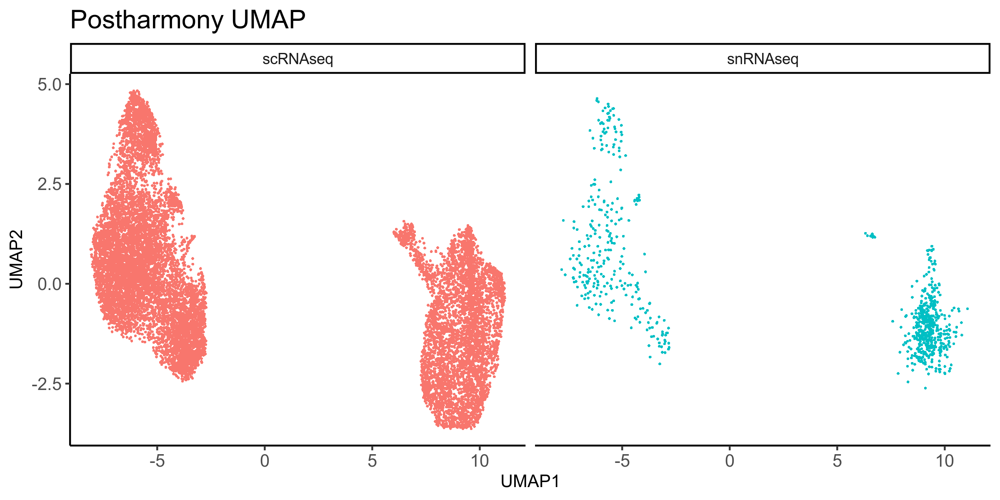

In [21]:
df <- harmony_umap2 %>% data.frame() %>% mutate(dataset = qcd_meta$dataset)
fig.size(4, 8)
ggplot(df, aes(x = X1, y = X2, color = dataset)) +
    geom_point(size = 0.75, stroke = 0.00001) + 
    theme_classic() + 
    theme(axis.text = element_text(size = 10), axis.title = element_text(size = 10), 
          plot.title = element_text(size = 15),
          legend.position = "none") +
    labs(title = 'Postharmony UMAP', x = 'UMAP1', y = 'UMAP2') + 
    facet_wrap(~dataset) 

In [22]:
snn_ref <- BuildSNNSeurat(harmony_weighted2[,1:20], nn.eps = 0)


resolution_list <- c(0.2, 0.4, 0.6, 0.8, 1.0, 1.2, 1.4, 1.6, 1.8, 2.0)
ids_ref <- Reduce(cbind, mclapply(resolution_list, function(res_use) {
    Seurat:::RunModularityClustering(SNN = snn_ref, modularity = 1,
        resolution = res_use, algorithm = 1, n.start = 20,
        n.iter = 20, random.seed = 100, print.output = FALSE,
        temp.file.location = NULL, edge.file.name = NULL)
}, mc.preschedule = FALSE, mc.cores = min(20, length(resolution_list)))) 

In [24]:
harmony_umap2 <- cbind(harmony_weighted2[, 1:20], harmony_umap2, ids_ref)
colnames(harmony_umap2) <- c(paste0('hPC', 1:20), 'hUMAP1', 'hUMAP2', 'hres0.2', 'hres0.4', 'hres0.6', 'hres0.8', 'hres1.0', 'hres1.2', 'hres1.4', 'hres1.6', 'hres1.8', 'hres2.0')

In [25]:
qcd_meta <- cbind(qcd_meta[, !colnames(qcd_meta) %in% colnames(harmony_umap2)], harmony_umap2)

In [26]:
qcd_meta <- left_join(qcd_meta, qcd_meta %>% 
            group_by(hres1.0) %>% 
            summarize(umap_mean = mean(hUMAP1)) %>% 
            arrange(umap_mean) %>% 
            mutate(new_cluster_number = 0:9) %>% select(- umap_mean))

Joining, by = "hres1.0"


In [27]:
cluster_center <- qcd_meta %>%
                  group_by(new_cluster_number) %>%
                  summarise_at(vars(hUMAP1, hUMAP2), funs(median(., na.rm=TRUE)))
cluster_center <- as.data.frame(cluster_center)

Warning message:
“`funs()` was deprecated in dplyr 0.8.0.
ℹ Please use a list of either functions or lambdas:

# Simple named list: list(mean = mean, median = median)

# Auto named with `tibble::lst()`: tibble::lst(mean, median)

# Using lambdas list(~ mean(., trim = .2), ~ median(., na.rm = TRUE))”


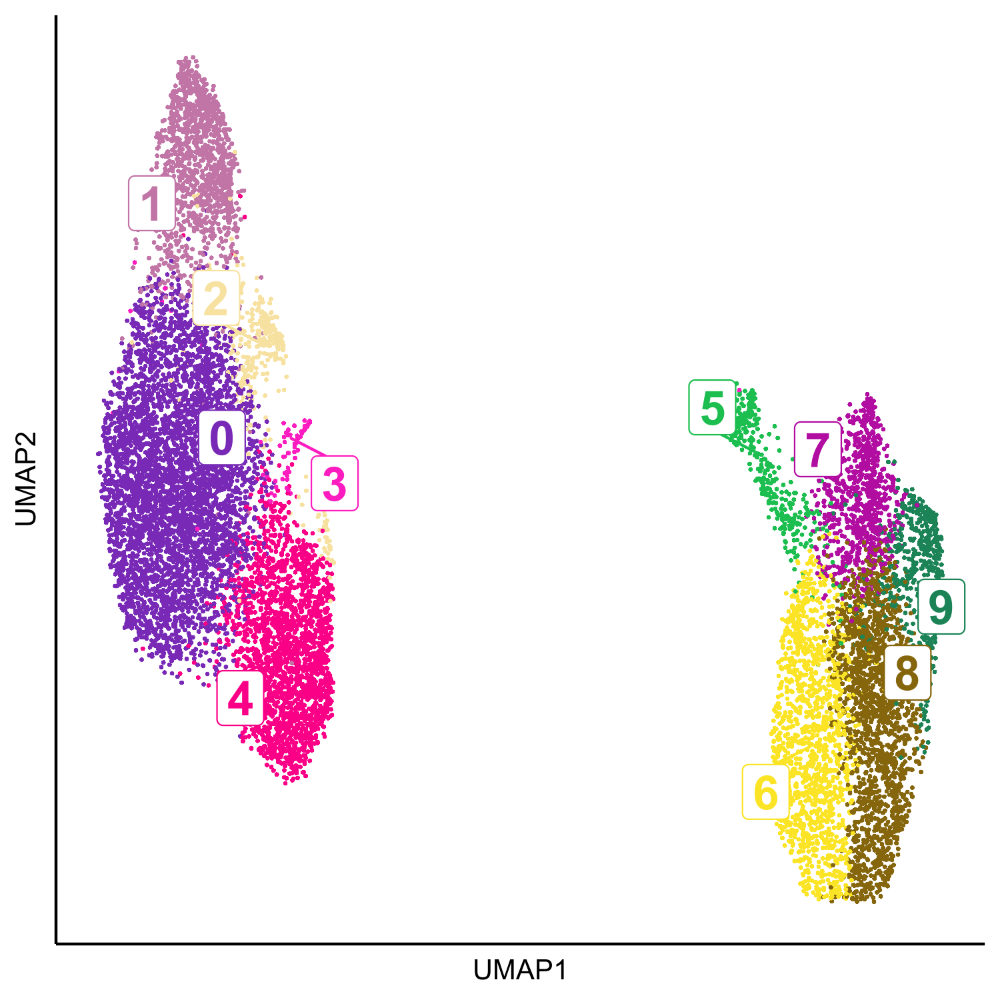

In [28]:
fig.size(5, 5)
ggplot() +
  geom_point(
    data = qcd_meta[sample(nrow(qcd_meta)), ] %>% select(hUMAP1, hUMAP2, new_cluster_number) %>% 
              mutate(new_cluster_number = as.factor(new_cluster_number)), 
    aes(x = hUMAP1, y = hUMAP2, color = new_cluster_number),
    size = 0.75, stroke = 0.02
  ) +
  ggrepel::geom_label_repel(
    data = cluster_center,
    aes(x = hUMAP1, y = hUMAP2, label = new_cluster_number, color = as.factor(new_cluster_number)),
    size = 6,  fontface = "bold",
    box.padding = unit(0.5, "lines"),
    point.padding = unit(0.01, "lines")
  ) +
    scale_color_manual(values =as.vector(rev(polychrome(26)))) +
    theme_classic() +
  theme(
    legend.position = "none",
          axis.title = element_text(size = 10),
          axis.text = element_blank(),
          axis.ticks = element_blank(),
          plot.title = element_text(hjust = 0.5, size = 18, face = "bold")
  ) +
    labs(x = "UMAP1", y = "UMAP2") +
    guides(color = guide_legend(ncol = 1, override.aes = list(size = 8))) 

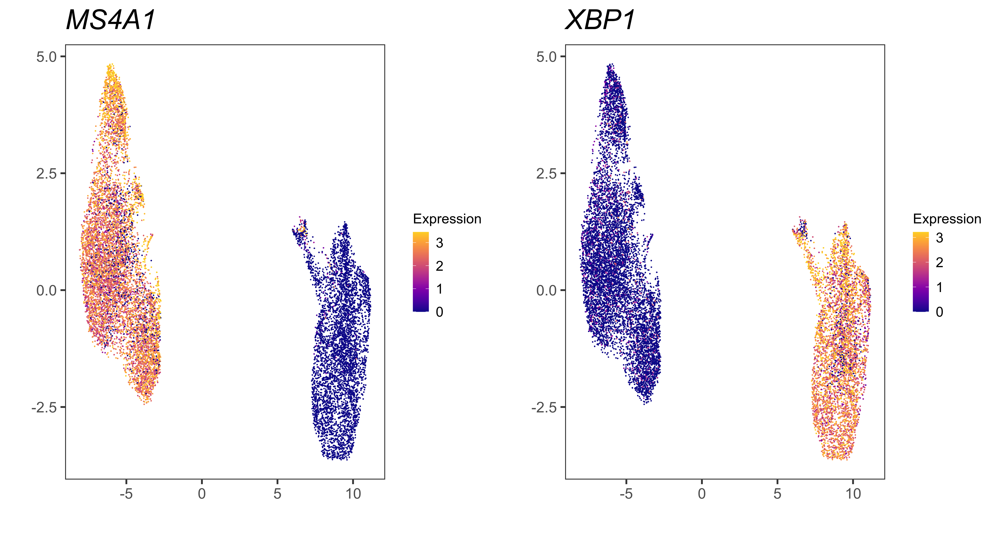

In [29]:
library(cowplot)
plot_shuffled_features <- function(input_df, input_norm, feature, pct) {
    
max.cutoff = quantile(input_norm[feature, input_df$cell], pct)
min.cutoff = quantile(input_norm[feature, input_df$cell], 1-pct)

plot_df <- input_df 
    
plot_df$norm_expression <- input_norm[feature, input_df$cell]
    
plot_df <- plot_df %>% 
                mutate(norm_expression = ifelse(norm_expression < min.cutoff, min.cutoff, norm_expression)) %>%
                mutate(norm_expression = ifelse(norm_expression > max.cutoff, max.cutoff, norm_expression)) 

p <- ggplot() +
        geom_point(
            data = plot_df[sample(nrow(plot_df)), ] %>% 
                      select(hUMAP1, hUMAP2, norm_expression), 
            aes(x = hUMAP1, y = hUMAP2, color = norm_expression),
            size = 0.75, stroke = 0.02) +
      scale_color_viridis(option = "plasma", end = .9, name = "Expression") +
      labs(x="", y="", title = feature)+
      theme_bw(base_size = 20)+
      #facet_wrap(~dataset)+
      theme(
        legend.text = element_text(size = 15), 
        legend.title = element_text(size = 15),
        panel.grid = element_blank(),
        plot.title = element_text(color="black", size=30, face="italic"),
        strip.text.x = element_text(size = 25)) 
return(p)
}

options(repr.plot.height = 8, repr.plot.width = 15)

plot_grid(plot_shuffled_features(qcd_meta, qcd_norm, "MS4A1", 0.95), 
          plot_shuffled_features(qcd_meta, qcd_norm, "XBP1", 0.95),
          ncol = 2)

In [30]:
wilcox <- wilcoxauc(qcd_norm[, qcd_meta %>% filter(dataset == "scRNAseq" ) %>% pull(cell)], 
                    qcd_meta %>% filter(dataset == "scRNAseq") %>% pull(new_cluster_number))

feature,group,avgExpr,logFC,statistic,auc,pval,padj,pct_in,pct_out
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
JCHAIN,5,3.097321,2.1505236,3937066,0.7980879,2.172546e-133,3.258909e-131,85.35980,30.47137
MZB1,5,3.083948,1.9518833,4265681,0.8647019,3.635181e-161,7.602929e-159,94.54094,45.40479
HSP90B1,5,3.044223,1.8768529,4355956,0.8830017,9.968973e-162,2.109100e-159,93.54839,58.70435
TXNDC5,5,2.404197,1.6748884,4227242,0.8569100,2.314763e-168,5.465976e-166,89.57816,37.95442
PPIB,5,2.518536,1.6717723,4448611,0.9017839,3.097308e-179,8.214823e-177,93.79653,57.11135
XBP1,5,2.434346,1.5248156,3971718,0.8051122,4.193000e-120,4.982727e-118,89.57816,40.20096
SEC11C,5,2.293251,1.4189741,4217894,0.8550151,7.930349e-149,1.409023e-146,92.30769,48.47643
SUB1,5,2.839799,1.4039709,4268134,0.8651991,3.008015e-139,4.766075e-137,93.79653,77.56719
SEC61B,5,2.275162,1.3428387,4460632,0.9042207,1.115289e-179,2.979612e-177,97.76675,58.82689
